In [ ]:

import pandas as pd
import numpy as np
import time
import warnings
warnings.filterwarnings('ignore')
# Statistical and Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
# Load the dataset
file_path = '/content/Density_Prediction_Dataset.csv'
df = pd.read_csv(file_path)
df.head()

,Nano Particle,Base Fluid,Temperature (°C),Volume Concentration (ϕ),Density of Nano Particle 1 (ρnp),Density of Nano Particle 2 (ρnp),Density of Base Fluid (ρbf),Volume Mixture of Particle 1,Volume Mixture of Particle 2,Density (ρ)
0,Al₂O₃/SiO₂,Water,20,0.05,3890,2220,998.29,20,80,1004.814815
1,Al₂O₃/SiO₂,Water,30,0.05,3890,2220,995.71,20,80,1002.222222
2,Al₂O₃/SiO₂,Water,40,0.05,3890,2220,992.25,20,80,997.037037
3,Al₂O₃/SiO₂,Water,50,0.05,3890,2220,988.02,20,80,994.444444
4,Al₂O₃/SiO₂,Water,60,0.05,3890,2220,983.13,20,80,990.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 436 entries, 0 to 435
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Nano Particle                     436 non-null    object 
 1   Base Fluid                        436 non-null    object 
 2   Temperature (°C)                  436 non-null    int64  
 3   Volume Concentration (ϕ)          436 non-null    float64
 4   Density of Nano Particle 1 (ρnp)  436 non-null    int64  
 5   Density of Nano Particle 2 (ρnp)  436 non-null    int64  
 6   Density of Base Fluid (ρbf)       436 non-null    float64
 7   Volume Mixture of Particle 1      436 non-null    int64  
 8   Volume Mixture of Particle 2      436 non-null    int64  
 9   Density (ρ)                       436 non-null    float64
dtypes: float64(3), int64(5), object(2)
memory usage: 34.2+ KB


In [ ]:
# Get unique values in the "Nano Particle" column
nano_particle_unique = df['Nano Particle'].unique()
print("Unique values in 'Nano Particle':")
print(nano_particle_unique)

# Get unique values in the "Base Fluid" column
base_fluid_unique = df['Base Fluid'].unique()
print("\nUnique values in 'Base Fluid':")
print(base_fluid_unique)

Unique values in 'Nano Particle':
['Al₂O₃/SiO₂ ' 'TiO₂-SiO₂ ' 'Fe₃O₄-MWCNT ' 'Al₂O₃-CNT ' 'Al₂O₃-MWCNT '
 'TiO₂-MWCNT ' 'CeO₂-MWCNT ' 'ZnO-MWCNT ' 'MgO-MWCNT ' 'CuO-MWCNT '
 ' Co₃O₄/rGO ' 'TiO₂-MgO ' 'Ag-GNP ' 'ND-Fe₃O₄ ']

Unique values in 'Base Fluid':
['Water' 'GB' 'DW' 'W-EG(60:40%), Water ']


In [ ]:
print(f"Number of unique 'Nano Particle' values: {df['Nano Particle'].nunique()}")
print(f"Number of unique 'Base Fluid' values: {df['Base Fluid'].nunique()}")

Number of unique 'Nano Particle' values: 14
Number of unique 'Base Fluid' values: 4


In [ ]:
df.columns

Index(['Nano Particle', 'Base Fluid', 'Temperature (°C)',
       'Volume Concentration (ϕ)', 'Density of Nano Particle 1 (ρnp)',
       'Density of Nano Particle 2 (ρnp)', 'Density of Base Fluid (ρbf)',
       'Volume Mixture of Particle 1', 'Volume Mixture of Particle 2',
       'Density (ρ)'],
      dtype='object')

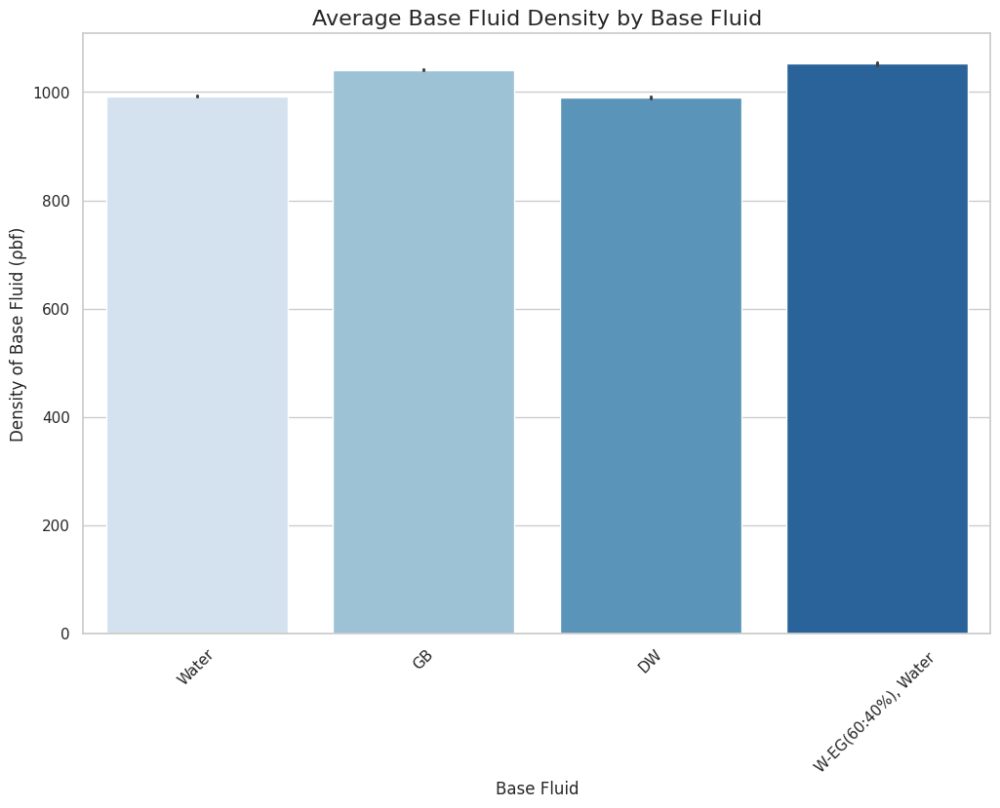

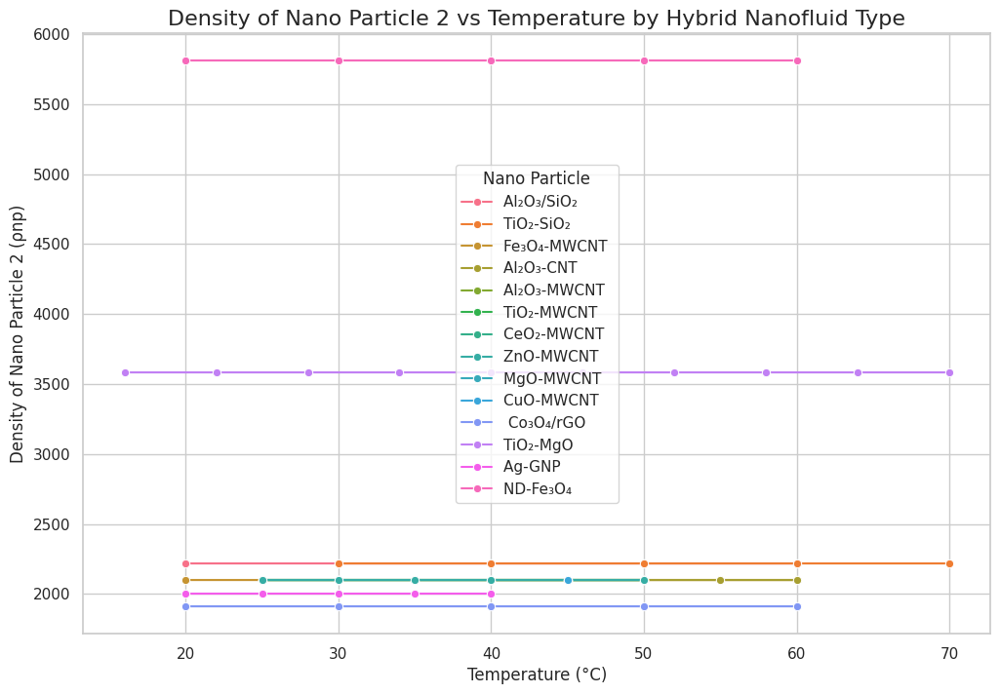

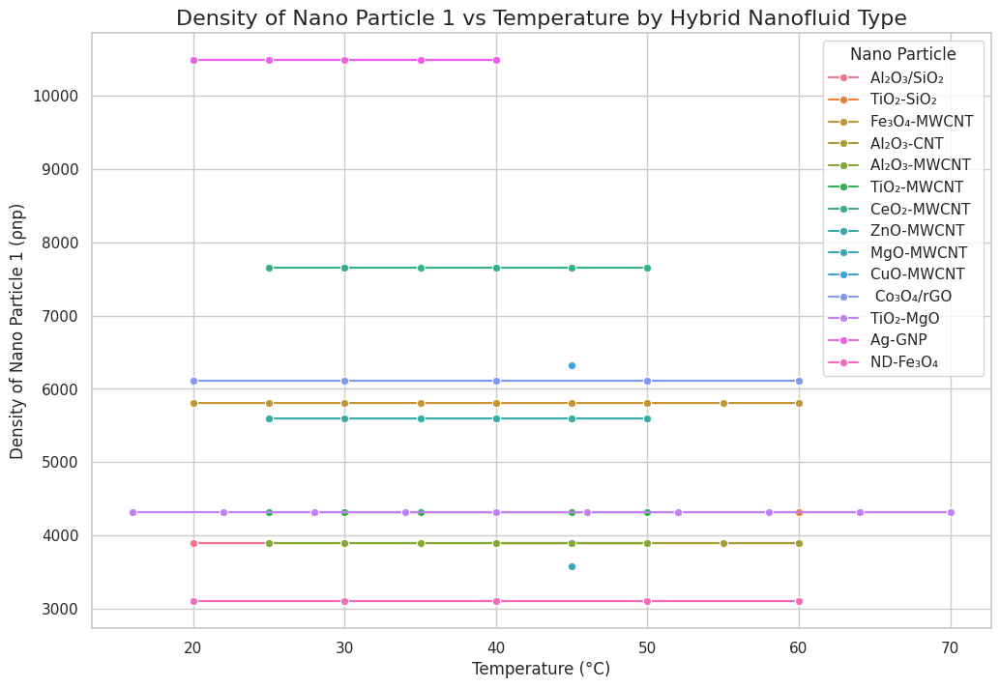

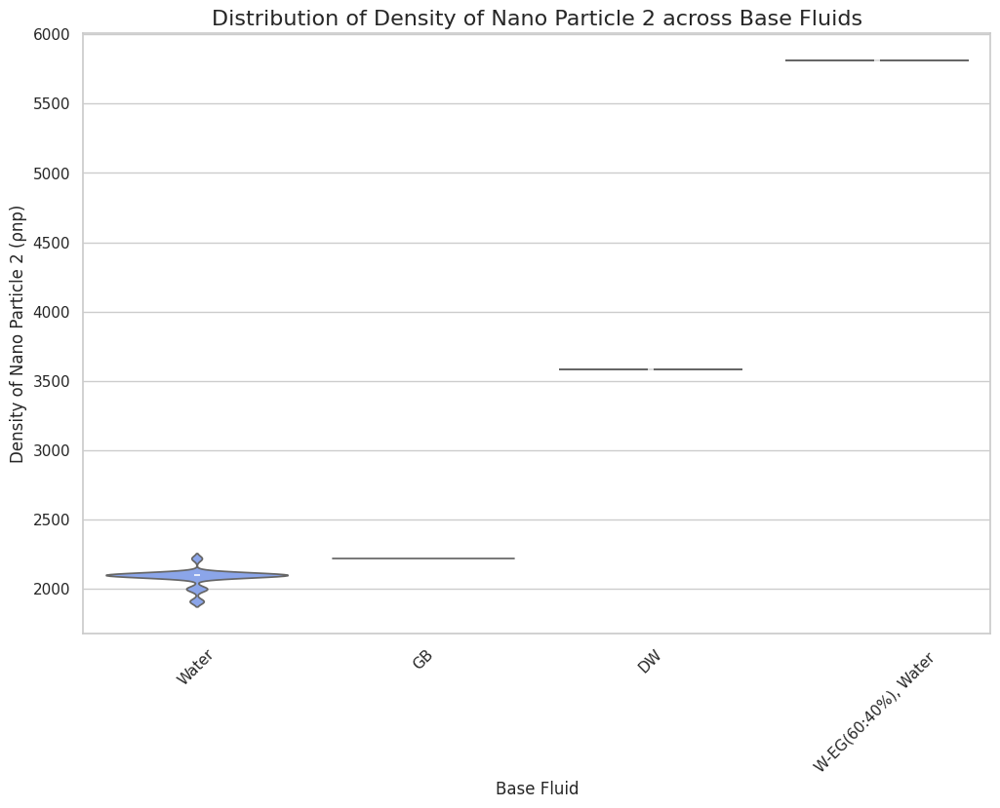

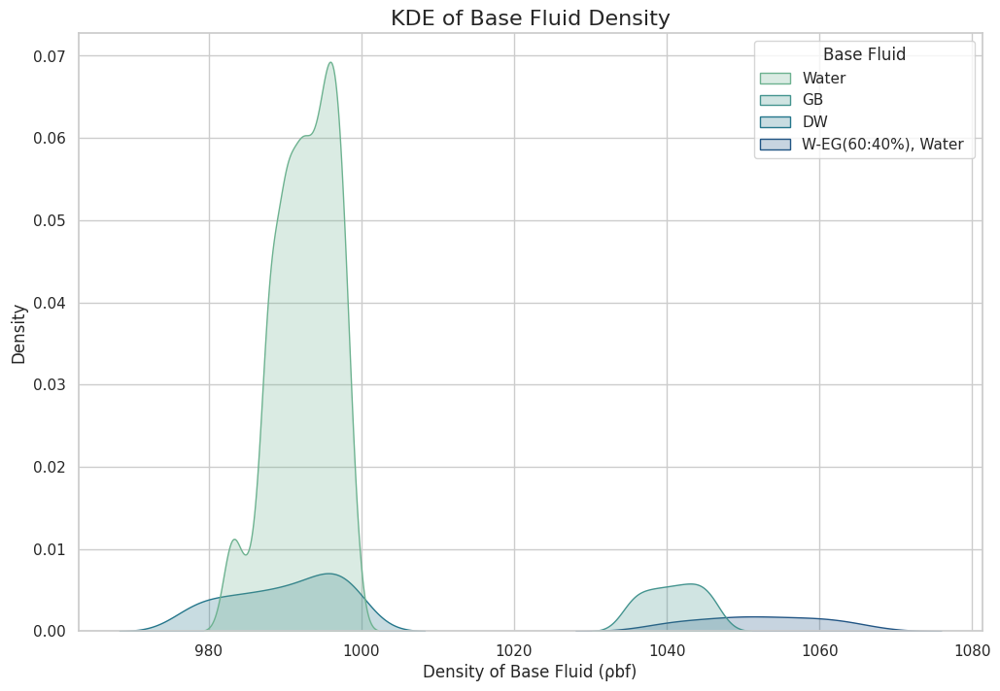

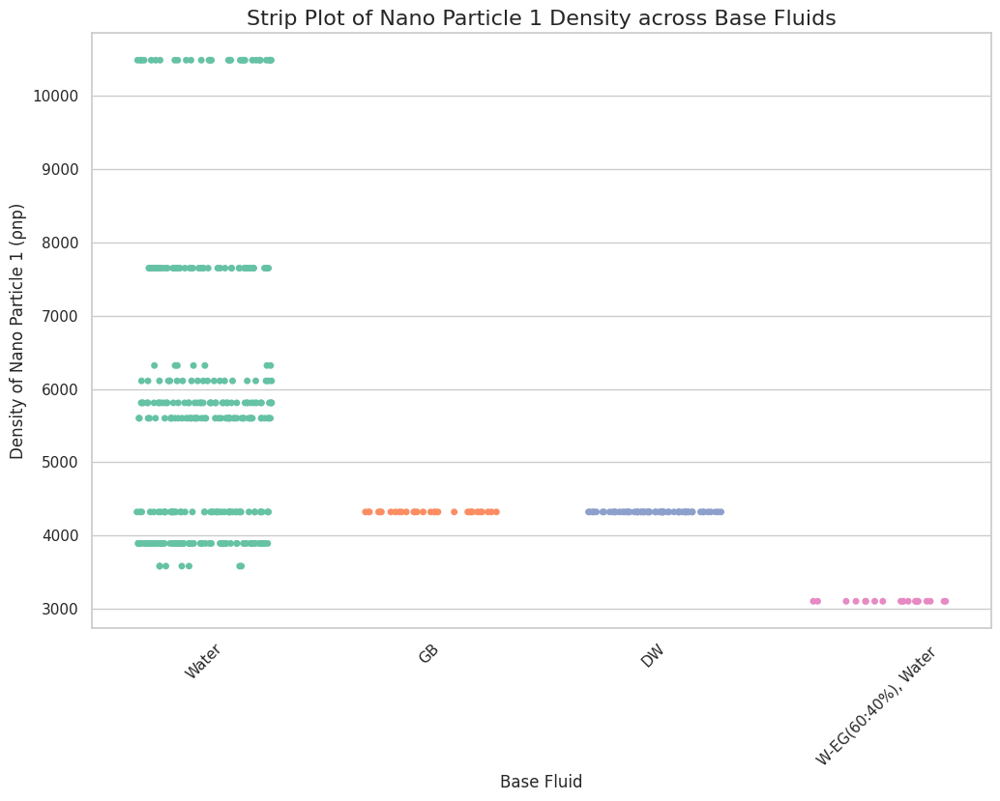

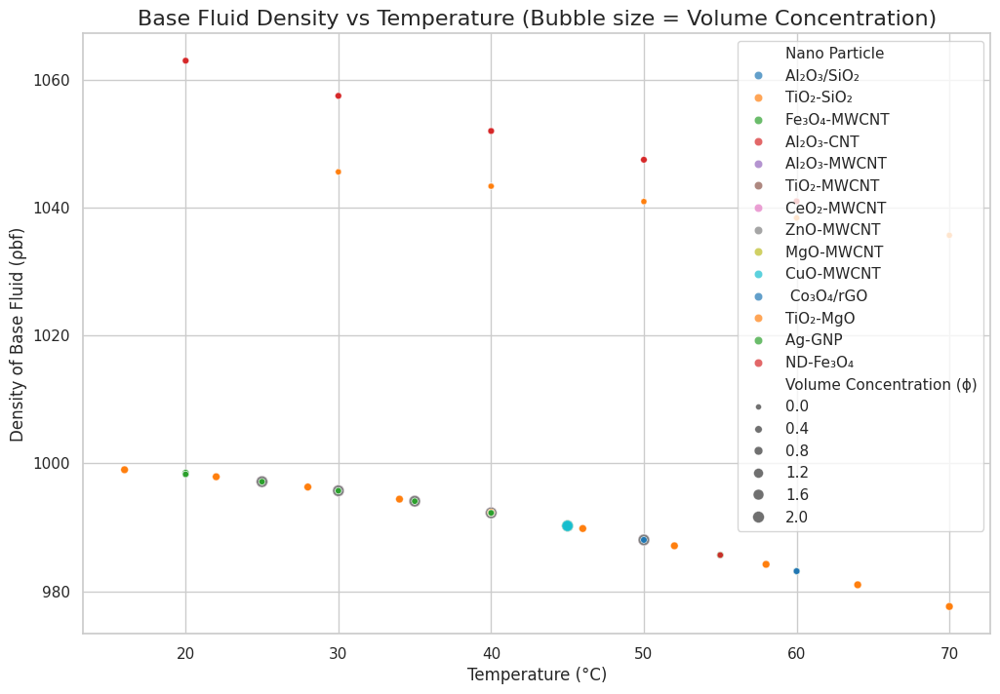

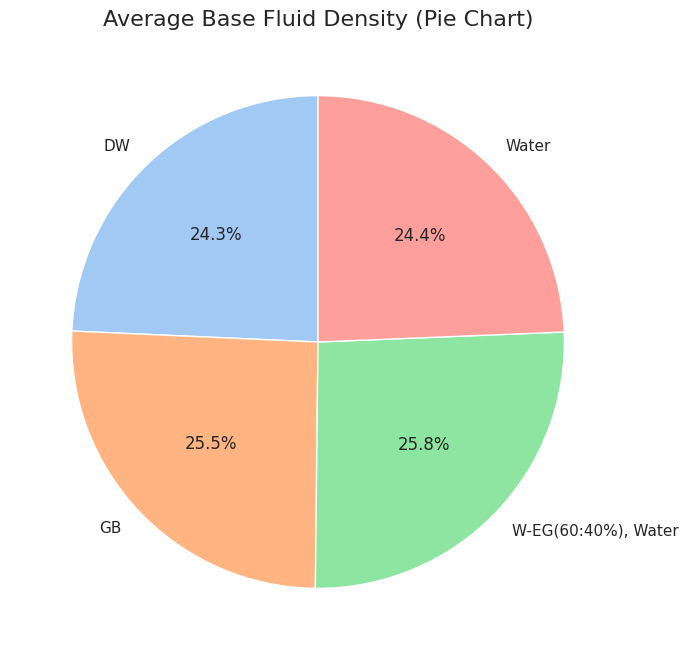

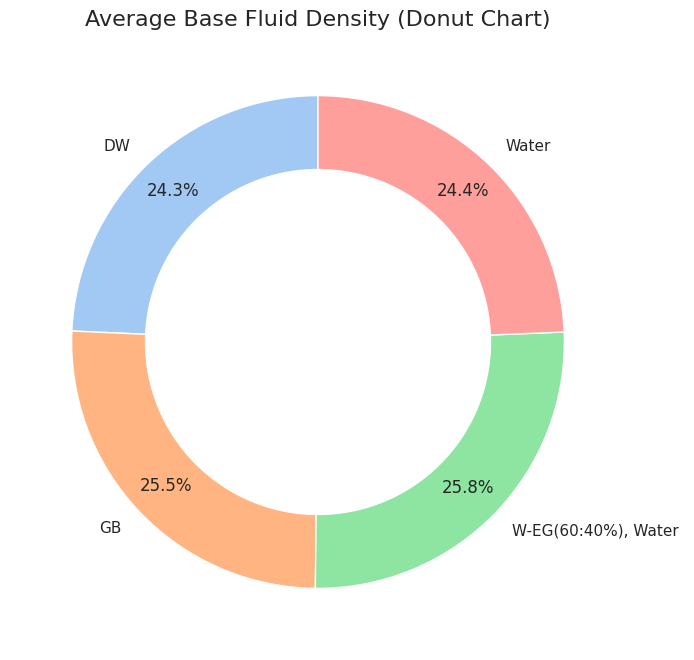

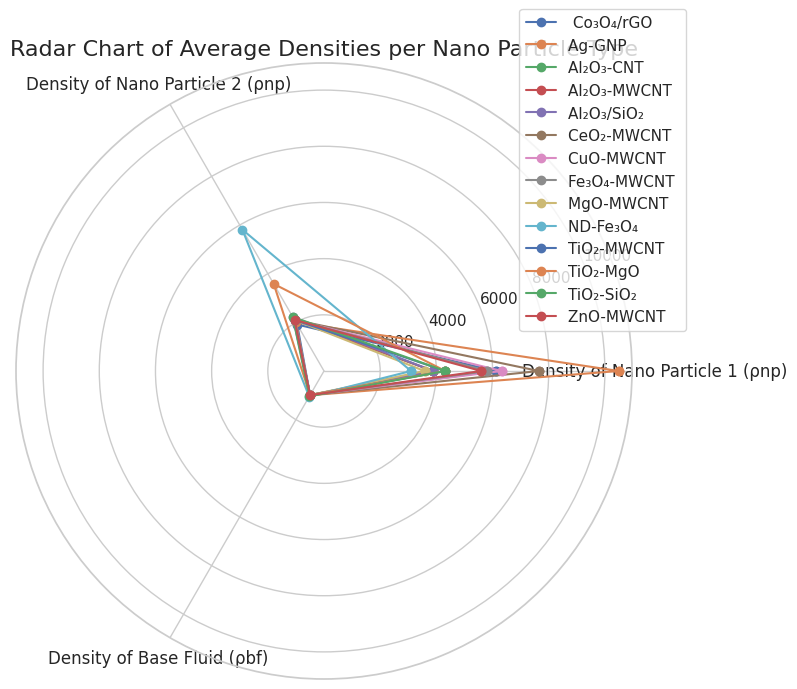

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set(style="whitegrid")

# ---------------- BAR PLOT ----------------
plt.figure(figsize=(12, 8))
sns.barplot(data=df, x="Base Fluid", y="Density of Base Fluid (ρbf)", palette="Blues")
plt.title("Average Base Fluid Density by Base Fluid", fontsize=16)
plt.xticks(rotation=45)
plt.show()

# ---------------- LINE PLOT ----------------
plt.figure(figsize=(12, 8))
sns.lineplot(data=df, x="Temperature (°C)", y="Density of Nano Particle 2 (ρnp)",
             hue="Nano Particle", marker="o", palette="husl")
plt.title("Density of Nano Particle 2 vs Temperature by Hybrid Nanofluid Type", fontsize=16)
plt.show()

plt.figure(figsize=(12, 8))
sns.lineplot(data=df, x="Temperature (°C)", y="Density of Nano Particle 1 (ρnp)",
             hue="Nano Particle", marker="o", palette="husl")
plt.title("Density of Nano Particle 1 vs Temperature by Hybrid Nanofluid Type", fontsize=16)
plt.show()


# ---------------- VIOLIN PLOT ----------------
plt.figure(figsize=(12, 8))
sns.violinplot(data=df, x="Base Fluid", y="Density of Nano Particle 2 (ρnp)", palette="coolwarm")
plt.title("Distribution of Density of Nano Particle 2 across Base Fluids", fontsize=16)
plt.xticks(rotation=45)
plt.show()

# ---------------- KDE PLOT ----------------
plt.figure(figsize=(12, 8))
sns.kdeplot(data=df, x="Density of Base Fluid (ρbf)", hue="Base Fluid", fill=True, palette="crest")
plt.title("KDE of Base Fluid Density", fontsize=16)
plt.show()

# ---------------- STRIP PLOT ----------------
plt.figure(figsize=(12, 8))
sns.stripplot(data=df, x="Base Fluid", y="Density of Nano Particle 1 (ρnp)", palette="Set2", jitter=0.3)
plt.title("Strip Plot of Nano Particle 1 Density across Base Fluids", fontsize=16)
plt.xticks(rotation=45)
plt.show()

# ---------------- SCATTER PLOT ----------------
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df, x="Temperature (°C)", y="Density of Base Fluid (ρbf)",
                size="Volume Concentration (ϕ)", hue="Nano Particle", palette="tab10", alpha=0.7)
plt.title("Base Fluid Density vs Temperature (Bubble size = Volume Concentration)", fontsize=16)
plt.show()

# ---------------- PIE & DONUT PLOTS ----------------
# Pie chart for average density of base fluids
basefluid_density = df.groupby("Base Fluid")["Density of Base Fluid (ρbf)"].mean()
plt.figure(figsize=(12, 8))
plt.pie(basefluid_density, labels=basefluid_density.index, autopct='%1.1f%%', startangle=90,
        colors=sns.color_palette("pastel"))
plt.title("Average Base Fluid Density (Pie Chart)", fontsize=16)
plt.show()

# Donut chart
plt.figure(figsize=(12, 8))
wedges, texts, autotexts = plt.pie(basefluid_density, labels=basefluid_density.index,
                                   autopct='%1.1f%%', startangle=90, pctdistance=0.85,
                                   colors=sns.color_palette("pastel"))
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title("Average Base Fluid Density (Donut Chart)", fontsize=16)
plt.show()

# ---------------- RADAR CHART ----------------
# Normalizing values for radar plot
attributes = ["Density of Nano Particle 1 (ρnp)", "Density of Nano Particle 2 (ρnp)", "Density of Base Fluid (ρbf)"]
radar_data = df.groupby("Nano Particle")[attributes].mean()

labels = radar_data.index
angles = np.linspace(0, 2 * np.pi, len(attributes), endpoint=False).tolist()
angles += angles[:1]

plt.figure(figsize=(12, 8))
for i, row in radar_data.iterrows():
    values = row.tolist()
    values += values[:1]
    plt.polar(angles, values, marker='o', label=i)

plt.xticks(angles[:-1], attributes, fontsize=12)
plt.title("Radar Chart of Average Densities per Nano Particle Type", fontsize=16)
plt.legend(bbox_to_anchor=(1.1, 1.1))
plt.show()


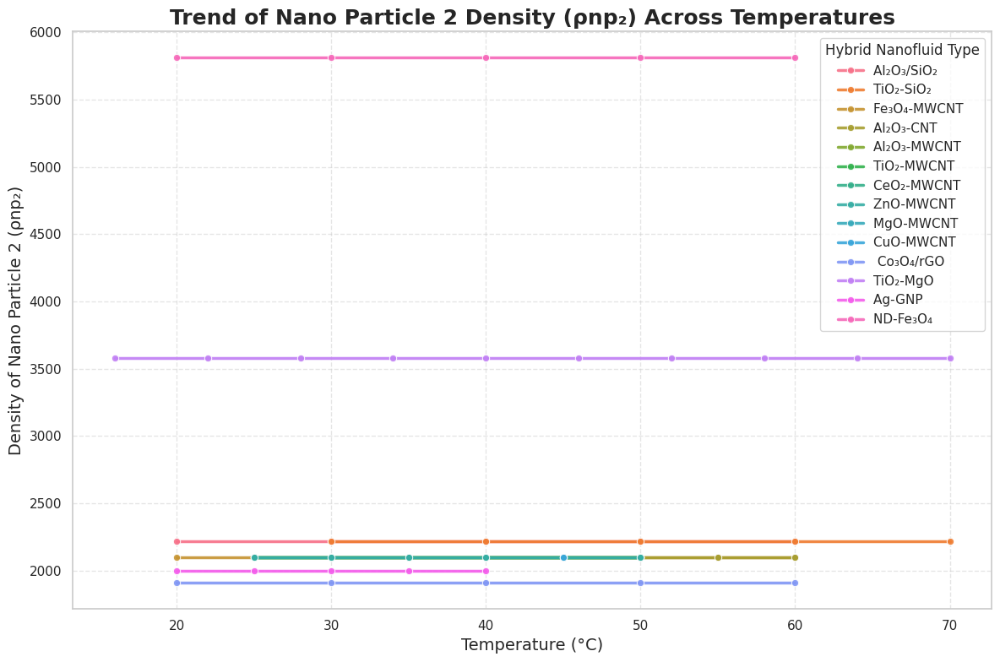

In [ ]:
plt.figure(figsize=(12, 8))
sns.lineplot(
    data=df,
    x="Temperature (°C)",
    y="Density of Nano Particle 2 (ρnp)",
    hue="Nano Particle",
    marker="o",
    palette="husl",
    linewidth=2.5,
    alpha=0.9
)

# Title and labels
plt.title("Trend of Nano Particle 2 Density (ρnp₂) Across Temperatures", fontsize=18, weight='bold')
plt.xlabel("Temperature (°C)", fontsize=14)
plt.ylabel("Density of Nano Particle 2 (ρnp₂)", fontsize=14)

# Improve legend
plt.legend(title="Hybrid Nanofluid Type", title_fontsize=12, fontsize=11, loc='best', frameon=True)

# Add grid and styling
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [ ]:

import pandas as pd
import numpy as np
import time
import warnings
warnings.filterwarnings('ignore')
# Statistical and Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
# Load the dataset
file_path = '/content/Density_Prediction_Dataset.csv'
df = pd.read_csv(file_path)
df.head()

,Nano Particle,Base Fluid,Temperature (°C),Volume Concentration (ϕ),Density of Nano Particle 1 (ρnp),Density of Nano Particle 2 (ρnp),Density of Base Fluid (ρbf),Volume Mixture of Particle 1,Volume Mixture of Particle 2,Density (ρ)
0,Al₂O₃/SiO₂,Water,20,0.05,3890,2220,998.29,20,80,1004.814815
1,Al₂O₃/SiO₂,Water,30,0.05,3890,2220,995.71,20,80,1002.222222
2,Al₂O₃/SiO₂,Water,40,0.05,3890,2220,992.25,20,80,997.037037
3,Al₂O₃/SiO₂,Water,50,0.05,3890,2220,988.02,20,80,994.444444
4,Al₂O₃/SiO₂,Water,60,0.05,3890,2220,983.13,20,80,990.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 436 entries, 0 to 435
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Nano Particle                     436 non-null    object 
 1   Base Fluid                        436 non-null    object 
 2   Temperature (°C)                  436 non-null    int64  
 3   Volume Concentration (ϕ)          436 non-null    float64
 4   Density of Nano Particle 1 (ρnp)  436 non-null    int64  
 5   Density of Nano Particle 2 (ρnp)  436 non-null    int64  
 6   Density of Base Fluid (ρbf)       436 non-null    float64
 7   Volume Mixture of Particle 1      436 non-null    int64  
 8   Volume Mixture of Particle 2      436 non-null    int64  
 9   Density (ρ)                       436 non-null    float64
dtypes: float64(3), int64(5), object(2)
memory usage: 34.2+ KB


In [ ]:
df.describe()

,Temperature (°C),Volume Concentration (ϕ),Density of Nano Particle 1 (ρnp),Density of Nano Particle 2 (ρnp),Density of Base Fluid (ρbf),Volume Mixture of Particle 1,Volume Mixture of Particle 2,Density (ρ)
count,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000
mean,39.701835,0.594828,5380.229358,2470.642202,998.243922,57.522936,42.477064,1016.367329
std,12.444935,0.641171,1858.166923,895.044108,17.723083,28.018663,28.018663,22.694970
min,16.000000,0.000000,3100.000000,1910.000000,977.600000,17.000000,20.000000,983.010000
25%,30.000000,0.100000,4320.000000,2100.000000,990.220000,20.000000,20.000000,998.687325
50%,40.000000,0.300000,4320.000000,2100.000000,994.080000,80.000000,20.000000,1010.319085
75%,50.000000,1.000000,5810.000000,2220.000000,997.130000,80.000000,80.000000,1028.173007
max,70.000000,2.000000,10490.000000,5810.000000,1063.000000,80.000000,83.000000,1093.432000


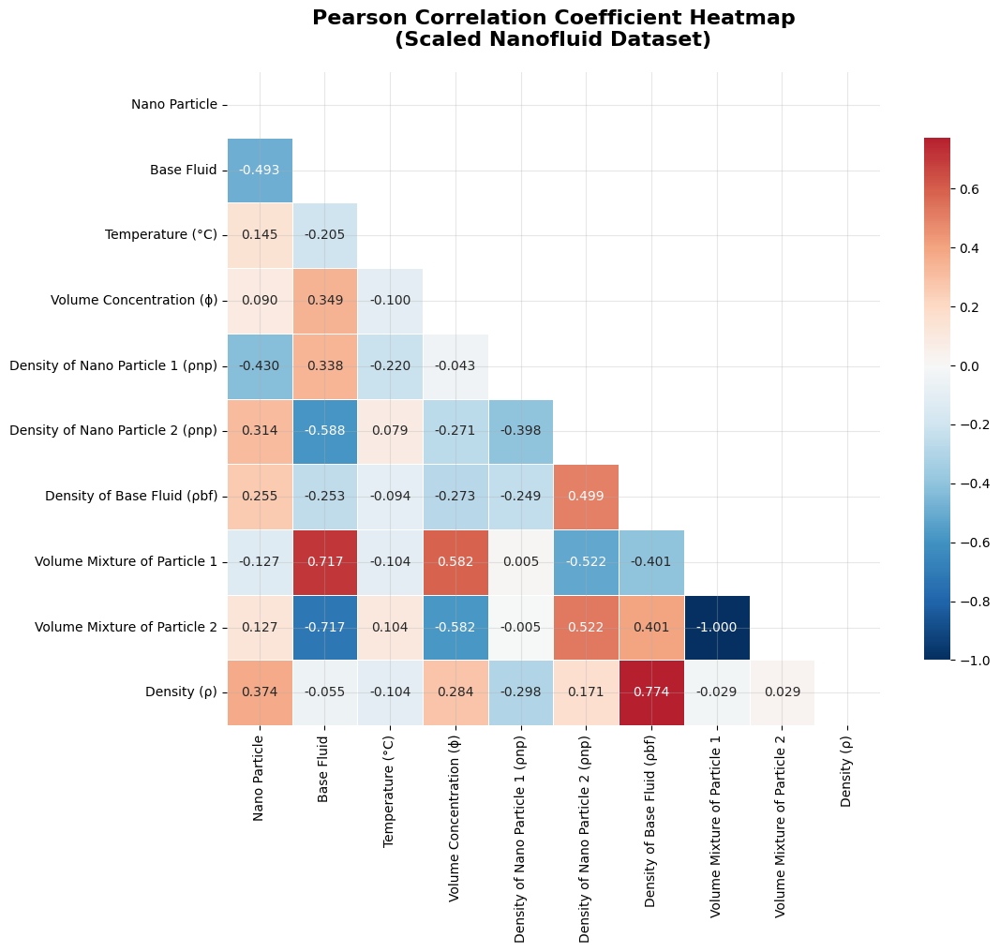

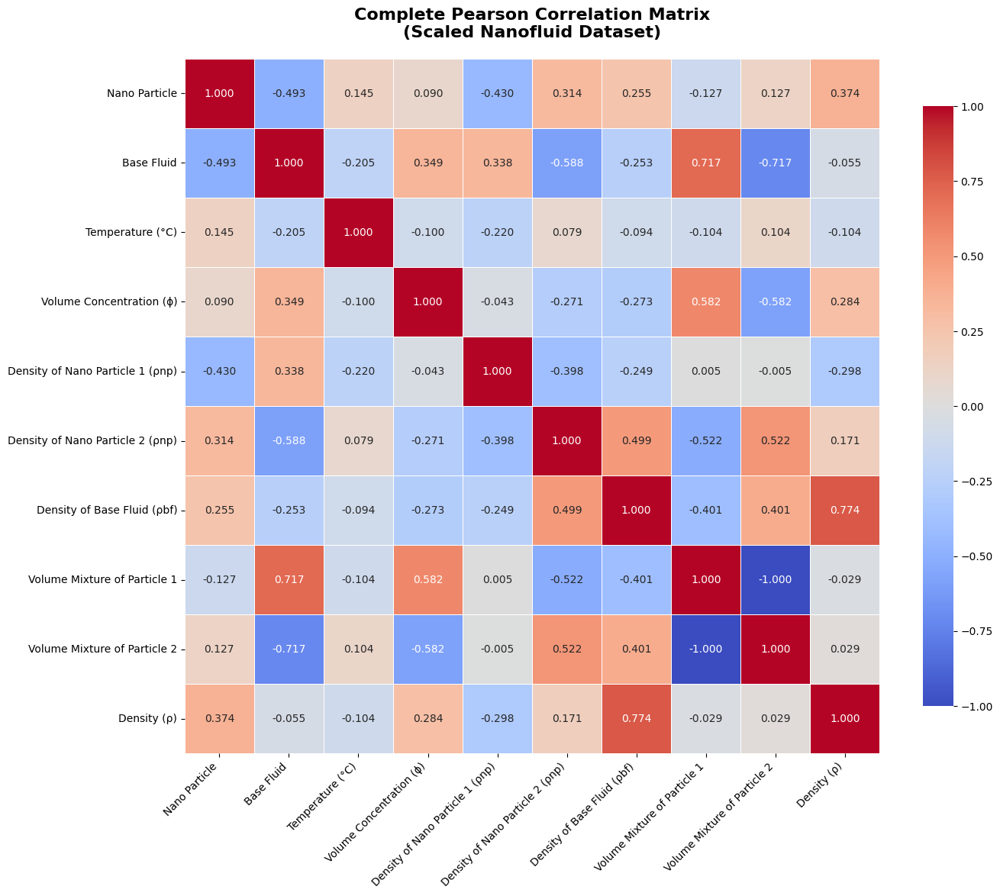


STRONG CORRELATIONS ANALYSIS
Strong correlations (|correlation| > 0.5):
                          Feature_1                         Feature_2  \
8      Volume Mixture of Particle 1      Volume Mixture of Particle 2   
7       Density of Base Fluid (ρbf)                       Density (ρ)   
1                        Base Fluid      Volume Mixture of Particle 1   
2                        Base Fluid      Volume Mixture of Particle 2   
0                        Base Fluid  Density of Nano Particle 2 (ρnp)   
4          Volume Concentration (ϕ)      Volume Mixture of Particle 2   
3          Volume Concentration (ϕ)      Volume Mixture of Particle 1   
6  Density of Nano Particle 2 (ρnp)      Volume Mixture of Particle 2   
5  Density of Nano Particle 2 (ρnp)      Volume Mixture of Particle 1   

   Correlation  
8    -1.000000  
7     0.773982  
1     0.716697  
2    -0.716697  
0    -0.587858  
4    -0.582202  
3     0.582202  
6     0.521510  
5    -0.521510  

SUMMARY
Scaled dataset sh

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
# (If you're reading from a file, use pd.read_csv('your_file.csv') instead)
# Assuming df is already loaded based on your shared df.head() and df.info()

# Step 1: Encode categorical columns
df_encoded = df.copy()
label_encoders = {}

categorical_cols = ['Nano Particle', 'Base Fluid']
for col in categorical_cols:
    le = LabelEncoder()
    df_encoded[col] = le.fit_transform(df_encoded[col])
    label_encoders[col] = le

# Step 2: Scale all features
scaler = StandardScaler()
scaled_array = scaler.fit_transform(df_encoded)

# Create a new DataFrame with scaled features
df_scaled = pd.DataFrame(scaled_array, columns=df_encoded.columns)

# Step 3: Compute Pearson correlation matrix
correlation_matrix = df_scaled.corr(method='pearson')

# Step 4: Plot heatmap (mask upper triangle)
plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix,
            annot=True,
            cmap='RdBu_r',
            center=0,
            square=True,
            fmt='.3f',
            cbar_kws={"shrink": .8},
            linewidths=0.5,
            mask=mask)
plt.title('Pearson Correlation Coefficient Heatmap\n(Scaled Nanofluid Dataset)', fontsize=16, fontweight='bold', pad=20)
plt.xticks(rotation=90, ha='center')
plt.yticks(rotation=0)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Step 5: Full heatmap (no mask)
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix,
            annot=True,
            cmap='coolwarm',
            center=0,
            square=True,
            fmt='.3f',
            cbar_kws={"shrink": .8},
            linewidths=0.5)
plt.title('Complete Pearson Correlation Matrix\n(Scaled Nanofluid Dataset)', fontsize=16, fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Step 6: Analyze strong correlations (> 0.5)
strong_correlations = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = correlation_matrix.iloc[i, j]
        if abs(corr_value) > 0.5:
            strong_correlations.append({
                'Feature_1': correlation_matrix.columns[i],
                'Feature_2': correlation_matrix.columns[j],
                'Correlation': corr_value
            })

print("\n" + "="*50)
print("STRONG CORRELATIONS ANALYSIS")
print("="*50)
if strong_correlations:
    strong_corr_df = pd.DataFrame(strong_correlations)
    strong_corr_df = strong_corr_df.sort_values('Correlation', key=abs, ascending=False)
    print("Strong correlations (|correlation| > 0.5):")
    print(strong_corr_df)
else:
    print("No strong correlations found (threshold = 0.5)")

# Summary
print("\n" + "="*50)
print("SUMMARY")
print("="*50)
print(f"Scaled dataset shape: {df_scaled.shape}")
print("Features:", list(df_scaled.columns))
print("\nFirst 5 rows of the scaled dataset:")
print(df_scaled.head())


In [ ]:
df.columns

Index(['Nano Particle', 'Base Fluid', 'Temperature (°C)',
       'Volume Concentration (ϕ)', 'Density of Nano Particle 1 (ρnp)',
       'Density of Nano Particle 2 (ρnp)', 'Density of Base Fluid (ρbf)',
       'Volume Mixture of Particle 1', 'Volume Mixture of Particle 2',
       'Density (ρ)'],
      dtype='object')

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 436 entries, 0 to 435
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Nano Particle                     436 non-null    object 
 1   Base Fluid                        436 non-null    object 
 2   Temperature (°C)                  436 non-null    int64  
 3   Volume Concentration (ϕ)          436 non-null    float64
 4   Density of Nano Particle 1 (ρnp)  436 non-null    int64  
 5   Density of Nano Particle 2 (ρnp)  436 non-null    int64  
 6   Density of Base Fluid (ρbf)       436 non-null    float64
 7   Volume Mixture of Particle 1      436 non-null    int64  
 8   Volume Mixture of Particle 2      436 non-null    int64  
 9   Density (ρ)                       436 non-null    float64
dtypes: float64(3), int64(5), object(2)
memory usage: 34.2+ KB
None

Dataset Description:
       Temperature (°C)  Volume Con

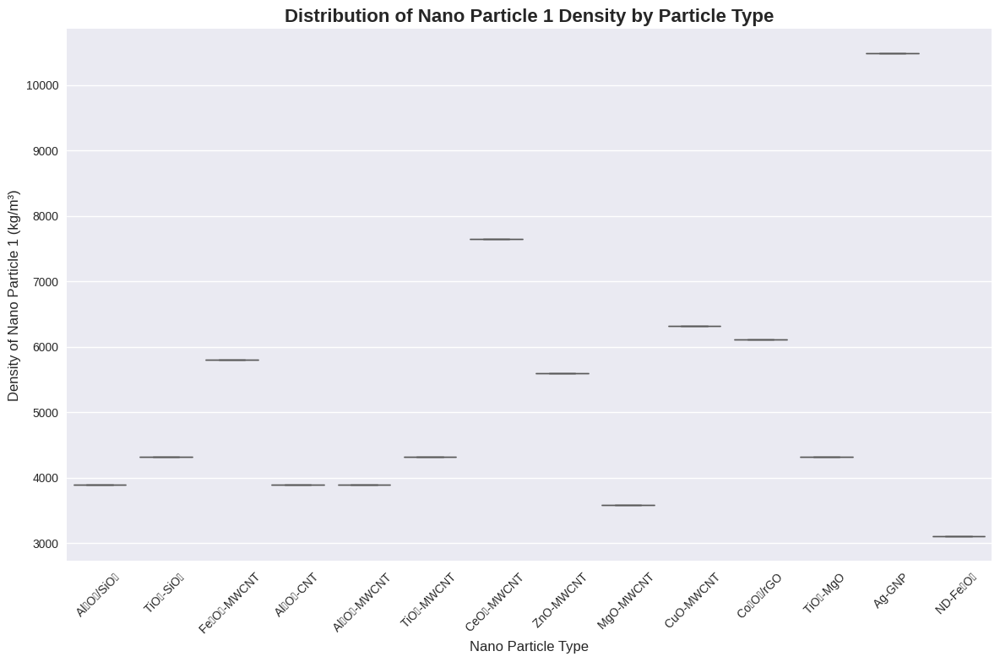

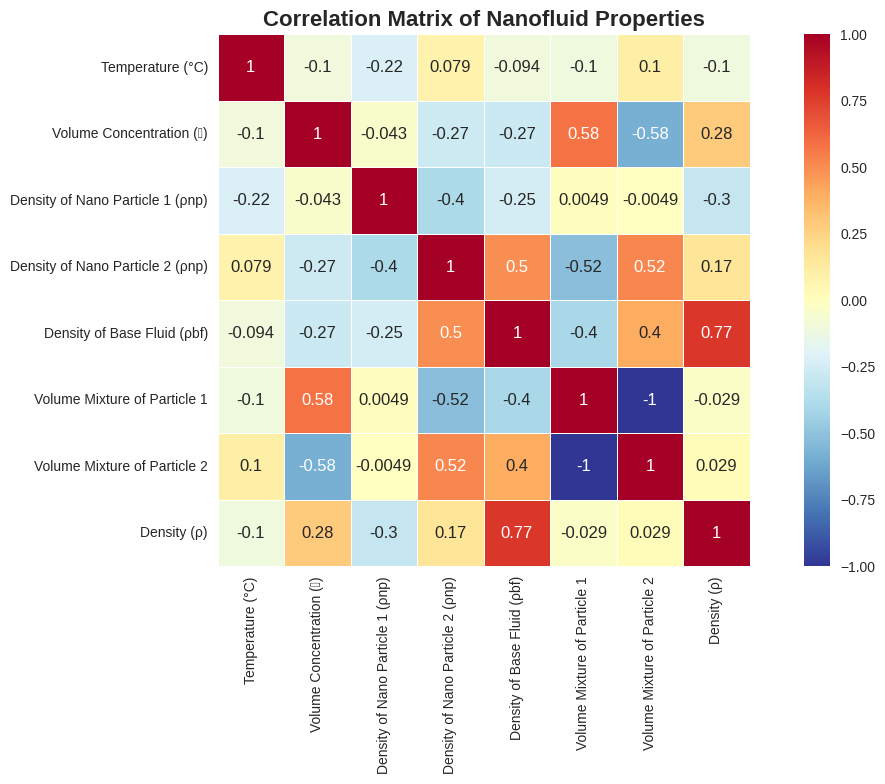

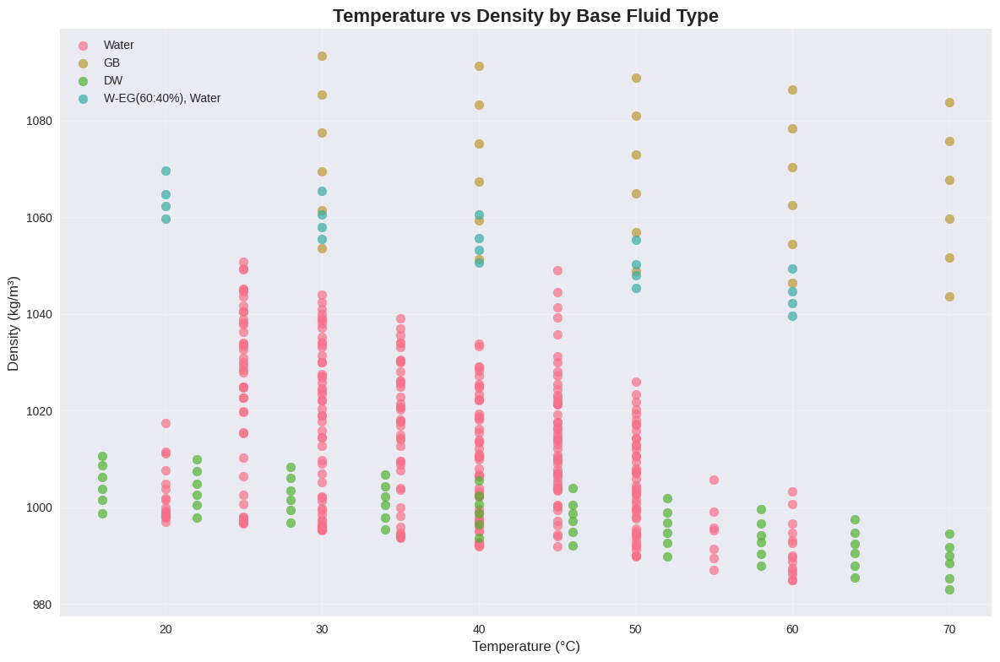

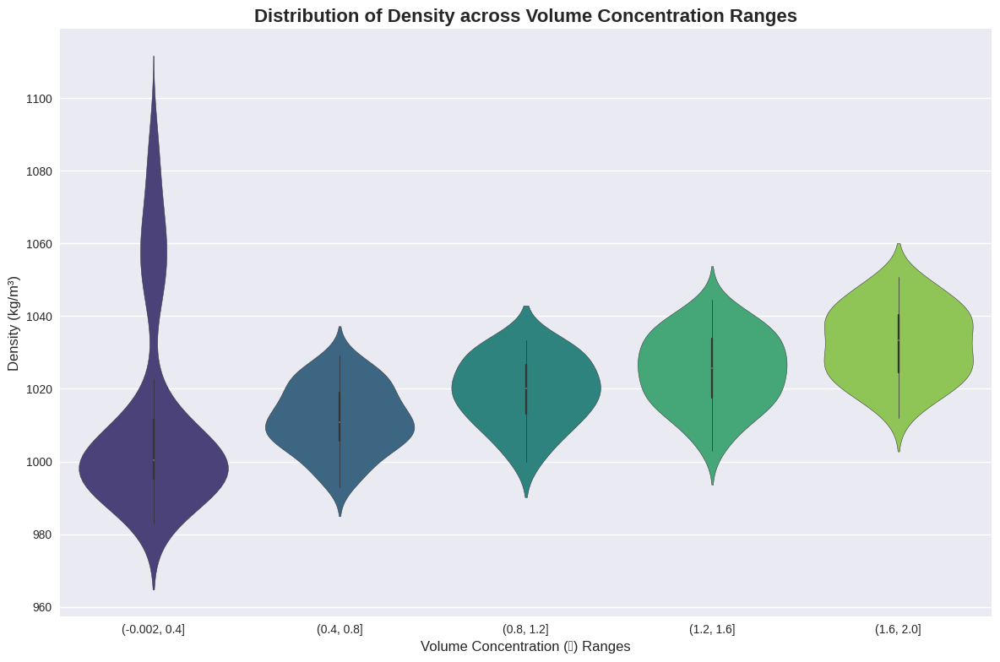

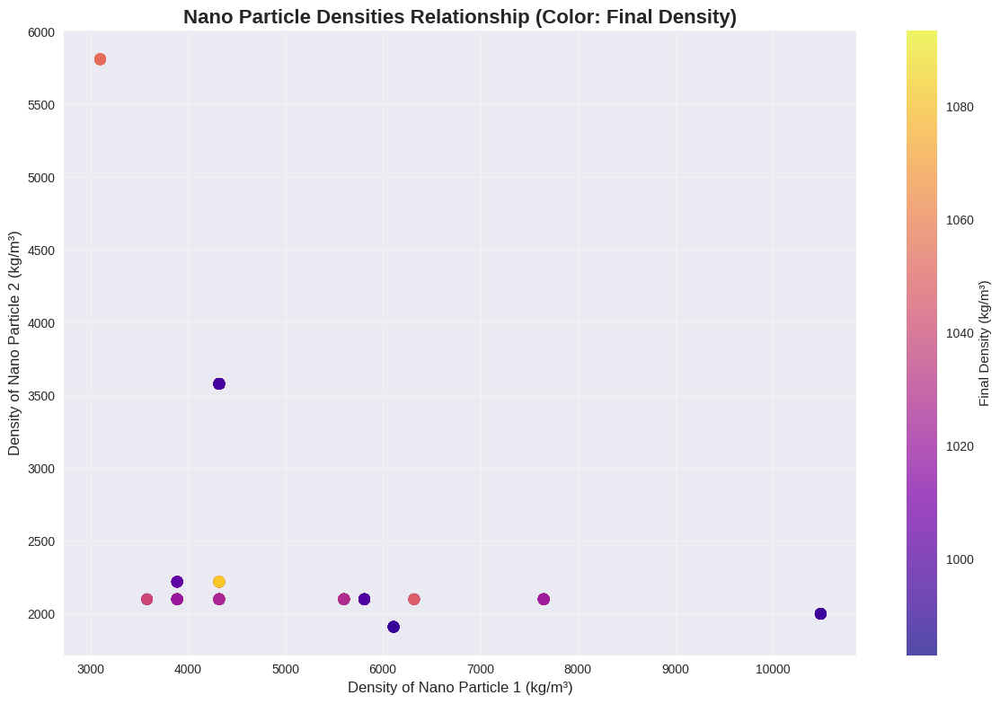

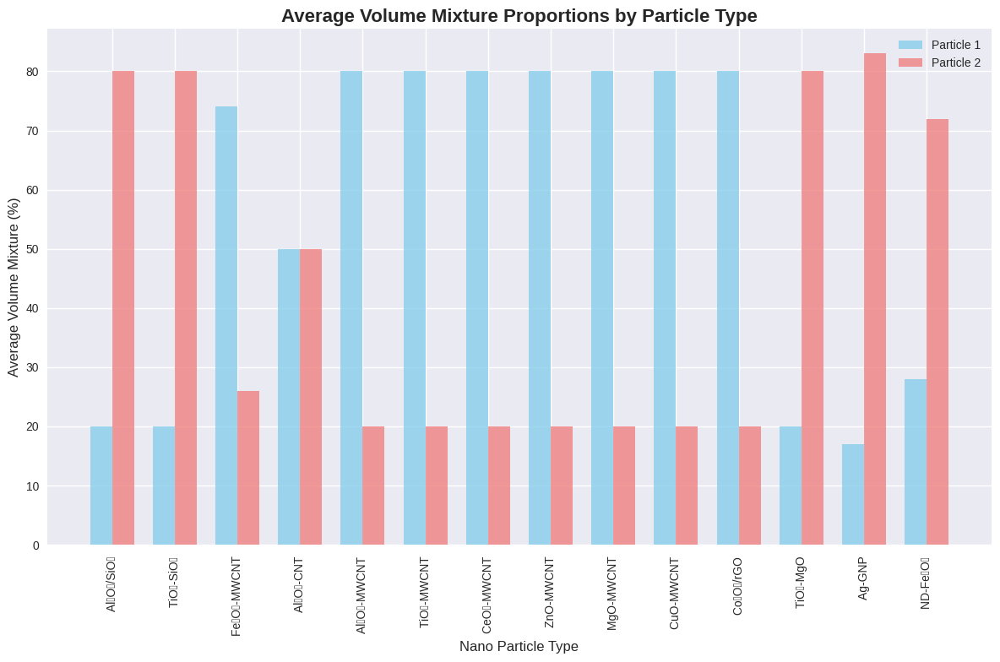

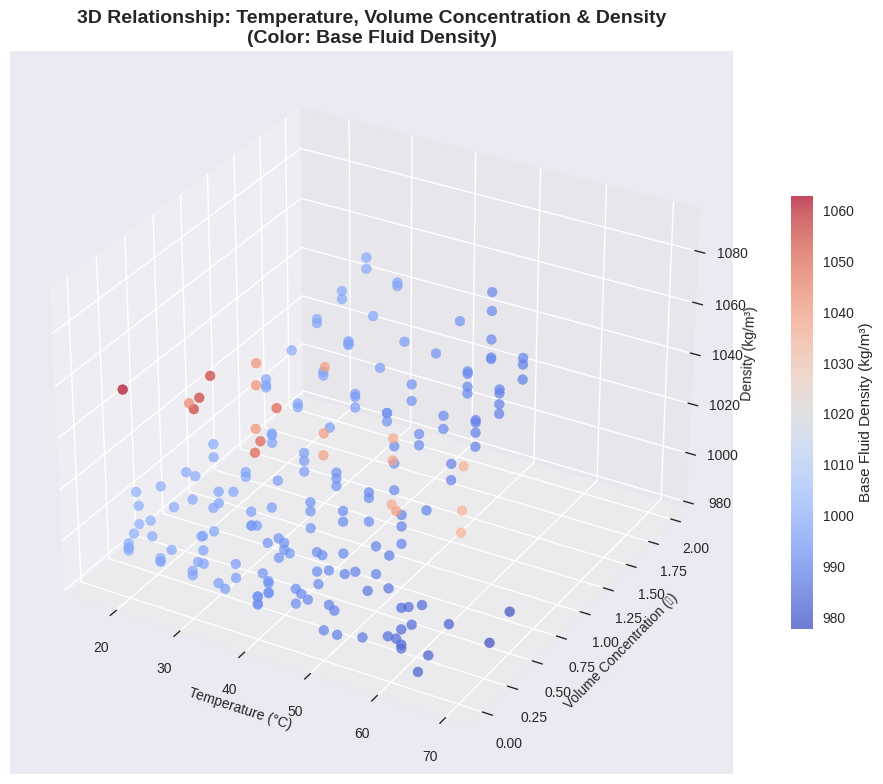


DATA PREPROCESSING AND MODEL TRAINING
Original dataset shape: (436, 11)
After outlier removal: (206, 11)
Outliers removed: 230

Nano Particle types: ['Al₂O₃-MWCNT ' 'CeO₂-MWCNT ' 'CuO-MWCNT ' 'MgO-MWCNT ' 'TiO₂-MWCNT '
 'ZnO-MWCNT ']
Base Fluid types: ['Water']

Feature matrix shape: (206, 9)
Target vector shape: (206,)
Training set shape: (164, 9)
Test set shape: (42, 9)

Training XGBoost model...

Model Performance:
RMSE: 1.4478
MAE: 1.1007
R² Score: 0.9864


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Machine Learning imports
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb


# Set style and color palettes
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Load the dataset
df = pd.read_csv('Density_Prediction_Dataset.csv')

print("Dataset Info:")
print(df.info())
print("\nDataset Description:")
print(df.describe())

# =============================================================================
# ADVANCED VISUALIZATIONS
# =============================================================================

# 1. Distribution of Density of Nano Particle 1 by Nano Particle Type
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='Nano Particle', y='Density of Nano Particle 1 (ρnp)',
            palette='Set2')
plt.title('Distribution of Nano Particle 1 Density by Particle Type', fontsize=16, fontweight='bold')
plt.xlabel('Nano Particle Type', fontsize=12)
plt.ylabel('Density of Nano Particle 1 (kg/m³)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2. Heatmap of correlations
plt.figure(figsize=(12, 8))
correlation_cols = ['Temperature (°C)', 'Volume Concentration (ϕ)',
                   'Density of Nano Particle 1 (ρnp)', 'Density of Nano Particle 2 (ρnp)',
                   'Density of Base Fluid (ρbf)', 'Volume Mixture of Particle 1',
                   'Volume Mixture of Particle 2', 'Density (ρ)']
corr_matrix = df[correlation_cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='RdYlBu_r', center=0,
            square=True, linewidths=0.5)
plt.title('Correlation Matrix of Nanofluid Properties', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# 3. Scatter plot: Temperature vs Density colored by Base Fluid
plt.figure(figsize=(12, 8))
for fluid in df['Base Fluid'].unique():
    fluid_data = df[df['Base Fluid'] == fluid]
    plt.scatter(fluid_data['Temperature (°C)'], fluid_data['Density (ρ)'],
                label=fluid, alpha=0.7, s=60)
plt.xlabel('Temperature (°C)', fontsize=12)
plt.ylabel('Density (kg/m³)', fontsize=12)
plt.title('Temperature vs Density by Base Fluid Type', fontsize=16, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 4. Violin plot: Volume Concentration vs Density
plt.figure(figsize=(12, 8))
df['Conc_Binned'] = pd.cut(df['Volume Concentration (ϕ)'], bins=5, precision=2)
sns.violinplot(data=df, x='Conc_Binned', y='Density (ρ)', palette='viridis')
plt.title('Distribution of Density across Volume Concentration Ranges', fontsize=16, fontweight='bold')
plt.xlabel('Volume Concentration (ϕ) Ranges', fontsize=12)
plt.ylabel('Density (kg/m³)', fontsize=12)
#plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 5. Density comparison: Particle 1 vs Particle 2
plt.figure(figsize=(12, 8))
plt.scatter(df['Density of Nano Particle 1 (ρnp)'], df['Density of Nano Particle 2 (ρnp)'],
            c=df['Density (ρ)'], cmap='plasma', alpha=0.7, s=80)
plt.colorbar(label='Final Density (kg/m³)')
plt.xlabel('Density of Nano Particle 1 (kg/m³)', fontsize=12)
plt.ylabel('Density of Nano Particle 2 (kg/m³)', fontsize=12)
plt.title('Nano Particle Densities Relationship (Color: Final Density)', fontsize=16, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 6. Volume mixture proportions by particle type
plt.figure(figsize=(12, 8))
particle_types = df['Nano Particle'].unique()
width = 0.35
x = np.arange(len(particle_types))

vol1_means = [df[df['Nano Particle'] == pt]['Volume Mixture of Particle 1'].mean() for pt in particle_types]
vol2_means = [df[df['Nano Particle'] == pt]['Volume Mixture of Particle 2'].mean() for pt in particle_types]

plt.bar(x - width/2, vol1_means, width, label='Particle 1', color='skyblue', alpha=0.8)
plt.bar(x + width/2, vol2_means, width, label='Particle 2', color='lightcoral', alpha=0.8)

plt.xlabel('Nano Particle Type', fontsize=12)
plt.ylabel('Average Volume Mixture (%)', fontsize=12)
plt.title('Average Volume Mixture Proportions by Particle Type', fontsize=16, fontweight='bold')
plt.xticks(x, particle_types, rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

# 7. 3D Surface plot of Temperature, Volume Concentration, and Density
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Sample data for cleaner visualization
sample_idx = np.random.choice(len(df), 200, replace=False)
sample_data = df.iloc[sample_idx]

scatter = ax.scatter(sample_data['Temperature (°C)'],
                    sample_data['Volume Concentration (ϕ)'],
                    sample_data['Density (ρ)'],
                    c=sample_data['Density of Base Fluid (ρbf)'],
                    cmap='coolwarm', alpha=0.7, s=50)

ax.set_xlabel('Temperature (°C)', fontsize=10)
ax.set_ylabel('Volume Concentration (ϕ)', fontsize=10)
ax.set_zlabel('Density (kg/m³)', fontsize=10)
ax.set_title('3D Relationship: Temperature, Volume Concentration & Density\n(Color: Base Fluid Density)',
             fontsize=14, fontweight='bold')
plt.colorbar(scatter, label='Base Fluid Density (kg/m³)', shrink=0.6)
plt.tight_layout()
plt.show()

# =============================================================================
# DATA PREPROCESSING AND MODEL TRAINING
# =============================================================================

print("\n" + "="*60)
print("DATA PREPROCESSING AND MODEL TRAINING")
print("="*60)

# 1. Outlier Detection and Removal using IQR
def remove_outliers_iqr(df, columns):
    df_clean = df.copy()
    outliers_removed = 0
    for col in columns:
        initial_count = len(df_clean)
        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df_clean = df_clean[(df_clean[col] >= lower_bound) & (df_clean[col] <= upper_bound)]
        outliers_removed += initial_count - len(df_clean)
    return df_clean, outliers_removed

# Remove outliers from numerical columns
numerical_cols = ['Temperature (°C)', 'Volume Concentration (ϕ)', 'Density of Nano Particle 1 (ρnp)',
                 'Density of Nano Particle 2 (ρnp)', 'Density of Base Fluid (ρbf)',
                 'Volume Mixture of Particle 1', 'Volume Mixture of Particle 2', 'Density (ρ)']

df_clean, outliers_count = remove_outliers_iqr(df, numerical_cols)

print(f"Original dataset shape: {df.shape}")
print(f"After outlier removal: {df_clean.shape}")
print(f"Outliers removed: {outliers_count}")

# 2. Label Encoding for categorical variables
le_nano = LabelEncoder()
le_base = LabelEncoder()

df_clean['Nano Particle Encoded'] = le_nano.fit_transform(df_clean['Nano Particle'])
df_clean['Base Fluid Encoded'] = le_base.fit_transform(df_clean['Base Fluid'])

print(f"\nNano Particle types: {le_nano.classes_}")
print(f"Base Fluid types: {le_base.classes_}")

# 3. Prepare features and target
X = df_clean[['Nano Particle Encoded', 'Base Fluid Encoded', 'Temperature (°C)',
              'Volume Concentration (ϕ)', 'Density of Nano Particle 1 (ρnp)',
              'Density of Nano Particle 2 (ρnp)', 'Density of Base Fluid (ρbf)',
              'Volume Mixture of Particle 1', 'Volume Mixture of Particle 2']]
y = df_clean['Density (ρ)']

# 4. Feature Scaling using StandardScaler
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

print(f"\nFeature matrix shape: {X_scaled.shape}")
print(f"Target vector shape: {y.shape}")

# 5. Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

print(f"Training set shape: {X_train.shape}")
print(f"Test set shape: {X_test.shape}")

# 6. Train XGBoost model
print("\nTraining XGBoost model...")
model = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    random_state=42
)
model.fit(X_train, y_train)

# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"\nModel Performance:")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R² Score: {r2:.4f}")


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 436 entries, 0 to 435
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Nano Particle                     436 non-null    object 
 1   Base Fluid                        436 non-null    object 
 2   Temperature (°C)                  436 non-null    int64  
 3   Volume Concentration (ϕ)          436 non-null    float64
 4   Density of Nano Particle 1 (ρnp)  436 non-null    int64  
 5   Density of Nano Particle 2 (ρnp)  436 non-null    int64  
 6   Density of Base Fluid (ρbf)       436 non-null    float64
 7   Volume Mixture of Particle 1      436 non-null    int64  
 8   Volume Mixture of Particle 2      436 non-null    int64  
 9   Density (ρ)                       436 non-null    float64
dtypes: float64(3), int64(5), object(2)
memory usage: 34.2+ KB
None

Dataset Description:
       Temperature (°C)  Volume Con

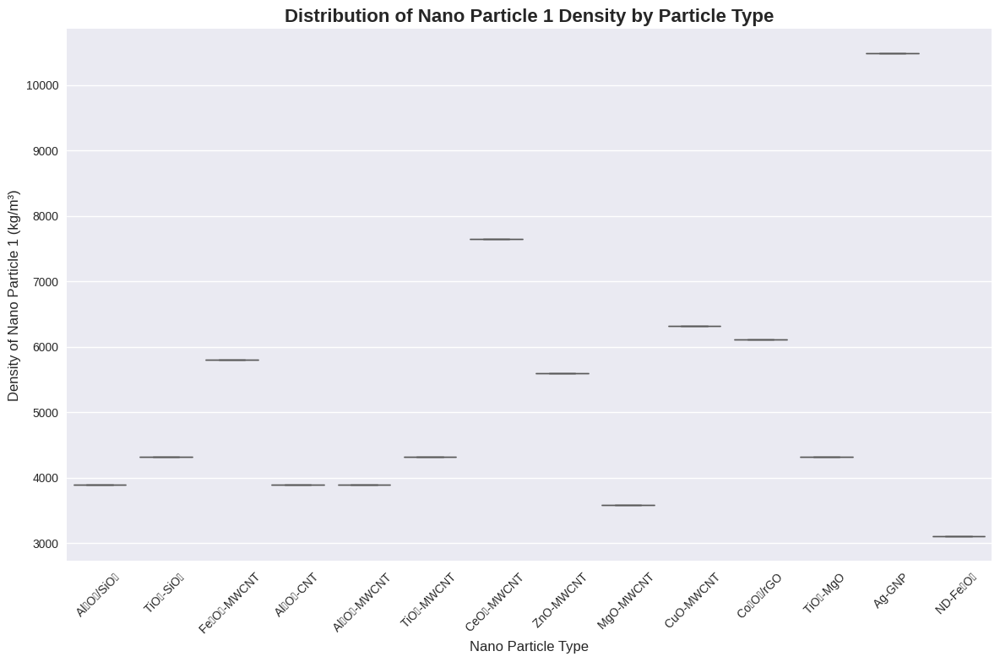

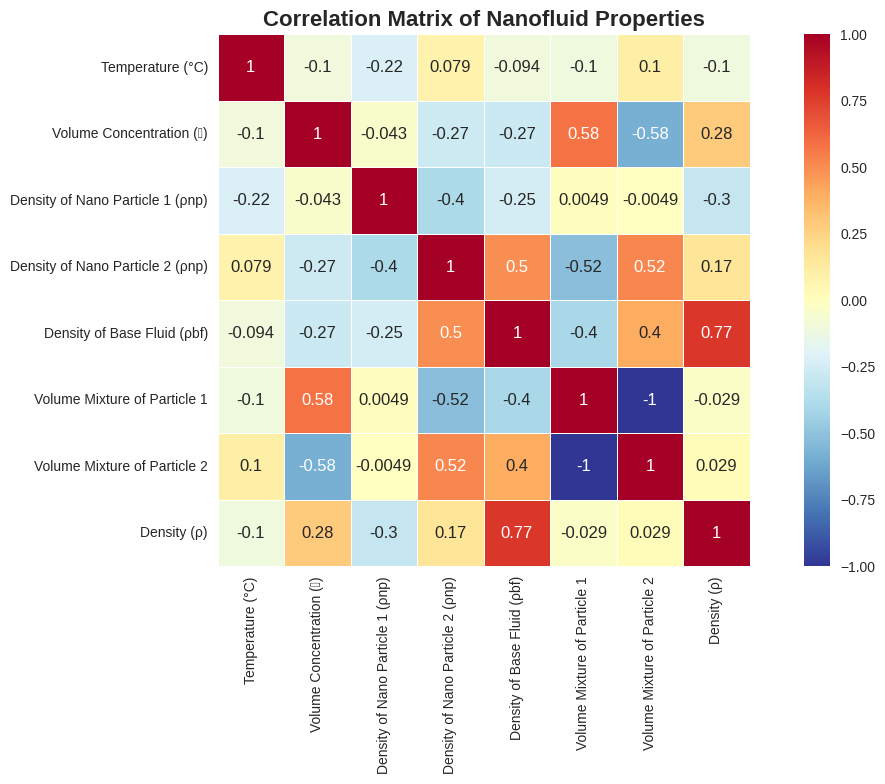

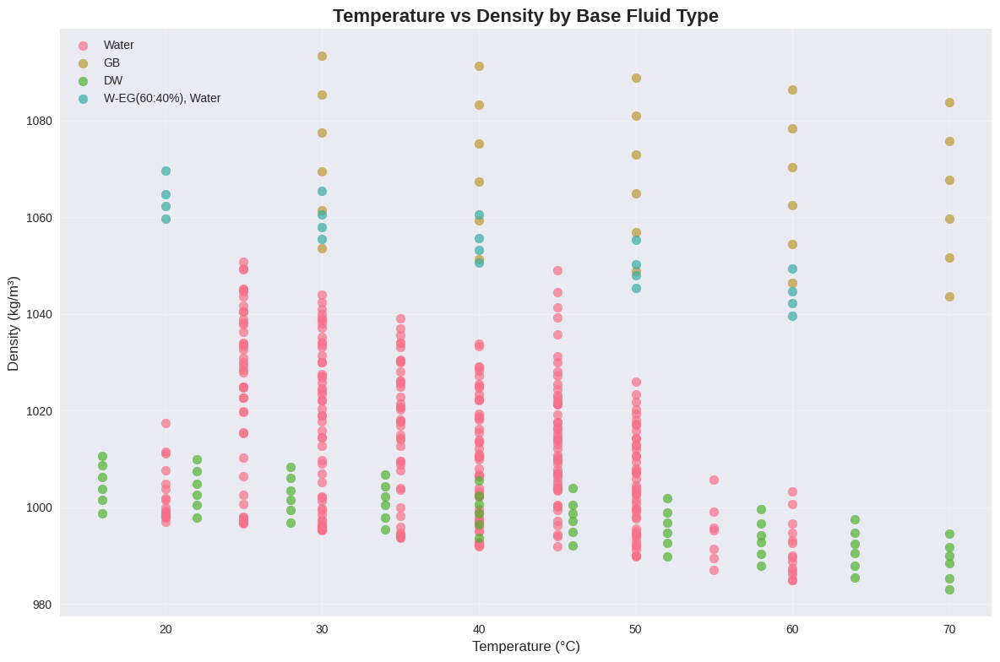

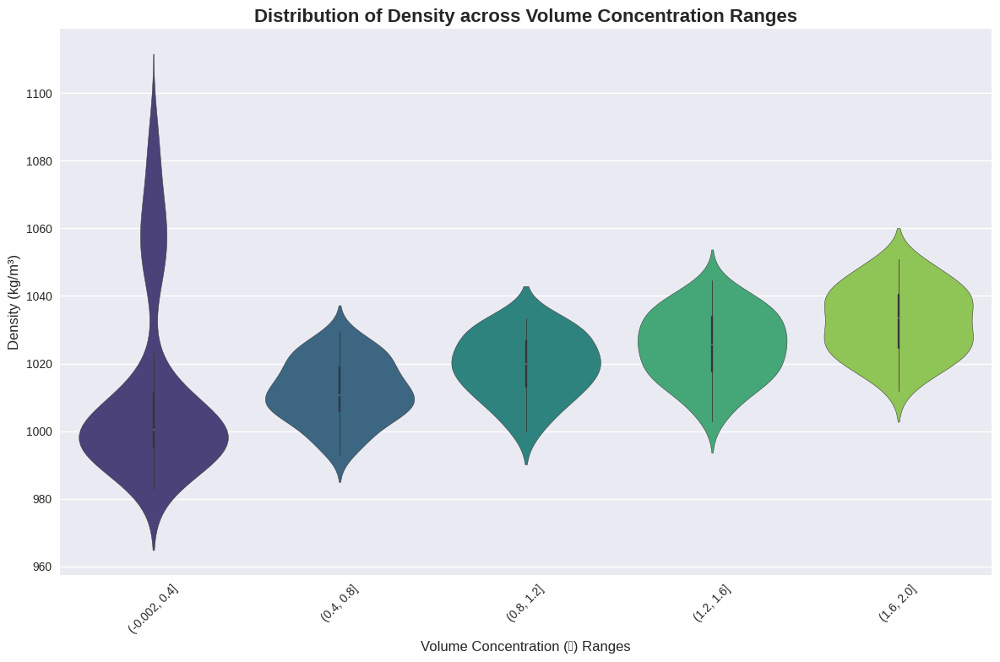

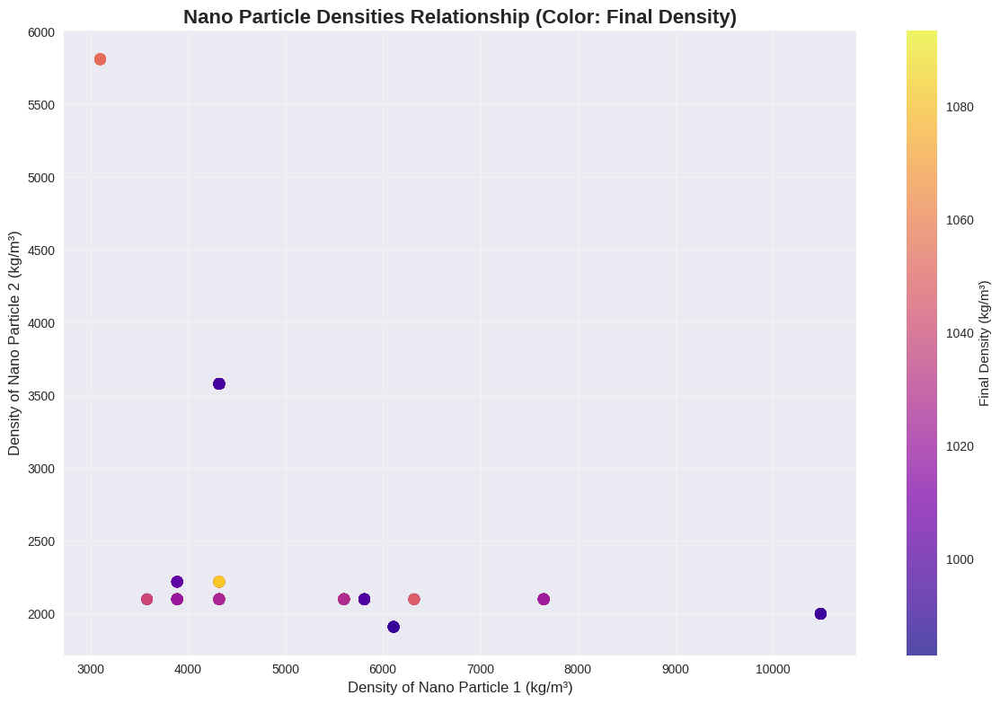

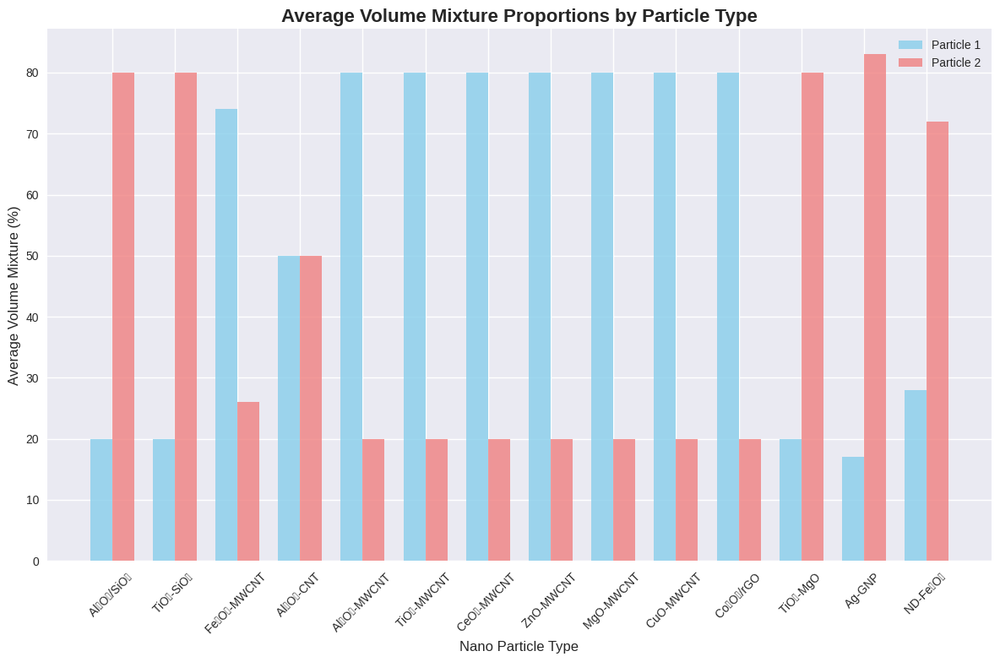

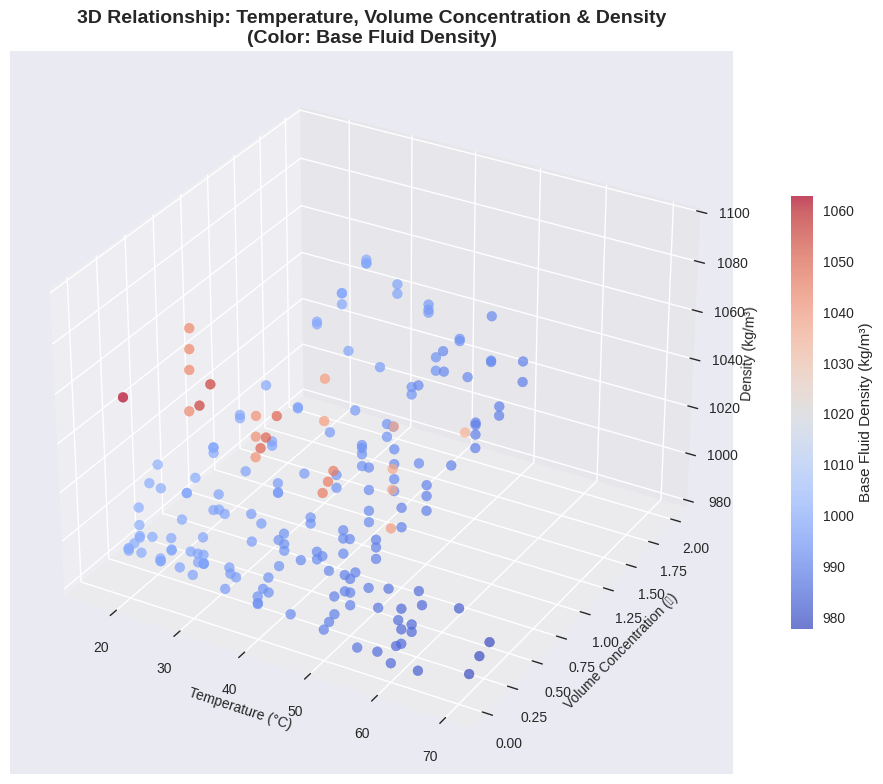


DATA PREPROCESSING AND MODEL TRAINING
Original dataset shape: (436, 11)
After outlier removal: (206, 11)
Outliers removed: 230

Nano Particle types: ['Al₂O₃-MWCNT ' 'CeO₂-MWCNT ' 'CuO-MWCNT ' 'MgO-MWCNT ' 'TiO₂-MWCNT '
 'ZnO-MWCNT ']
Base Fluid types: ['Water']

Feature matrix shape: (206, 9)
Target vector shape: (206,)
Training set shape: (164, 9)
Test set shape: (42, 9)

Training XGBoost model...

Model Performance:
RMSE: 1.4478
MAE: 1.1007
R² Score: 0.9864

PAIRPLOT VISUALIZATION WITH PREPROCESSED DATA
Original dataset shape: (436, 10)
After outlier removal: (206, 10)
Preprocessed data shape for pairplot: (206, 11)
Features included: ['Nano Particle', 'Base Fluid', 'Temperature (°C)', 'Volume Concentration (ϕ)', 'Density of Nano Particle 1 (ρnp)', 'Density of Nano Particle 2 (ρnp)', 'Density of Base Fluid (ρbf)', 'Volume Mixture of Particle 1', 'Volume Mixture of Particle 2']


<Figure size 1200x800 with 0 Axes>

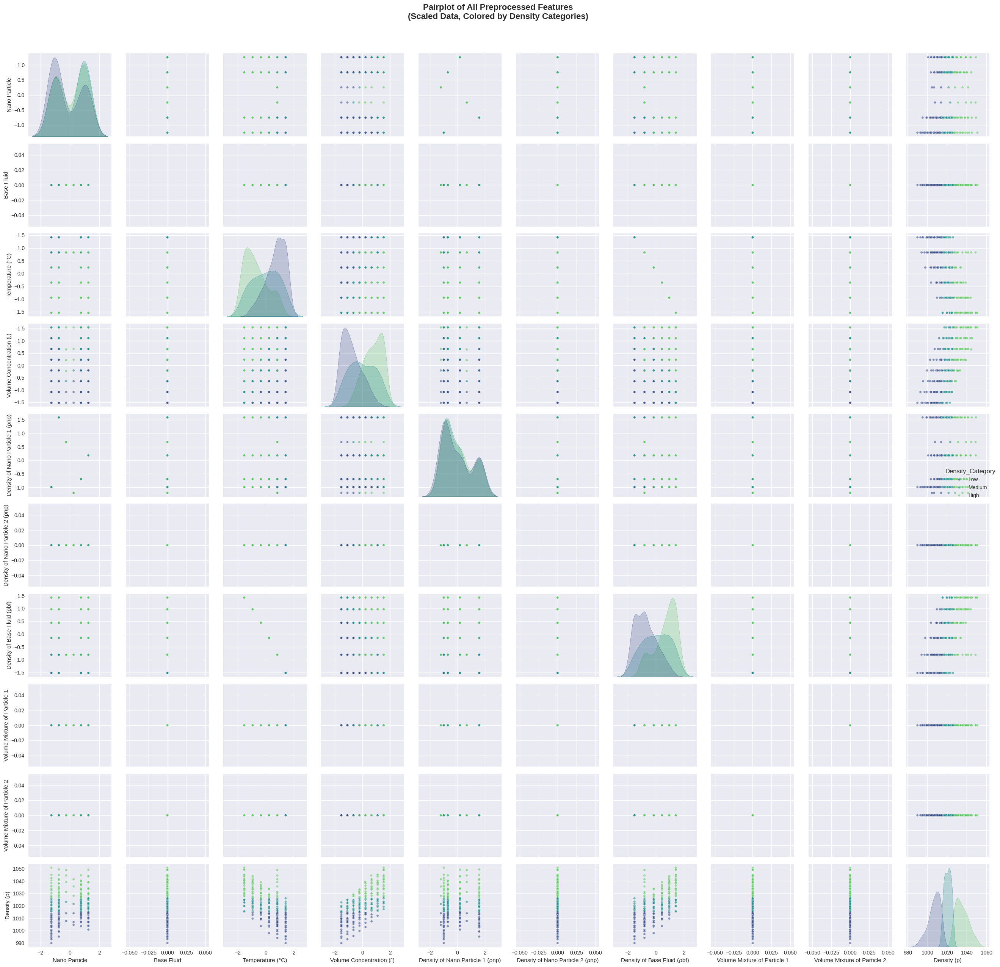

<Figure size 1200x800 with 0 Axes>

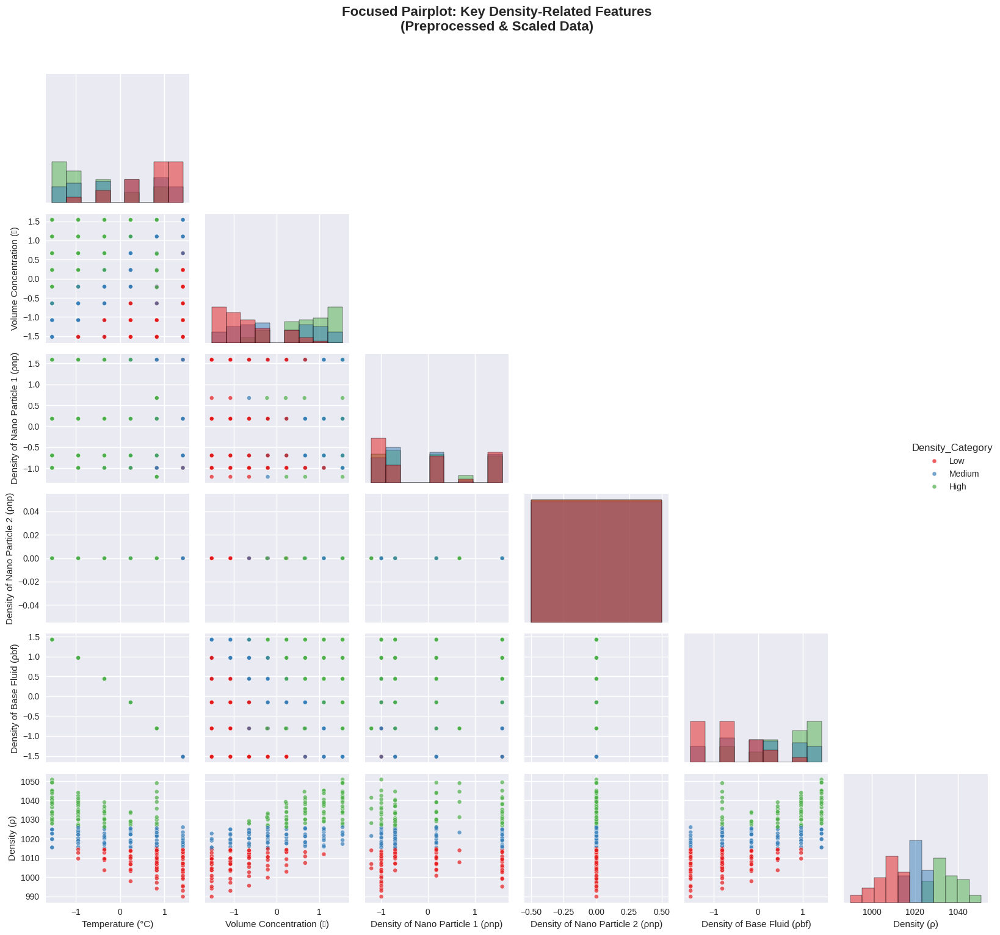

<Figure size 1200x800 with 0 Axes>

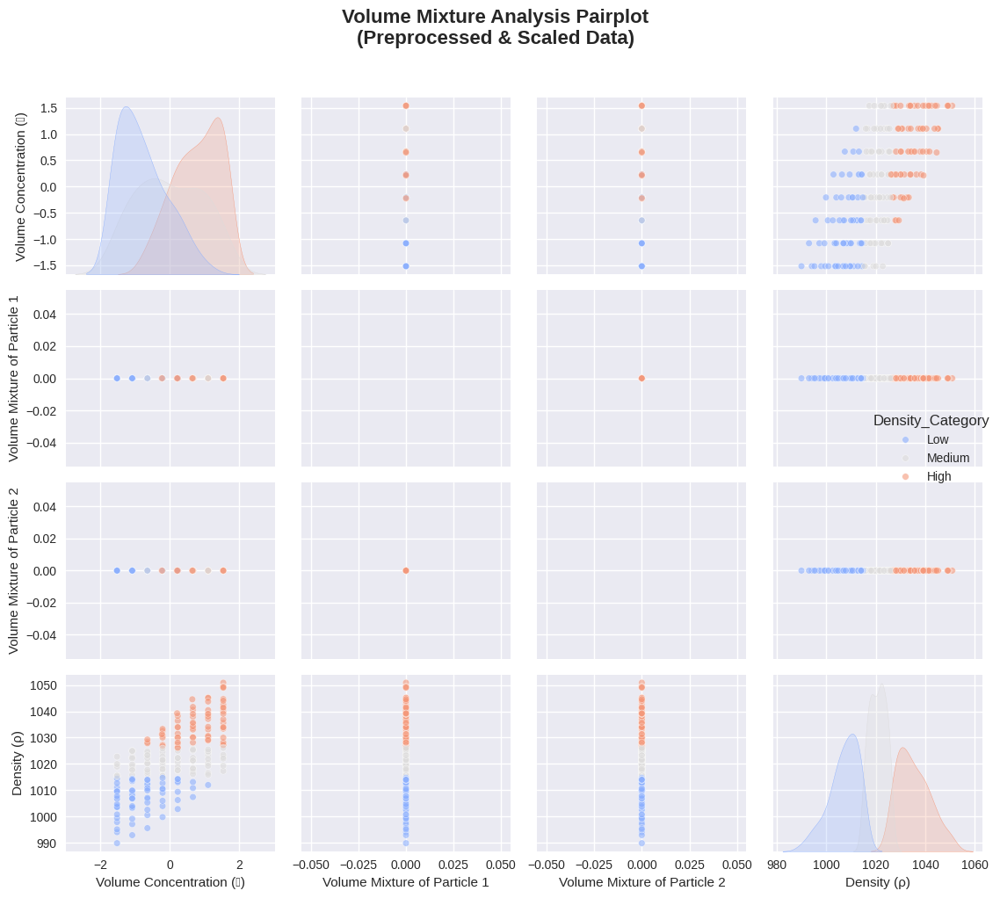

<Figure size 1200x800 with 0 Axes>

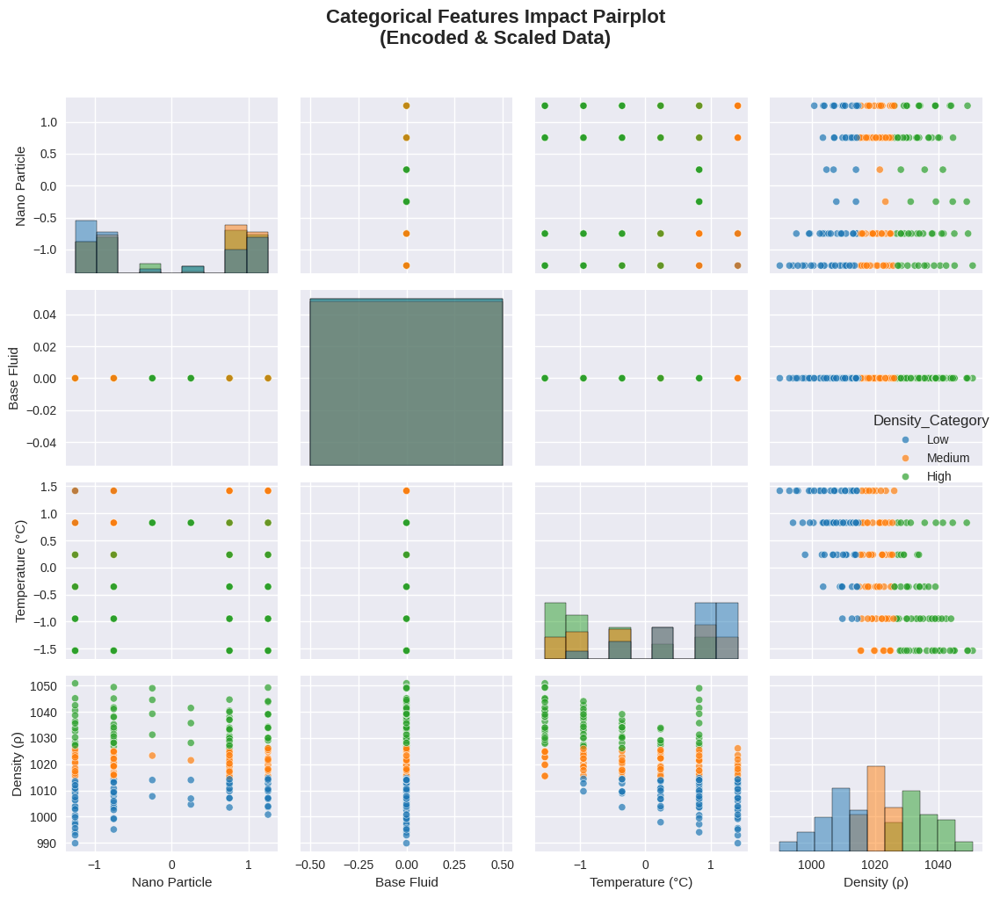


PREPROCESSED DATA SUMMARY
       Nano Particle  Base Fluid  Temperature (°C)  Volume Concentration (ϕ)  \
count   2.060000e+02       206.0      2.060000e+02              2.060000e+02   
mean   -3.449237e-17         0.0     -3.794160e-16              5.928375e-17   
std     1.002436e+00         0.0      1.002436e+00              1.002436e+00   
min    -1.253427e+00         0.0     -1.538300e+00             -1.518253e+00   
25%    -7.520564e-01         0.0     -9.470879e-01             -9.721415e-01   
50%     0.000000e+00         0.0      2.353370e-01             -2.075859e-01   
75%     7.520564e-01         0.0      8.265494e-01              6.661920e-01   
max     1.253427e+00         0.0      1.417762e+00              1.539970e+00   

       Density of Nano Particle 1 (ρnp)  Density of Nano Particle 2 (ρnp)  \
count                      2.060000e+02                             206.0   
mean                      -6.898473e-17                               0.0   
std                  

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Machine Learning imports
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb


# Set style and color palettes
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Load the dataset
df = pd.read_csv('Density_Prediction_Dataset.csv')

print("Dataset Info:")
print(df.info())
print("\nDataset Description:")
print(df.describe())

# =============================================================================
# ADVANCED VISUALIZATIONS
# =============================================================================

# 1. Distribution of Density of Nano Particle 1 by Nano Particle Type
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='Nano Particle', y='Density of Nano Particle 1 (ρnp)',
            palette='Set2')
plt.title('Distribution of Nano Particle 1 Density by Particle Type', fontsize=16, fontweight='bold')
plt.xlabel('Nano Particle Type', fontsize=12)
plt.ylabel('Density of Nano Particle 1 (kg/m³)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2. Heatmap of correlations
plt.figure(figsize=(12, 8))
correlation_cols = ['Temperature (°C)', 'Volume Concentration (ϕ)',
                   'Density of Nano Particle 1 (ρnp)', 'Density of Nano Particle 2 (ρnp)',
                   'Density of Base Fluid (ρbf)', 'Volume Mixture of Particle 1',
                   'Volume Mixture of Particle 2', 'Density (ρ)']
corr_matrix = df[correlation_cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='RdYlBu_r', center=0,
            square=True, linewidths=0.5)
plt.title('Correlation Matrix of Nanofluid Properties', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# 3. Scatter plot: Temperature vs Density colored by Base Fluid
plt.figure(figsize=(12, 8))
for fluid in df['Base Fluid'].unique():
    fluid_data = df[df['Base Fluid'] == fluid]
    plt.scatter(fluid_data['Temperature (°C)'], fluid_data['Density (ρ)'],
                label=fluid, alpha=0.7, s=60)
plt.xlabel('Temperature (°C)', fontsize=12)
plt.ylabel('Density (kg/m³)', fontsize=12)
plt.title('Temperature vs Density by Base Fluid Type', fontsize=16, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 4. Violin plot: Volume Concentration vs Density
plt.figure(figsize=(12, 8))
df['Conc_Binned'] = pd.cut(df['Volume Concentration (ϕ)'], bins=5, precision=2)
sns.violinplot(data=df, x='Conc_Binned', y='Density (ρ)', palette='viridis')
plt.title('Distribution of Density across Volume Concentration Ranges', fontsize=16, fontweight='bold')
plt.xlabel('Volume Concentration (ϕ) Ranges', fontsize=12)
plt.ylabel('Density (kg/m³)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 5. Density comparison: Particle 1 vs Particle 2
plt.figure(figsize=(12, 8))
plt.scatter(df['Density of Nano Particle 1 (ρnp)'], df['Density of Nano Particle 2 (ρnp)'],
            c=df['Density (ρ)'], cmap='plasma', alpha=0.7, s=80)
plt.colorbar(label='Final Density (kg/m³)')
plt.xlabel('Density of Nano Particle 1 (kg/m³)', fontsize=12)
plt.ylabel('Density of Nano Particle 2 (kg/m³)', fontsize=12)
plt.title('Nano Particle Densities Relationship (Color: Final Density)', fontsize=16, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 6. Volume mixture proportions by particle type
plt.figure(figsize=(12, 8))
particle_types = df['Nano Particle'].unique()
width = 0.35
x = np.arange(len(particle_types))

vol1_means = [df[df['Nano Particle'] == pt]['Volume Mixture of Particle 1'].mean() for pt in particle_types]
vol2_means = [df[df['Nano Particle'] == pt]['Volume Mixture of Particle 2'].mean() for pt in particle_types]

plt.bar(x - width/2, vol1_means, width, label='Particle 1', color='skyblue', alpha=0.8)
plt.bar(x + width/2, vol2_means, width, label='Particle 2', color='lightcoral', alpha=0.8)

plt.xlabel('Nano Particle Type', fontsize=12)
plt.ylabel('Average Volume Mixture (%)', fontsize=12)
plt.title('Average Volume Mixture Proportions by Particle Type', fontsize=16, fontweight='bold')
plt.xticks(x, particle_types, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# 7. 3D Surface plot of Temperature, Volume Concentration, and Density
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Sample data for cleaner visualization
sample_idx = np.random.choice(len(df), 200, replace=False)
sample_data = df.iloc[sample_idx]

scatter = ax.scatter(sample_data['Temperature (°C)'],
                    sample_data['Volume Concentration (ϕ)'],
                    sample_data['Density (ρ)'],
                    c=sample_data['Density of Base Fluid (ρbf)'],
                    cmap='coolwarm', alpha=0.7, s=50)

ax.set_xlabel('Temperature (°C)', fontsize=10)
ax.set_ylabel('Volume Concentration (ϕ)', fontsize=10)
ax.set_zlabel('Density (kg/m³)', fontsize=10)
ax.set_title('3D Relationship: Temperature, Volume Concentration & Density\n(Color: Base Fluid Density)',
             fontsize=14, fontweight='bold')
plt.colorbar(scatter, label='Base Fluid Density (kg/m³)', shrink=0.6)
plt.tight_layout()
plt.show()

# =============================================================================
# DATA PREPROCESSING AND MODEL TRAINING
# =============================================================================

print("\n" + "="*60)
print("DATA PREPROCESSING AND MODEL TRAINING")
print("="*60)

# 1. Outlier Detection and Removal using IQR
def remove_outliers_iqr(df, columns):
    df_clean = df.copy()
    outliers_removed = 0
    for col in columns:
        initial_count = len(df_clean)
        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df_clean = df_clean[(df_clean[col] >= lower_bound) & (df_clean[col] <= upper_bound)]
        outliers_removed += initial_count - len(df_clean)
    return df_clean, outliers_removed

# Remove outliers from numerical columns
numerical_cols = ['Temperature (°C)', 'Volume Concentration (ϕ)', 'Density of Nano Particle 1 (ρnp)',
                 'Density of Nano Particle 2 (ρnp)', 'Density of Base Fluid (ρbf)',
                 'Volume Mixture of Particle 1', 'Volume Mixture of Particle 2', 'Density (ρ)']

df_clean, outliers_count = remove_outliers_iqr(df, numerical_cols)

print(f"Original dataset shape: {df.shape}")
print(f"After outlier removal: {df_clean.shape}")
print(f"Outliers removed: {outliers_count}")

# 2. Label Encoding for categorical variables
le_nano = LabelEncoder()
le_base = LabelEncoder()

df_clean['Nano Particle Encoded'] = le_nano.fit_transform(df_clean['Nano Particle'])
df_clean['Base Fluid Encoded'] = le_base.fit_transform(df_clean['Base Fluid'])

print(f"\nNano Particle types: {le_nano.classes_}")
print(f"Base Fluid types: {le_base.classes_}")

# 3. Prepare features and target
X = df_clean[['Nano Particle Encoded', 'Base Fluid Encoded', 'Temperature (°C)',
              'Volume Concentration (ϕ)', 'Density of Nano Particle 1 (ρnp)',
              'Density of Nano Particle 2 (ρnp)', 'Density of Base Fluid (ρbf)',
              'Volume Mixture of Particle 1', 'Volume Mixture of Particle 2']]
y = df_clean['Density (ρ)']

# 4. Feature Scaling using StandardScaler
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

print(f"\nFeature matrix shape: {X_scaled.shape}")
print(f"Target vector shape: {y.shape}")

# 5. Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

print(f"Training set shape: {X_train.shape}")
print(f"Test set shape: {X_test.shape}")

# 6. Train XGBoost model
print("\nTraining XGBoost model...")
model = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    random_state=42
)
model.fit(X_train, y_train)

# Model evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"\nModel Performance:")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R² Score: {r2:.4f}")

# =============================================================================
# PAIRPLOT VISUALIZATION AFTER PREPROCESSING
# =============================================================================

def load_and_preprocess_data(file_path):
    """Load and preprocess the dataset"""
    df = pd.read_csv(file_path)

    print(f"Original dataset shape: {df.shape}")

    # Remove outliers using IQR method
    numerical_columns = df.select_dtypes(include=[np.number]).columns
    for col in numerical_columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

    print(f"After outlier removal: {df.shape}")

    # Label encoding for categorical variables
    le_nano = LabelEncoder()
    le_base = LabelEncoder()
    categorical_columns = df.select_dtypes(include=['object']).columns

    # Store original categorical data for better interpretation
    original_categorical = {}
    for col in categorical_columns:
        original_categorical[col] = df[col].copy()
        if col == 'Nano Particle':
            df[col] = le_nano.fit_transform(df[col])
        elif col == 'Base Fluid':
            df[col] = le_base.fit_transform(df[col])
        else:
            le_temp = LabelEncoder()
            df[col] = le_temp.fit_transform(df[col])


    # Separate features and target
    X = df.drop('Density (ρ)', axis=1)
    y = df['Density (ρ)']

    # Feature scaling
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

    return X_scaled, y, df, original_categorical

print("\n" + "="*60)
print("PAIRPLOT VISUALIZATION WITH PREPROCESSED DATA")
print("="*60)

# Load and preprocess data using the specified function
X_preprocessed, y_preprocessed, df_preprocessed, original_cats = load_and_preprocess_data('Density_Prediction_Dataset.csv')

# Combine features and target for pairplot
df_for_pairplot = X_preprocessed.copy()
df_for_pairplot['Density (ρ)'] = y_preprocessed.reset_index(drop=True)

# Create density categories for better color coding in pairplot
density_bins = pd.qcut(df_for_pairplot['Density (ρ)'], q=3, labels=['Low', 'Medium', 'High'])
df_for_pairplot['Density_Category'] = density_bins

print(f"Preprocessed data shape for pairplot: {df_for_pairplot.shape}")
print(f"Features included: {list(X_preprocessed.columns)}")

# 1. Full pairplot with all features (scaled data)
plt.figure(figsize=(12, 8))
sns.pairplot(data=df_for_pairplot,
             hue='Density_Category',
             palette='viridis',
             plot_kws={'alpha': 0.6, 's': 20},
             diag_kind='kde')
plt.suptitle('Pairplot of All Preprocessed Features\n(Scaled Data, Colored by Density Categories)',
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# 2. Focused pairplot on key density-related features
key_features = ['Temperature (°C)', 'Volume Concentration (ϕ)',
               'Density of Nano Particle 1 (ρnp)', 'Density of Nano Particle 2 (ρnp)',
               'Density of Base Fluid (ρbf)', 'Density (ρ)']

df_key_features = df_for_pairplot[key_features + ['Density_Category']].copy()

plt.figure(figsize=(12, 8))
sns.pairplot(data=df_key_features,
             hue='Density_Category',
             palette='Set1',
             plot_kws={'alpha': 0.7, 's': 25},
             diag_kind='hist',
             corner=True)
plt.suptitle('Focused Pairplot: Key Density-Related Features\n(Preprocessed & Scaled Data)',
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# 3. Volume mixture analysis pairplot
volume_features = ['Volume Concentration (ϕ)', 'Volume Mixture of Particle 1',
                  'Volume Mixture of Particle 2', 'Density (ρ)']

df_volume = df_for_pairplot[volume_features + ['Density_Category']].copy()

plt.figure(figsize=(12, 8))
sns.pairplot(data=df_volume,
             hue='Density_Category',
             palette='coolwarm',
             plot_kws={'alpha': 0.6, 's': 30},
             diag_kind='kde')
plt.suptitle('Volume Mixture Analysis Pairplot\n(Preprocessed & Scaled Data)',
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# 4. Categorical features impact pairplot
categorical_features = ['Nano Particle', 'Base Fluid', 'Temperature (°C)', 'Density (ρ)']
df_categorical = df_for_pairplot[categorical_features + ['Density_Category']].copy()

plt.figure(figsize=(12, 8))
sns.pairplot(data=df_categorical,
             hue='Density_Category',
             palette='tab10',
             plot_kws={'alpha': 0.7, 's': 35},
             diag_kind='hist')
plt.suptitle('Categorical Features Impact Pairplot\n(Encoded & Scaled Data)',
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Print summary statistics of preprocessed data
print("\n" + "="*50)
print("PREPROCESSED DATA SUMMARY")
print("="*50)
print(df_for_pairplot.describe())

print(f"\nDensity Category Distribution:")
print(df_for_pairplot['Density_Category'].value_counts())

print(f"\nCorrelation with Target Variable (Density):")
# Exclude the 'Density_Category' column from correlation calculation
correlations = df_for_pairplot.drop('Density_Category', axis=1).corr()['Density (ρ)'].sort_values(key=abs, ascending=False)
print(correlations)

print("\n" + "="*60)
print("ANALYSIS COMPLETE")
print("="*60)

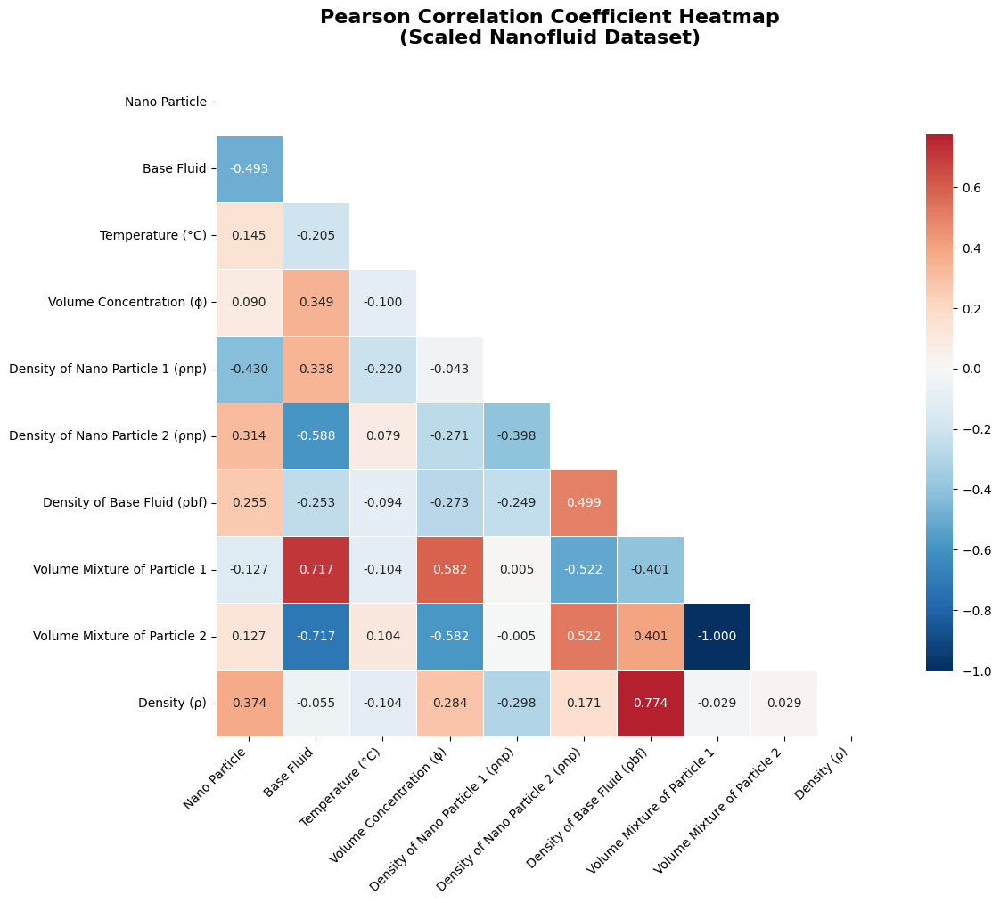

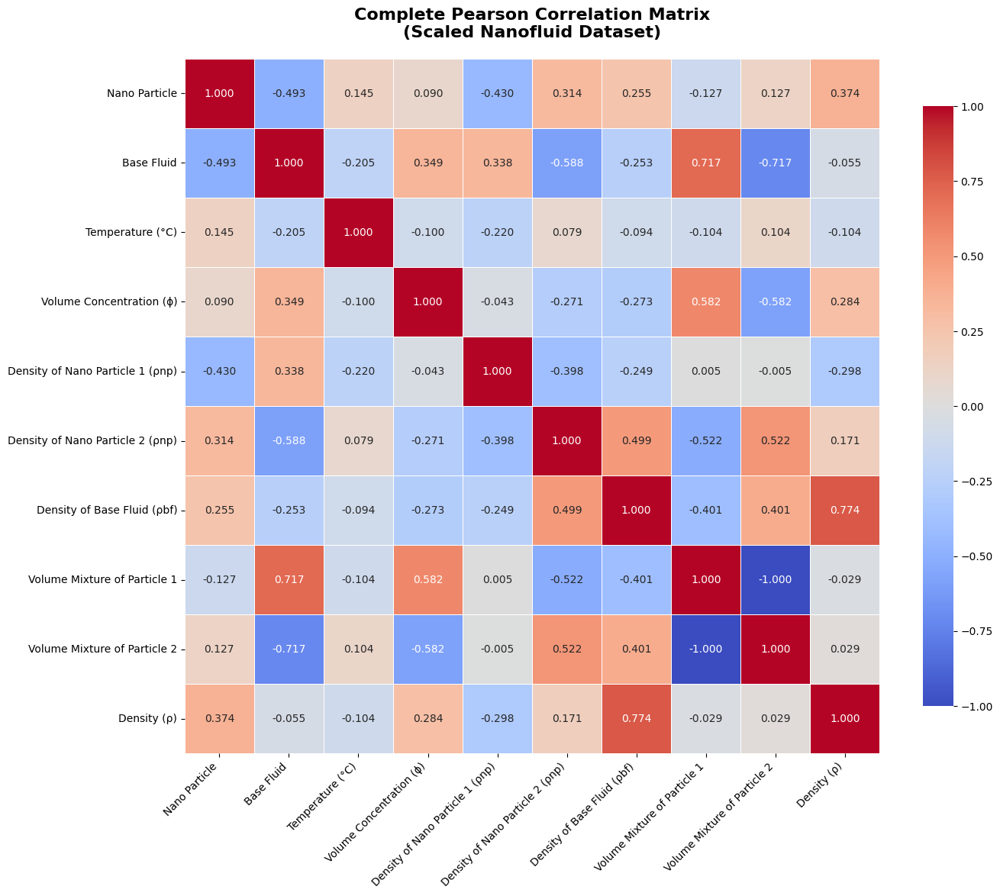


STRONG CORRELATIONS ANALYSIS
Strong correlations (|correlation| > 0.5):
                          Feature_1                         Feature_2  \
8      Volume Mixture of Particle 1      Volume Mixture of Particle 2   
7       Density of Base Fluid (ρbf)                       Density (ρ)   
1                        Base Fluid      Volume Mixture of Particle 1   
2                        Base Fluid      Volume Mixture of Particle 2   
0                        Base Fluid  Density of Nano Particle 2 (ρnp)   
4          Volume Concentration (ϕ)      Volume Mixture of Particle 2   
3          Volume Concentration (ϕ)      Volume Mixture of Particle 1   
6  Density of Nano Particle 2 (ρnp)      Volume Mixture of Particle 2   
5  Density of Nano Particle 2 (ρnp)      Volume Mixture of Particle 1   

   Correlation  
8    -1.000000  
7     0.773982  
1     0.716697  
2    -0.716697  
0    -0.587858  
4    -0.582202  
3     0.582202  
6     0.521510  
5    -0.521510  

No common target column f

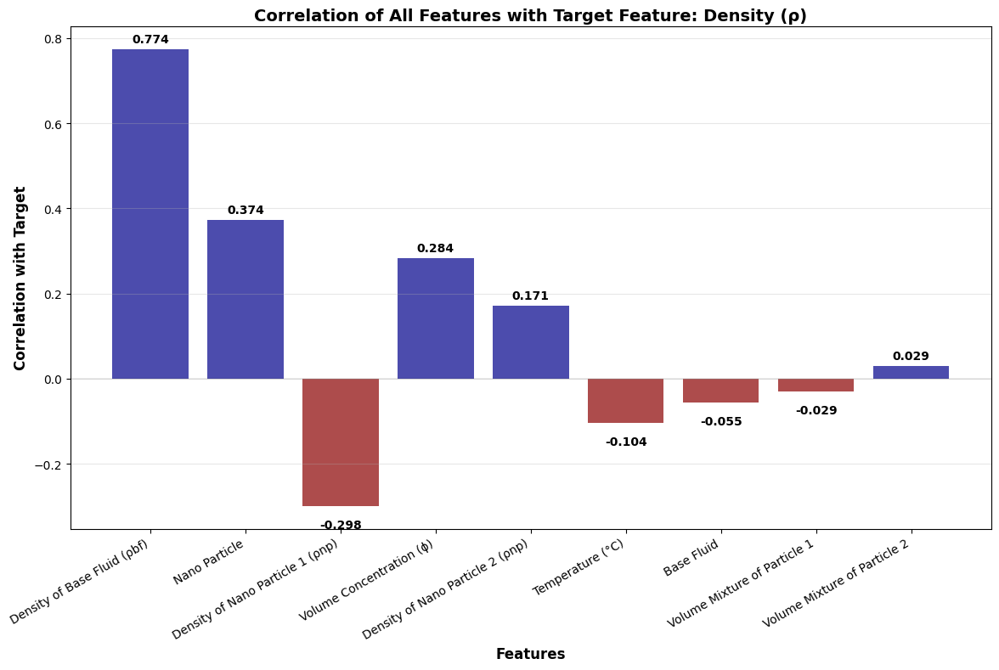

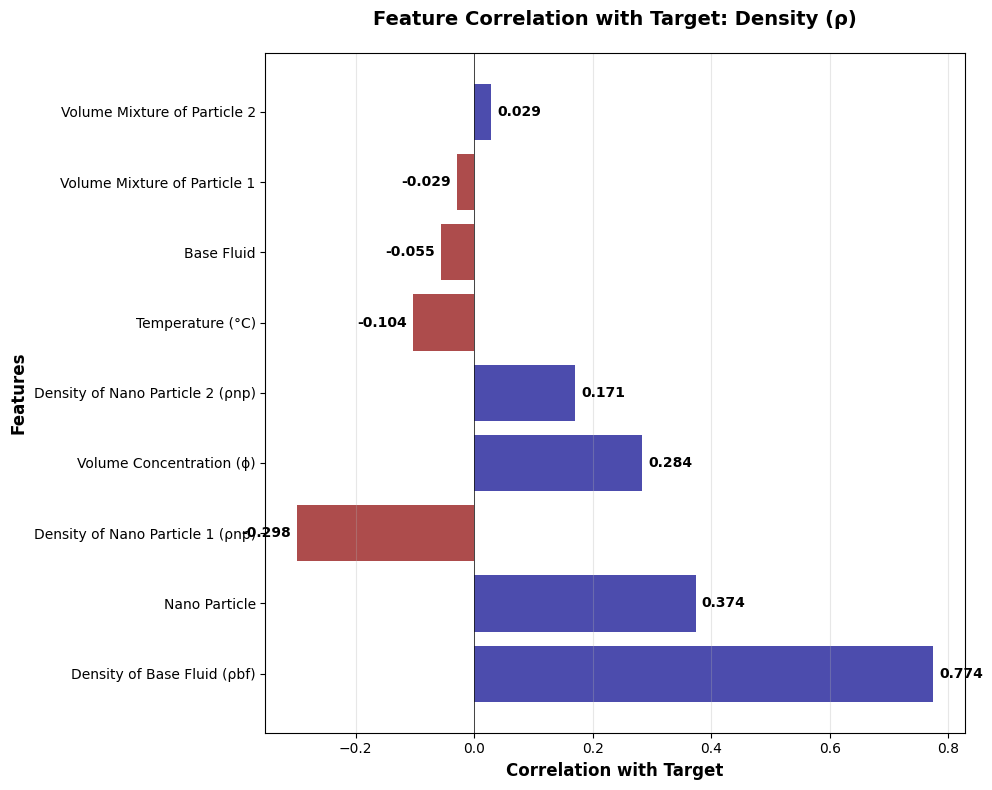


TARGET CORRELATION SUMMARY
Target Column: Density (ρ)
Number of features: 9

Top 5 Positive Correlations:
  Density of Base Fluid (ρbf): 0.774
  Nano Particle: 0.374
  Volume Concentration (ϕ): 0.284
  Density of Nano Particle 2 (ρnp): 0.171
  Volume Mixture of Particle 2: 0.029

Top 5 Negative Correlations:
  Density of Nano Particle 1 (ρnp): -0.298
  Temperature (°C): -0.104
  Base Fluid: -0.055
  Volume Mixture of Particle 1: -0.029

Strongest correlation: 0.774 with Density of Base Fluid (ρbf)
Weakest correlation: 0.029 with Volume Mixture of Particle 2


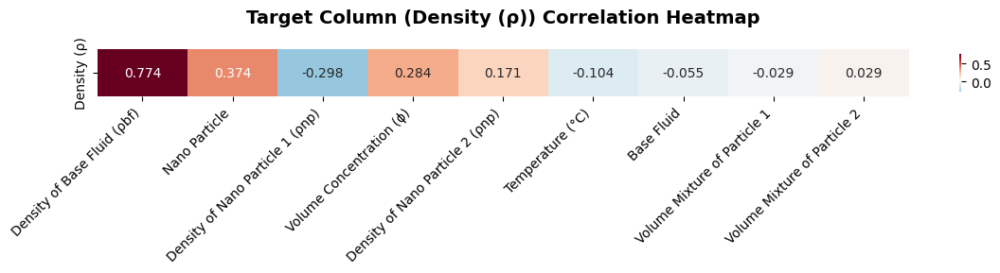


COMPLETE ANALYSIS SUMMARY
Scaled dataset shape: (436, 10)
Features: ['Nano Particle', 'Base Fluid', 'Temperature (°C)', 'Volume Concentration (ϕ)', 'Density of Nano Particle 1 (ρnp)', 'Density of Nano Particle 2 (ρnp)', 'Density of Base Fluid (ρbf)', 'Volume Mixture of Particle 1', 'Volume Mixture of Particle 2', 'Density (ρ)']
Target column: Density (ρ)

First 5 rows of the scaled dataset:
   Nano Particle  Base Fluid  Temperature (°C)  Volume Concentration (ϕ)  \
0      -0.821671    0.543462         -1.584939                 -0.850715   
1      -0.821671    0.543462         -0.780477                 -0.850715   
2      -0.821671    0.543462          0.023986                 -0.850715   
3      -0.821671    0.543462          0.828449                 -0.850715   
4      -0.821671    0.543462          1.632912                 -0.850715   

   Density of Nano Particle 1 (ρnp)  Density of Nano Particle 2 (ρnp)  \
0                          -0.80291                         -0.280355   
1 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
# (If you're reading from a file, use pd.read_csv('your_file.csv') instead)
# Assuming df is already loaded based on your shared df.head() and df.info()

# Step 1: Encode categorical columns
df_encoded = df.copy()
label_encoders = {}
categorical_cols = ['Nano Particle', 'Base Fluid']

for col in categorical_cols:
    le = LabelEncoder()
    df_encoded[col] = le.fit_transform(df_encoded[col])
    label_encoders[col] = le

# Step 2: Scale all features
scaler = StandardScaler()
scaled_array = scaler.fit_transform(df_encoded)

# Create a new DataFrame with scaled features
df_scaled = pd.DataFrame(scaled_array, columns=df_encoded.columns)

# Step 3: Compute Pearson correlation matrix
correlation_matrix = df_scaled.corr(method='pearson')

# Step 4: Plot heatmap (mask upper triangle)
plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix,
            annot=True,
            cmap='RdBu_r',
            center=0,
            square=True,
            fmt='.3f',
            cbar_kws={"shrink": .8},
            linewidths=0.5,
            mask=mask)
plt.title('Pearson Correlation Coefficient Heatmap\n(Scaled Nanofluid Dataset)', fontsize=16, fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Step 5: Full heatmap (no mask)
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix,
            annot=True,
            cmap='coolwarm',
            center=0,
            square=True,
            fmt='.3f',
            cbar_kws={"shrink": .8},
            linewidths=0.5)
plt.title('Complete Pearson Correlation Matrix\n(Scaled Nanofluid Dataset)', fontsize=16, fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Step 6: Analyze strong correlations (> 0.5)
strong_correlations = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = correlation_matrix.iloc[i, j]
        if abs(corr_value) > 0.5:
            strong_correlations.append({
                'Feature_1': correlation_matrix.columns[i],
                'Feature_2': correlation_matrix.columns[j],
                'Correlation': corr_value
            })

print("\n" + "="*50)
print("STRONG CORRELATIONS ANALYSIS")
print("="*50)
if strong_correlations:
    strong_corr_df = pd.DataFrame(strong_correlations)
    strong_corr_df = strong_corr_df.sort_values('Correlation', key=abs, ascending=False)
    print("Strong correlations (|correlation| > 0.5):")
    print(strong_corr_df)
else:
    print("No strong correlations found (threshold = 0.5)")

# Step 7: TARGET COLUMN CORRELATION ANALYSIS
# Define your target column here (replace with your actual target column name)
# Common target names in nanofluid datasets: 'Thermal Conductivity', 'Viscosity', 'Heat Transfer', etc.
target_columns = ['Thermal Conductivity', 'Viscosity', 'Heat Transfer Coefficient', 'Density', 'Specific Heat']

# Find the target column from available columns
target_column = None
for col in target_columns:
    if col in df_scaled.columns:
        target_column = col
        break

# If no common target found, use the last column as target (common ML practice)
if target_column is None:
    target_column = df_scaled.columns[-1]
    print(f"\nNo common target column found. Using '{target_column}' as target column.")

print(f"\nTarget Column: {target_column}")
print("="*50)

# Calculate correlations with target column
target_correlations = correlation_matrix[target_column].drop(target_column).sort_values(key=abs, ascending=False)

# Step 8: Create target correlation bar plot
plt.figure(figsize=(12, 8))
colors = ['darkred' if x < 0 else 'darkblue' for x in target_correlations.values]
bars = plt.bar(range(len(target_correlations)), target_correlations.values, color=colors, alpha=0.7)

# Add value labels on bars
for i, (bar, value) in enumerate(zip(bars, target_correlations.values)):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (0.01 if value > 0 else -0.03),
             f'{value:.3f}', ha='center', va='bottom' if value > 0 else 'top', fontweight='bold')

plt.xlabel('Features', fontsize=12, fontweight='bold')
plt.ylabel('Correlation with Target', fontsize=12, fontweight='bold')
plt.title(f'Correlation of All Features with Target Feature: {target_column}', fontsize=14, fontweight='bold', pad=5)
plt.xticks(range(len(target_correlations)), target_correlations.index, rotation=30, ha='right')
plt.axhline(y=0, color='black', linestyle='-', linewidth=0.1)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Step 9: Create horizontal bar plot for better readability
plt.figure(figsize=(10, 8))
colors = ['darkred' if x < 0 else 'darkblue' for x in target_correlations.values]
bars = plt.barh(range(len(target_correlations)), target_correlations.values, color=colors, alpha=0.7)

# Add value labels on bars
for i, (bar, value) in enumerate(zip(bars, target_correlations.values)):
    plt.text(bar.get_width() + (0.01 if value > 0 else -0.01), bar.get_y() + bar.get_height()/2,
             f'{value:.3f}', ha='left' if value > 0 else 'right', va='center', fontweight='bold')

plt.ylabel('Features', fontsize=12, fontweight='bold')
plt.xlabel('Correlation with Target', fontsize=12, fontweight='bold')
plt.title(f'Feature Correlation with Target: {target_column}', fontsize=14, fontweight='bold', pad=20)
plt.yticks(range(len(target_correlations)), target_correlations.index)
plt.axvline(x=0, color='black', linestyle='-', linewidth=0.5)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Step 10: Target correlation summary
print("\n" + "="*60)
print("TARGET CORRELATION SUMMARY")
print("="*60)
print(f"Target Column: {target_column}")
print(f"Number of features: {len(target_correlations)}")
print("\nTop 5 Positive Correlations:")
positive_corr = target_correlations[target_correlations > 0].head(5)
for feature, corr in positive_corr.items():
    print(f"  {feature}: {corr:.3f}")

print("\nTop 5 Negative Correlations:")
negative_corr = target_correlations[target_correlations < 0].head(5)
for feature, corr in negative_corr.items():
    print(f"  {feature}: {corr:.3f}")

print(f"\nStrongest correlation: {target_correlations.iloc[0]:.3f} with {target_correlations.index[0]}")
print(f"Weakest correlation: {target_correlations.iloc[-1]:.3f} with {target_correlations.index[-1]}")

# Step 11: Create a focused heatmap showing only target correlations
plt.figure(figsize=(12, 3))
target_corr_matrix = target_correlations.values.reshape(1, -1)
sns.heatmap(target_corr_matrix,
            annot=True,
            cmap='RdBu_r',
            center=0,
            fmt='.3f',
            xticklabels=target_correlations.index,
            yticklabels=[f'{target_column}'],
            cbar_kws={"shrink": .8})
plt.title(f'Target Column ({target_column}) Correlation Heatmap', fontsize=14, fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Summary
print("\n" + "="*50)
print("COMPLETE ANALYSIS SUMMARY")
print("="*50)
print(f"Scaled dataset shape: {df_scaled.shape}")
print("Features:", list(df_scaled.columns))
print(f"Target column: {target_column}")
print("\nFirst 5 rows of the scaled dataset:")
print(df_scaled.head())

# Optional: If you want to specify a different target column, uncomment and modify:
# target_column = 'YourTargetColumnName'  # Replace with your actual target column name

Advanced EDA

In [ ]:

import pandas as pd
import numpy as np
import time
import warnings
warnings.filterwarnings('ignore')
# Statistical and Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
# Load the dataset
file_path = '/content/Density_Prediction_Dataset.csv'
df = pd.read_csv(file_path)
df.head()

,Nano Particle,Base Fluid,Temperature (°C),Volume Concentration (ϕ),Density of Nano Particle 1 (ρnp),Density of Nano Particle 2 (ρnp),Density of Base Fluid (ρbf),Volume Mixture of Particle 1,Volume Mixture of Particle 2,Density (ρ)
0,Al₂O₃/SiO₂,Water,20,0.05,3890,2220,998.29,20,80,1004.814815
1,Al₂O₃/SiO₂,Water,30,0.05,3890,2220,995.71,20,80,1002.222222
2,Al₂O₃/SiO₂,Water,40,0.05,3890,2220,992.25,20,80,997.037037
3,Al₂O₃/SiO₂,Water,50,0.05,3890,2220,988.02,20,80,994.444444
4,Al₂O₃/SiO₂,Water,60,0.05,3890,2220,983.13,20,80,990.000000


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
# (If you're reading from a file, use pd.read_csv('your_file.csv') instead)
# Assuming df is already loaded based on your shared df.head() and df.info()

# Step 1: Encode categorical columns
df_encoded = df.copy()
label_encoders = {}

categorical_cols = ['Nano Particle', 'Base Fluid']
for col in categorical_cols:
    le = LabelEncoder()
    df_encoded[col] = le.fit_transform(df_encoded[col])
    label_encoders[col] = le

# Step 2: Scale all features
scaler = StandardScaler()
scaled_array = scaler.fit_transform(df_encoded)

# Create a new DataFrame with scaled features
df_scaled = pd.DataFrame(scaled_array, columns=df_encoded.columns)


In [ ]:
df.head()

,Nano Particle,Base Fluid,Temperature (°C),Volume Concentration (ϕ),Density of Nano Particle 1 (ρnp),Density of Nano Particle 2 (ρnp),Density of Base Fluid (ρbf),Volume Mixture of Particle 1,Volume Mixture of Particle 2,Density (ρ)
0,Al₂O₃/SiO₂,Water,20,0.05,3890,2220,998.29,20,80,1004.814815
1,Al₂O₃/SiO₂,Water,30,0.05,3890,2220,995.71,20,80,1002.222222
2,Al₂O₃/SiO₂,Water,40,0.05,3890,2220,992.25,20,80,997.037037
3,Al₂O₃/SiO₂,Water,50,0.05,3890,2220,988.02,20,80,994.444444
4,Al₂O₃/SiO₂,Water,60,0.05,3890,2220,983.13,20,80,990.000000


In [ ]:
df_scaled.head()

,Nano Particle,Base Fluid,Temperature (°C),Volume Concentration (ϕ),Density of Nano Particle 1 (ρnp),Density of Nano Particle 2 (ρnp),Density of Base Fluid (ρbf),Volume Mixture of Particle 1,Volume Mixture of Particle 2,Density (ρ)
0,-0.821671,0.543462,-1.584939,-0.850715,-0.80291,-0.280355,0.002603,-1.340751,1.340751,-0.509619
1,-0.821671,0.543462,-0.780477,-0.850715,-0.80291,-0.280355,-0.143137,-1.340751,1.340751,-0.623987
2,-0.821671,0.543462,0.023986,-0.850715,-0.80291,-0.280355,-0.338587,-1.340751,1.340751,-0.852722
3,-0.821671,0.543462,0.828449,-0.850715,-0.80291,-0.280355,-0.577533,-1.340751,1.340751,-0.967090
4,-0.821671,0.543462,1.632912,-0.850715,-0.80291,-0.280355,-0.853761,-1.340751,1.340751,-1.163148


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 436 entries, 0 to 435
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Nano Particle                     436 non-null    object 
 1   Base Fluid                        436 non-null    object 
 2   Temperature (°C)                  436 non-null    int64  
 3   Volume Concentration (ϕ)          436 non-null    float64
 4   Density of Nano Particle 1 (ρnp)  436 non-null    int64  
 5   Density of Nano Particle 2 (ρnp)  436 non-null    int64  
 6   Density of Base Fluid (ρbf)       436 non-null    float64
 7   Volume Mixture of Particle 1      436 non-null    int64  
 8   Volume Mixture of Particle 2      436 non-null    int64  
 9   Density (ρ)                       436 non-null    float64
dtypes: float64(3), int64(5), object(2)
memory usage: 34.2+ KB


In [ ]:
!pip install Graphviz
!pip install pydotplus

Features used for prediction:
1. Nano Particle
2. Base Fluid
3. Temperature (°C)
4. Volume Concentration (ϕ)
5. Density of Nano Particle 1 (ρnp)
6. Density of Nano Particle 2 (ρnp)
7. Density of Base Fluid (ρbf)
8. Volume Mixture of Particle 1
9. Volume Mixture of Particle 2

Target variable: Density (ρ)
Dataset shape: (436, 10)
Number of samples: 436

=== Model Performance ===
R² Score: 0.8937
Root Mean Square Error (RMSE): 8.2378
Mean Absolute Error (MAE): 6.3433
Mean Square Error (MSE): 67.8610

=== Feature Importance ===
Density of Base Fluid (ρbf): 0.5757
Volume Concentration (ϕ): 0.3508
Temperature (°C): 0.0485
Density of Nano Particle 2 (ρnp): 0.0161
Density of Nano Particle 1 (ρnp): 0.0088
Nano Particle: 0.0000
Base Fluid: 0.0000
Volume Mixture of Particle 1: 0.0000
Volume Mixture of Particle 2: 0.0000

=== Decision Tree Visualization ===
Decision tree saved as: density_decision_tree.png


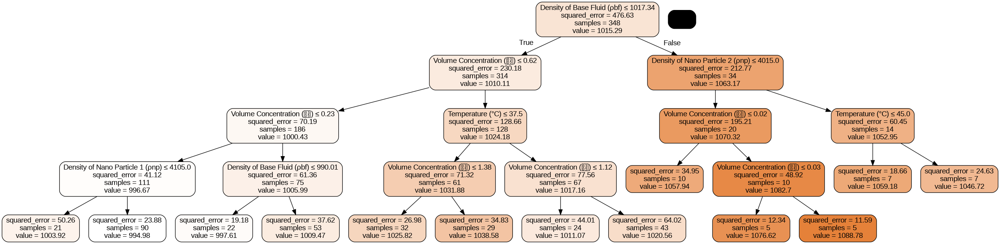

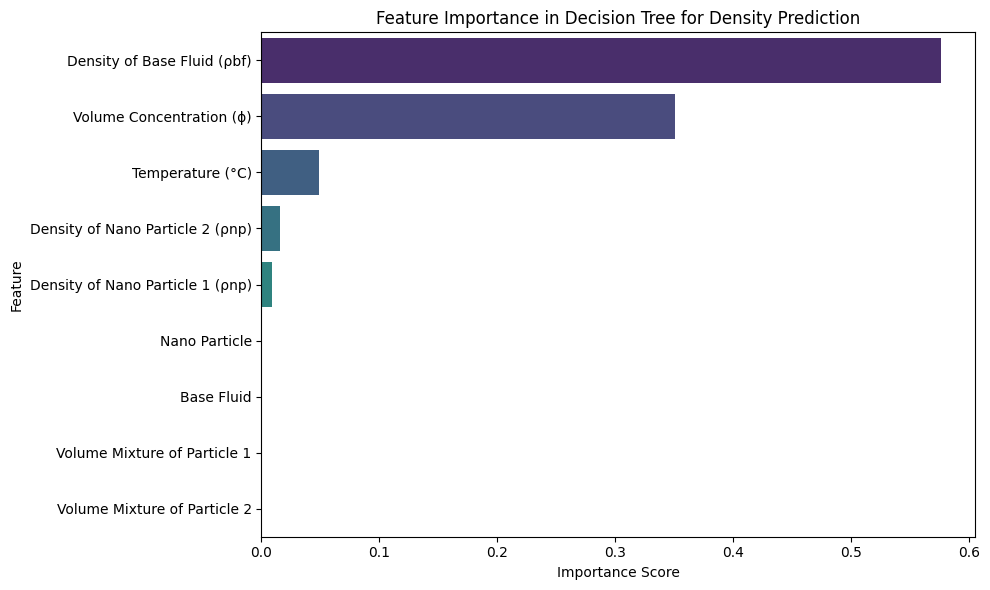

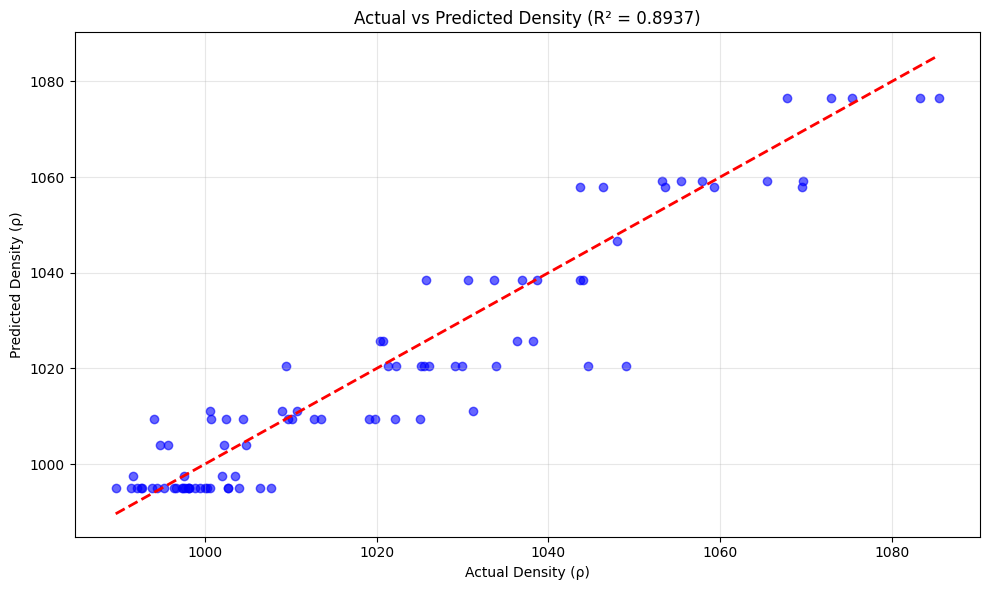


=== Decision Tree Structure (Text Format) ===
Tree depth: 4
Number of leaves: 13

=== Sample Predictions ===
Index | Actual | Predicted | Error
-----------------------------------
    8 | 1065.42 |   1059.18 |  6.24
   84 | 1038.67 |   1038.58 |  0.09
    1 | 997.71 |    994.98 |  2.73
   30 | 1053.26 |   1059.18 |  5.92
   82 | 1047.97 |   1046.72 |  1.25
   62 | 1044.02 |   1038.58 |  5.45
   77 | 1059.33 |   1057.94 |  1.39
   55 | 1085.46 |   1076.62 |  8.84
   43 | 995.21 |    994.98 |  0.23
   87 | 1000.00 |    994.98 |  5.02

=== Decision Path for First Test Sample ===
Sample features: {'Nano Particle': 1.0, 'Base Fluid': 3.0, 'Temperature (°C)': 40.0, 'Volume Concentration (ϕ)': 0.0, 'Density of Nano Particle 1 (ρnp)': 10490.0, 'Density of Nano Particle 2 (ρnp)': 2000.0, 'Density of Base Fluid (ρbf)': 992.25, 'Volume Mixture of Particle 1': 17.0, 'Volume Mixture of Particle 2': 83.0}
Predicted density: 994.98
Actual density: 992.13


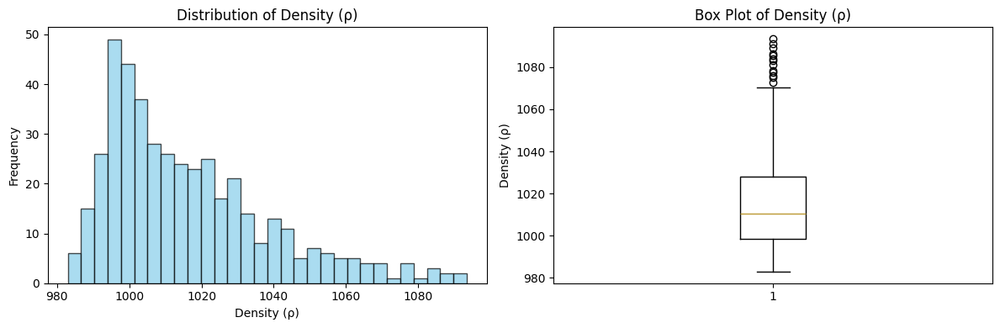

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, export_graphviz
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from io import StringIO
import pydotplus
from IPython.display import Image, display
import warnings
warnings.filterwarnings('ignore')

# Load the dataset (assuming df is already loaded from your code)
df = pd.read_csv('/content/Density_Prediction_Dataset.csv')

# Prepare the data
df_encoded = df.copy()
label_encoders = {}

# Encode categorical columns
categorical_cols = ['Nano Particle', 'Base Fluid']
for col in categorical_cols:
    le = LabelEncoder()
    df_encoded[col] = le.fit_transform(df_encoded[col])
    label_encoders[col] = le

# Separate features and target
X = df_encoded.drop(columns=["Density (ρ)"])
y = df_encoded["Density (ρ)"]

# Feature names for visualization
features = X.columns.tolist()

print("Features used for prediction:")
for i, feature in enumerate(features):
    print(f"{i+1}. {feature}")

print(f"\nTarget variable: Density (ρ)")
print(f"Dataset shape: {df.shape}")
print(f"Number of samples: {len(df)}")

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Optional: Scale features for better visualization (though not required for decision trees)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train decision tree regressor
dtree = DecisionTreeRegressor(
    max_depth=4,           # Limit depth for better visualization
    min_samples_split=10,  # Minimum samples required to split
    min_samples_leaf=5,    # Minimum samples required at leaf node
    random_state=42
)

# Fit the model
dtree.fit(X_train, y_train)

# Make predictions
y_pred = dtree.predict(X_test)

# Calculate performance metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"\n=== Model Performance ===")
print(f"R² Score: {r2:.4f}")
print(f"Root Mean Square Error (RMSE): {rmse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Square Error (MSE): {mse:.4f}")

# Feature importance
feature_importance = pd.DataFrame({
    'Feature': features,
    'Importance': dtree.feature_importances_
}).sort_values('Importance', ascending=False)

print(f"\n=== Feature Importance ===")
for idx, row in feature_importance.iterrows():
    print(f"{row['Feature']}: {row['Importance']:.4f}")

# --- Export decision tree visualization ---
dot_data = StringIO()
export_graphviz(
    dtree,
    out_file=dot_data,
    feature_names=features,
    filled=True,
    rounded=True,
    special_characters=True,
    precision=2
)

# Create graph
try:
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

    # Save and display the tree
    filename = "density_decision_tree.png"
    graph.write_png(filename)

    print(f"\n=== Decision Tree Visualization ===")
    print(f"Decision tree saved as: {filename}")

    # Display the image if in Jupyter environment
    try:
        img = Image(filename=filename)
        display(img)
    except:
        print("Tree visualization saved. Open the PNG file to view the decision tree.")

except Exception as e:
    print(f"Error creating tree visualization: {e}")
    print("Install graphviz and pydotplus: pip install graphviz pydotplus")

# Create feature importance plot
plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance, x='Importance', y='Feature', palette='viridis')
plt.title('Feature Importance in Decision Tree for Density Prediction')
plt.xlabel('Importance Score')
plt.tight_layout()
plt.show()

# Create actual vs predicted plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.6, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Density (ρ)')
plt.ylabel('Predicted Density (ρ)')
plt.title(f'Actual vs Predicted Density (R² = {r2:.4f})')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Print tree structure in text format
print(f"\n=== Decision Tree Structure (Text Format) ===")
print("Tree depth:", dtree.get_depth())
print("Number of leaves:", dtree.get_n_leaves())

# Display some sample predictions
sample_size = min(10, len(X_test))
sample_indices = np.random.choice(len(X_test), sample_size, replace=False)

print(f"\n=== Sample Predictions ===")
print("Index | Actual | Predicted | Error")
print("-" * 35)
for i in sample_indices:
    actual = y_test.iloc[i]
    predicted = y_pred[i]
    error = abs(actual - predicted)
    print(f"{i:5d} | {actual:6.2f} | {predicted:9.2f} | {error:5.2f}")

# If you want to see the decision path for a specific sample
print(f"\n=== Decision Path for First Test Sample ===")
sample_idx = 0
sample_data = X_test.iloc[sample_idx:sample_idx+1]
decision_path = dtree.decision_path(sample_data)
leaf_id = dtree.apply(sample_data)

print(f"Sample features: {dict(zip(features, sample_data.iloc[0]))}")
print(f"Predicted density: {dtree.predict(sample_data)[0]:.2f}")
print(f"Actual density: {y_test.iloc[sample_idx]:.2f}")

# Additional analysis: Distribution of target variable
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.hist(y, bins=30, alpha=0.7, color='skyblue', edgecolor='black')
plt.title('Distribution of Density (ρ)')
plt.xlabel('Density (ρ)')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.boxplot(y)
plt.title('Box Plot of Density (ρ)')
plt.ylabel('Density (ρ)')

plt.tight_layout()
plt.show()

COMPREHENSIVE EXPLORATORY DATA ANALYSIS
Density Prediction Dataset

1. BASIC DATASET INFORMATION
----------------------------------------
Dataset Shape: (436, 10)
Number of Features: 9
Target Variable: Density (ρ)

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 436 entries, 0 to 435
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Nano Particle                     436 non-null    object 
 1   Base Fluid                        436 non-null    object 
 2   Temperature (°C)                  436 non-null    int64  
 3   Volume Concentration (ϕ)          436 non-null    float64
 4   Density of Nano Particle 1 (ρnp)  436 non-null    int64  
 5   Density of Nano Particle 2 (ρnp)  436 non-null    int64  
 6   Density of Base Fluid (ρbf)       436 non-null    float64
 7   Volume Mixture of Particle 1      436 non-null    int64  
 8   Volume Mixture of Particle 2   

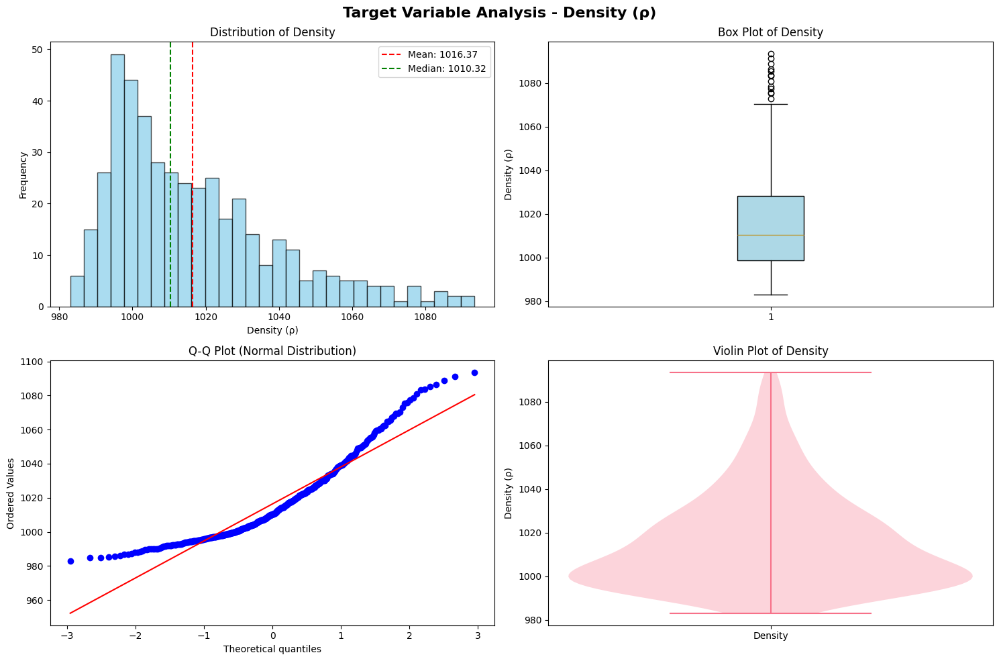


3. UNIVARIATE ANALYSIS
-------------------------
Numerical Features: ['Temperature (°C)', 'Volume Concentration (ϕ)', 'Density of Nano Particle 1 (ρnp)', 'Density of Nano Particle 2 (ρnp)', 'Density of Base Fluid (ρbf)', 'Volume Mixture of Particle 1', 'Volume Mixture of Particle 2']


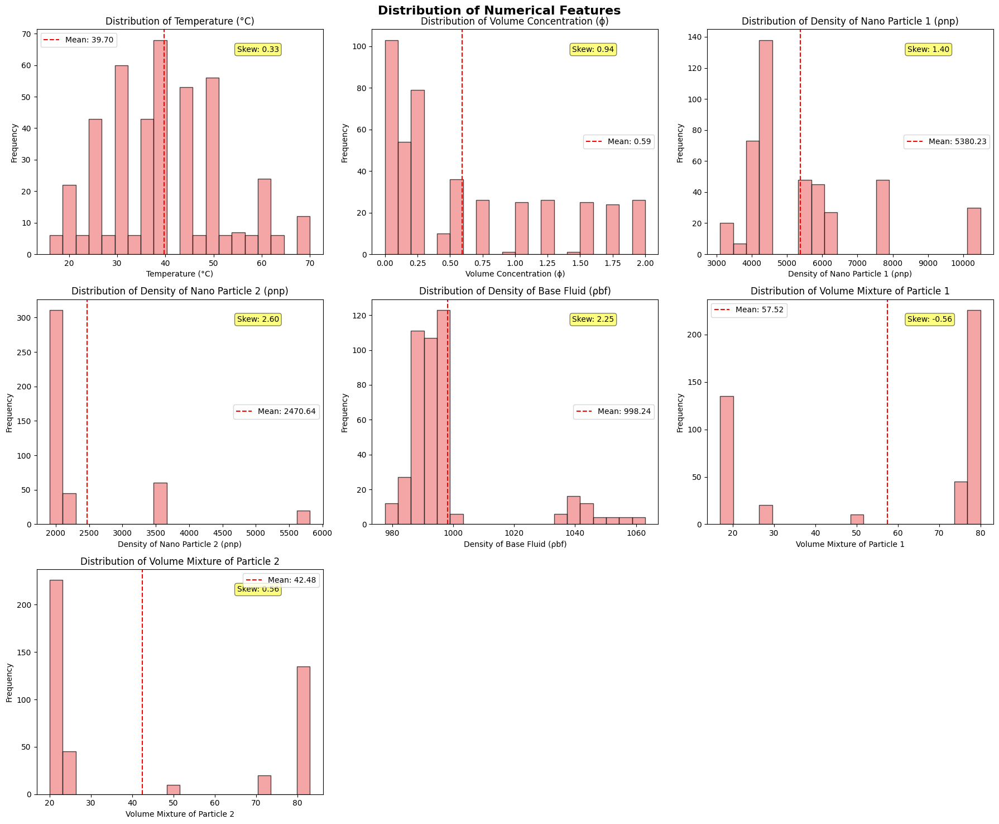


4. BIVARIATE ANALYSIS
----------------------
Correlation Matrix (Pearson):
                                  Temperature (°C)  Volume Concentration (ϕ)  \
Temperature (°C)                             1.000                    -0.100   
Volume Concentration (ϕ)                    -0.100                     1.000   
Density of Nano Particle 1 (ρnp)            -0.220                    -0.043   
Density of Nano Particle 2 (ρnp)             0.079                    -0.271   
Density of Base Fluid (ρbf)                 -0.094                    -0.273   
Volume Mixture of Particle 1                -0.104                     0.582   
Volume Mixture of Particle 2                 0.104                    -0.582   
Density (ρ)                                 -0.104                     0.284   

                                  Density of Nano Particle 1 (ρnp)  \
Temperature (°C)                                            -0.220   
Volume Concentration (ϕ)                                    -0.

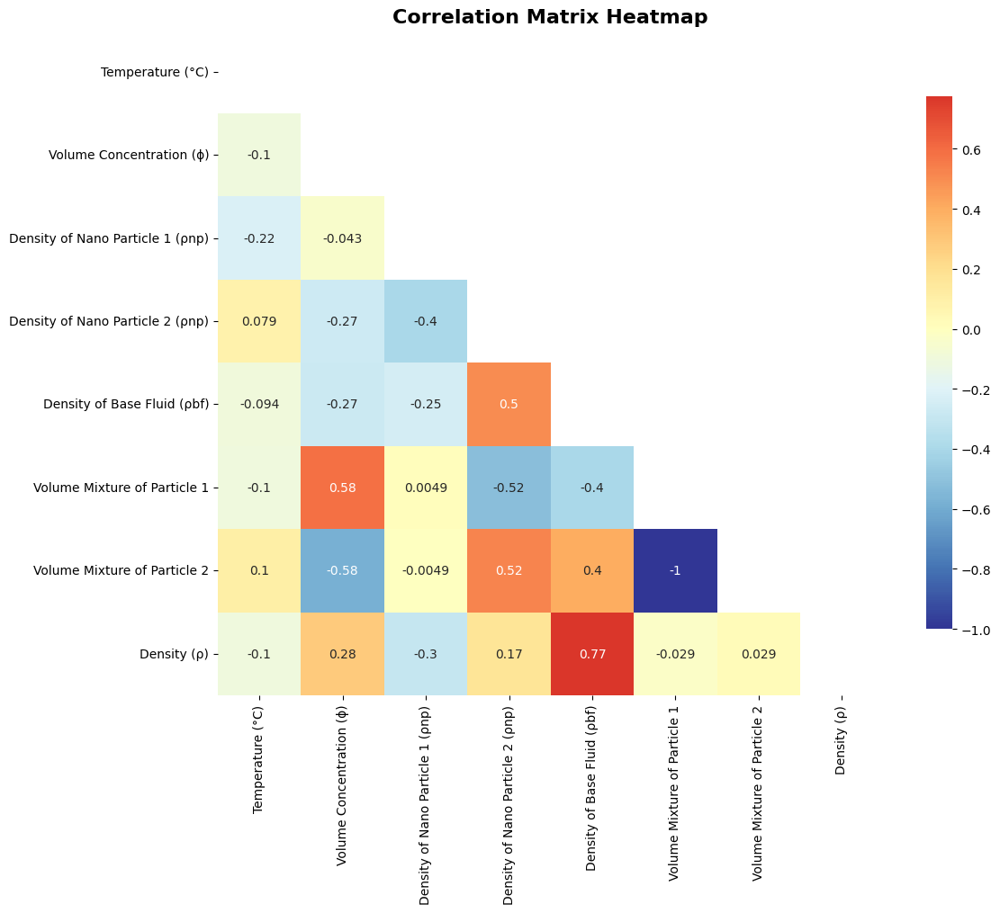


Features correlation with Target (absolute values):
Density of Base Fluid (ρbf): 0.7740
Density of Nano Particle 1 (ρnp): 0.2985
Volume Concentration (ϕ): 0.2839
Density of Nano Particle 2 (ρnp): 0.1709
Temperature (°C): 0.1035
Volume Mixture of Particle 1: 0.0290
Volume Mixture of Particle 2: 0.0290


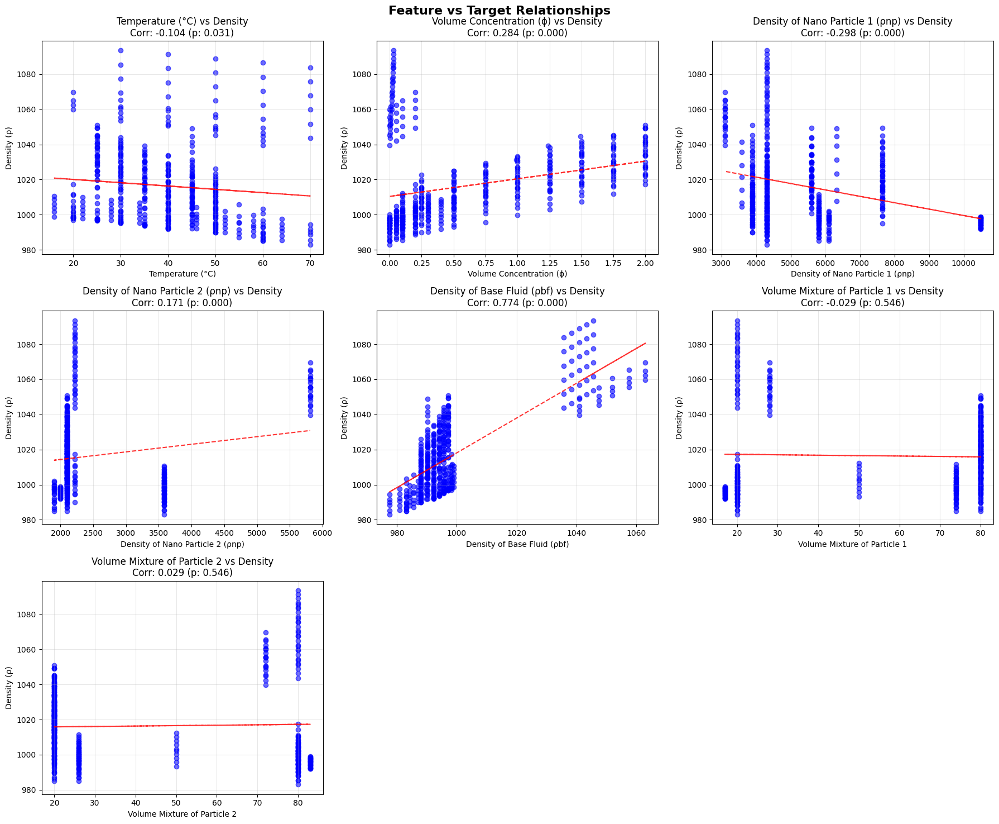


5. CATEGORICAL VARIABLE ANALYSIS
-----------------------------------
Analysis by Nano Particle:
               count      mean     std       min       max
Nano Particle                                             
 Co₃O₄/rGO        20   994.904   5.167   985.000  1002.000
Ag-GNP            30   995.564   2.198   991.880   998.910
Al₂O₃-CNT         10  1002.908   6.276   993.189  1012.278
Al₂O₃-MWCNT       48  1016.905  14.999   989.905  1050.857
Al₂O₃/SiO₂        15  1003.383   7.749   990.000  1017.407
CeO₂-MWCNT        48  1020.242  12.869   995.143  1049.410
CuO-MWCNT          7  1029.873  15.568  1007.785  1048.987
Fe₃O₄-MWCNT       45   998.545   6.516   985.000  1011.500
MgO-MWCNT          7  1021.772  14.119  1004.684  1041.456
ND-Fe₃O₄          20  1054.547   8.220  1039.601  1069.601
TiO₂-MWCNT        48  1023.178   9.711  1003.540  1044.659
TiO₂-MgO          60   997.985   6.548   983.010  1010.620
TiO₂-SiO₂         30  1068.786  14.325  1043.702  1093.432
ZnO-MWCNT         

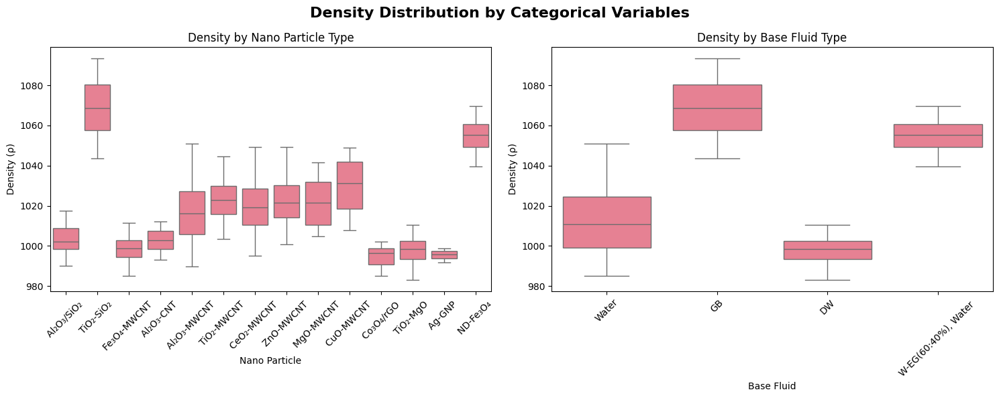


6. MULTIVARIATE ANALYSIS
---------------------------


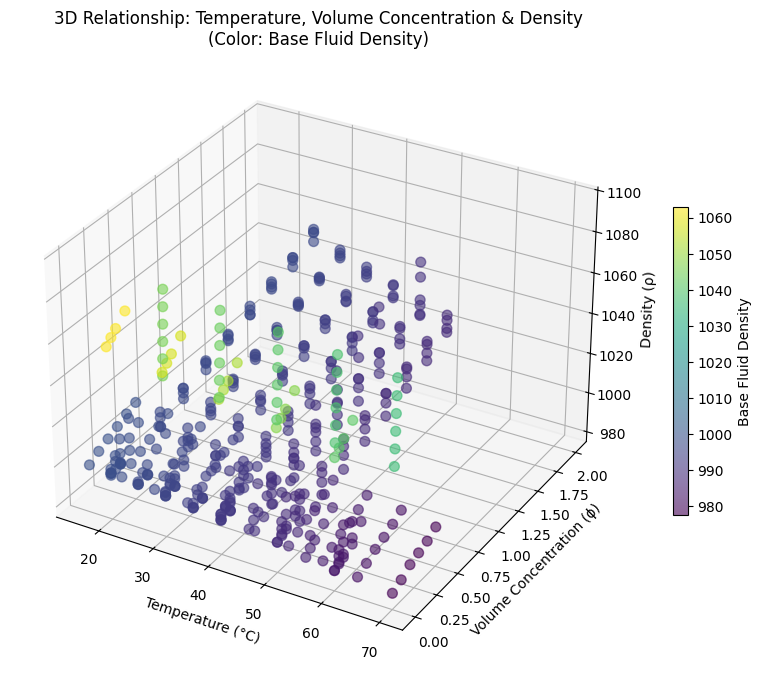

<Figure size 1200x1000 with 0 Axes>

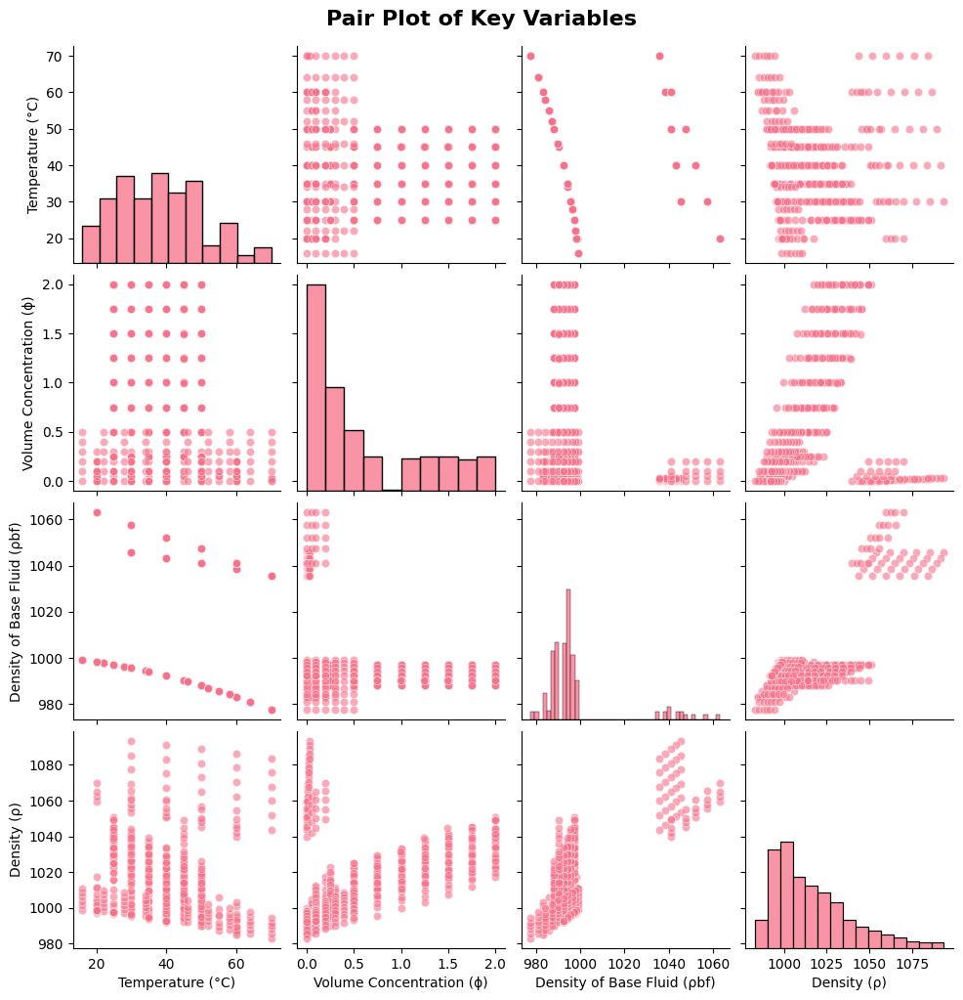


7. ADVANCED VISUALIZATIONS
------------------------------


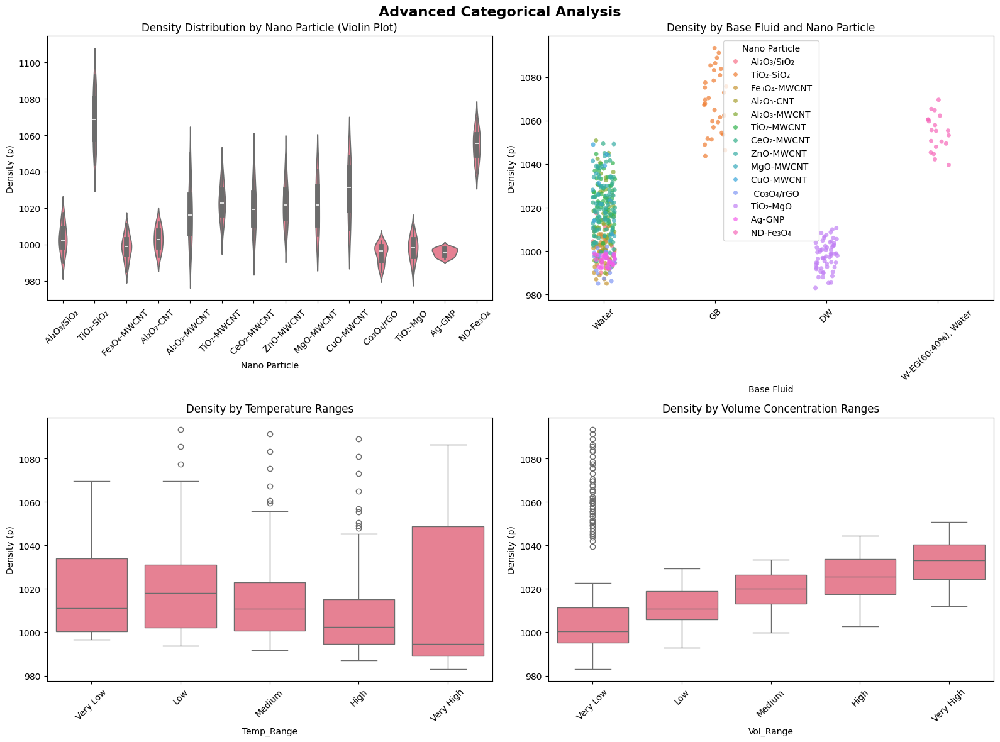


8. OUTLIER ANALYSIS
--------------------
Outlier Analysis (IQR Method):
--------------------------------------------------
Temperature (°C):
  Outliers: 0 (0.00%)
  Bounds: [0.00, 80.00]

Volume Concentration (ϕ):
  Outliers: 0 (0.00%)
  Bounds: [-1.25, 2.35]

Density of Nano Particle 1 (ρnp):
  Outliers: 30 (6.88%)
  Bounds: [2085.00, 8045.00]

Density of Nano Particle 2 (ρnp):
  Outliers: 100 (22.94%)
  Bounds: [1920.00, 2400.00]

Density of Base Fluid (ρbf):
  Outliers: 56 (12.84%)
  Bounds: [979.86, 1007.49]

Volume Mixture of Particle 1:
  Outliers: 0 (0.00%)
  Bounds: [-70.00, 170.00]

Volume Mixture of Particle 2:
  Outliers: 0 (0.00%)
  Bounds: [-70.00, 170.00]

Density (ρ):
  Outliers: 13 (2.98%)
  Bounds: [954.46, 1072.40]



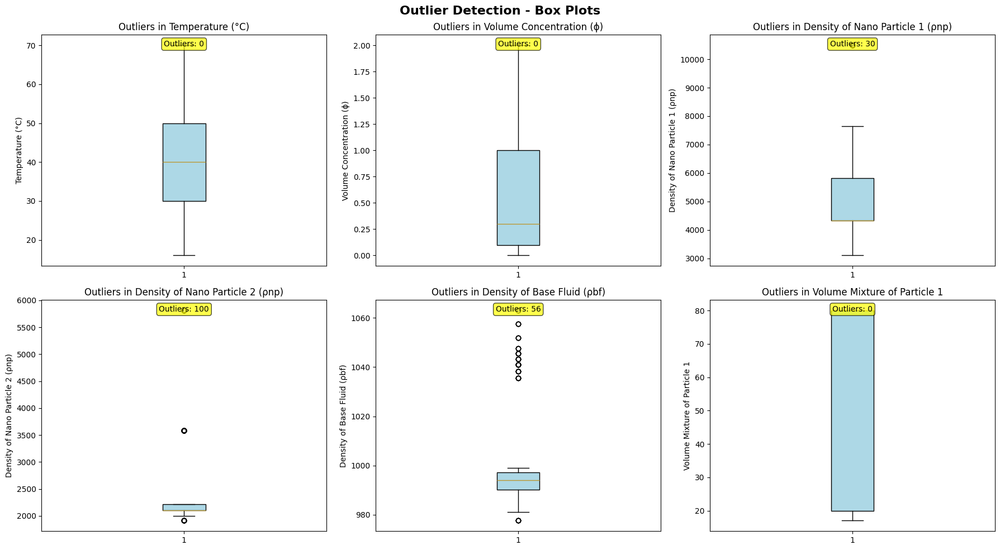


9. STATISTICAL TESTS
---------------------
Shapiro-Wilk Test for Normality (Density):
Statistic: 0.9076, p-value: 0.0000
Normal distribution: No

ANOVA Test - Density by Nano Particle:
F-statistic: 128.1625, p-value: 0.0000
Significant difference: Yes

ANOVA Test - Density by Base Fluid:
F-statistic: 224.6074, p-value: 0.0000
Significant difference: Yes

10. KEY INSIGHTS & SUMMARY

Dataset Characteristics:
• Total samples: 436
• Features: 9
• Target range: 983.01 - 1093.43
• Target mean: 1016.37 ± 22.69

Strongest Correlations with Density:
• Density of Base Fluid (ρbf): 0.774
• Density of Nano Particle 1 (ρnp): 0.298
• Volume Concentration (ϕ): 0.284

Categorical Variable Insights:
• Nano Particle: 14 unique values, most common: 'TiO₂-MgO '
• Base Fluid: 4 unique values, most common: 'Water'

Data Quality:
• Missing values: 0
• Total outliers detected: 199

EDA COMPLETE - Use these insights for feature engineering and model selection!


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import pearsonr, spearmanr
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

# Set style for better visualizations
plt.style.use('default')
sns.set_palette("husl")

# Load the dataset (assuming df is already loaded)
print("=" * 80)
print("COMPREHENSIVE EXPLORATORY DATA ANALYSIS")
print("Density Prediction Dataset")
print("=" * 80)

# ================================
# 1. BASIC DATASET INFORMATION
# ================================
print("\n1. BASIC DATASET INFORMATION")
print("-" * 40)
print(f"Dataset Shape: {df.shape}")
print(f"Number of Features: {df.shape[1] - 1}")
print(f"Target Variable: Density (ρ)")

print("\nDataset Info:")
df.info()

print("\nBasic Statistics:")
print(df.describe())

print("\nMissing Values:")
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0] if missing_values.sum() > 0 else "No missing values found!")

print("\nUnique Values in Categorical Columns:")
categorical_cols = ['Nano Particle', 'Base Fluid']
for col in categorical_cols:
    print(f"{col}: {df[col].nunique()} unique values - {list(df[col].unique())}")

# ================================
# 2. TARGET VARIABLE ANALYSIS
# ================================
print(f"\n2. TARGET VARIABLE ANALYSIS - Density (ρ)")
print("-" * 50)

target_stats = df['Density (ρ)'].describe()
print("Density Statistics:")
print(target_stats)

print(f"\nSkewness: {df['Density (ρ)'].skew():.4f}")
print(f"Kurtosis: {df['Density (ρ)'].kurtosis():.4f}")

# Target variable distribution plots
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Target Variable Analysis - Density (ρ)', fontsize=16, fontweight='bold')

# Histogram
axes[0,0].hist(df['Density (ρ)'], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
axes[0,0].axvline(df['Density (ρ)'].mean(), color='red', linestyle='--', label=f'Mean: {df["Density (ρ)"].mean():.2f}')
axes[0,0].axvline(df['Density (ρ)'].median(), color='green', linestyle='--', label=f'Median: {df["Density (ρ)"].median():.2f}')
axes[0,0].set_title('Distribution of Density')
axes[0,0].set_xlabel('Density (ρ)')
axes[0,0].set_ylabel('Frequency')
axes[0,0].legend()

# Box plot
box_data = axes[0,1].boxplot(df['Density (ρ)'], patch_artist=True)
box_data['boxes'][0].set_facecolor('lightblue')
axes[0,1].set_title('Box Plot of Density')
axes[0,1].set_ylabel('Density (ρ)')

# Q-Q plot
stats.probplot(df['Density (ρ)'], dist="norm", plot=axes[1,0])
axes[1,0].set_title('Q-Q Plot (Normal Distribution)')

# Violin plot
axes[1,1].violinplot(df['Density (ρ)'], positions=[1])
axes[1,1].set_title('Violin Plot of Density')
axes[1,1].set_ylabel('Density (ρ)')
axes[1,1].set_xticks([1])
axes[1,1].set_xticklabels(['Density'])

plt.tight_layout()
plt.show()

# ================================
# 3. UNIVARIATE ANALYSIS
# ================================
print(f"\n3. UNIVARIATE ANALYSIS")
print("-" * 25)

# Numerical columns analysis
numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
numerical_cols = [col for col in numerical_cols if col != 'Density (ρ)']

print(f"Numerical Features: {numerical_cols}")

# Create distribution plots for numerical features
n_cols = 3
n_rows = (len(numerical_cols) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
fig.suptitle('Distribution of Numerical Features', fontsize=16, fontweight='bold')

if n_rows == 1:
    axes = axes.reshape(1, -1)

for i, col in enumerate(numerical_cols):
    row = i // n_cols
    col_idx = i % n_cols

    # Histogram
    axes[row, col_idx].hist(df[col], bins=20, alpha=0.7, color='lightcoral', edgecolor='black')
    axes[row, col_idx].axvline(df[col].mean(), color='red', linestyle='--',
                               label=f'Mean: {df[col].mean():.2f}')
    axes[row, col_idx].set_title(f'Distribution of {col}')
    axes[row, col_idx].set_xlabel(col)
    axes[row, col_idx].set_ylabel('Frequency')
    axes[row, col_idx].legend()

    # Add statistics text
    skew_val = df[col].skew()
    axes[row, col_idx].text(0.7, 0.9, f'Skew: {skew_val:.2f}',
                           transform=axes[row, col_idx].transAxes,
                           bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.5))

# Hide empty subplots
for i in range(len(numerical_cols), n_rows * n_cols):
    row = i // n_cols
    col_idx = i % n_cols
    axes[row, col_idx].set_visible(False)

plt.tight_layout()
plt.show()

# ================================
# 4. BIVARIATE ANALYSIS
# ================================
print(f"\n4. BIVARIATE ANALYSIS")
print("-" * 22)

# Correlation Matrix
print("Correlation Matrix (Pearson):")
correlation_matrix = df.select_dtypes(include=[np.number]).corr()
print(correlation_matrix.round(3))

# Heatmap
plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, annot=True, cmap='RdYlBu_r', center=0,
            square=True, mask=mask, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix Heatmap', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Feature vs Target correlation
target_corr = correlation_matrix['Density (ρ)'].drop('Density (ρ)').abs().sort_values(ascending=False)
print(f"\nFeatures correlation with Target (absolute values):")
for feature, corr in target_corr.items():
    print(f"{feature}: {corr:.4f}")

# Scatter plots of features vs target
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
fig.suptitle('Feature vs Target Relationships', fontsize=16, fontweight='bold')

for i, feature in enumerate(numerical_cols):
    row = i // 3
    col = i % 3

    axes[row, col].scatter(df[feature], df['Density (ρ)'], alpha=0.6, color='blue')

    # Add trend line
    z = np.polyfit(df[feature], df['Density (ρ)'], 1)
    p = np.poly1d(z)
    axes[row, col].plot(df[feature], p(df[feature]), "r--", alpha=0.8)

    # Calculate correlation
    corr, p_value = pearsonr(df[feature], df['Density (ρ)'])
    axes[row, col].set_title(f'{feature} vs Density\nCorr: {corr:.3f} (p: {p_value:.3f})')
    axes[row, col].set_xlabel(feature)
    axes[row, col].set_ylabel('Density (ρ)')
    axes[row, col].grid(True, alpha=0.3)

# Hide empty subplots if any
for i in range(len(numerical_cols), 9):
    row = i // 3
    col = i % 3
    axes[row, col].set_visible(False)

plt.tight_layout()
plt.show()

# ================================
# 5. CATEGORICAL VARIABLE ANALYSIS
# ================================
print(f"\n5. CATEGORICAL VARIABLE ANALYSIS")
print("-" * 35)

# Analysis by Nano Particle type
print("Analysis by Nano Particle:")
nano_particle_stats = df.groupby('Nano Particle')['Density (ρ)'].agg([
    'count', 'mean', 'std', 'min', 'max'
]).round(3)
print(nano_particle_stats)

# Analysis by Base Fluid
print("\nAnalysis by Base Fluid:")
base_fluid_stats = df.groupby('Base Fluid')['Density (ρ)'].agg([
    'count', 'mean', 'std', 'min', 'max'
]).round(3)
print(base_fluid_stats)

# Box plots for categorical variables
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Density Distribution by Categorical Variables', fontsize=16, fontweight='bold')

# Box plot by Nano Particle
sns.boxplot(data=df, x='Nano Particle', y='Density (ρ)', ax=axes[0])
axes[0].set_title('Density by Nano Particle Type')
axes[0].tick_params(axis='x', rotation=45)

# Box plot by Base Fluid
sns.boxplot(data=df, x='Base Fluid', y='Density (ρ)', ax=axes[1])
axes[1].set_title('Density by Base Fluid Type')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# ================================
# 6. MULTIVARIATE ANALYSIS
# ================================
print(f"\n6. MULTIVARIATE ANALYSIS")
print("-" * 27)

# 3D scatter plot using key variables
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Create scatter plot with color mapping
scatter = ax.scatter(df['Temperature (°C)'],
                    df['Volume Concentration (ϕ)'],
                    df['Density (ρ)'],
                    c=df['Density of Base Fluid (ρbf)'],
                    cmap='viridis',
                    alpha=0.6,
                    s=50)

ax.set_xlabel('Temperature (°C)')
ax.set_ylabel('Volume Concentration (ϕ)')
ax.set_zlabel('Density (ρ)')
ax.set_title('3D Relationship: Temperature, Volume Concentration & Density\n(Color: Base Fluid Density)')
plt.colorbar(scatter, shrink=0.5, aspect=20, label='Base Fluid Density')
plt.show()

# Pair plot for key numerical variables
key_vars = ['Temperature (°C)', 'Volume Concentration (ϕ)',
           'Density of Base Fluid (ρbf)', 'Density (ρ)']
pair_plot_data = df[key_vars]

plt.figure(figsize=(12, 10))
sns.pairplot(pair_plot_data, diag_kind='hist', plot_kws={'alpha': 0.6})
plt.suptitle('Pair Plot of Key Variables', y=1.02, fontsize=16, fontweight='bold')
plt.show()

# ================================
# 7. ADVANCED VISUALIZATIONS
# ================================
print(f"\n7. ADVANCED VISUALIZATIONS")
print("-" * 30)

# Density distribution by multiple categorical variables
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Advanced Categorical Analysis', fontsize=16, fontweight='bold')

# Violin plot by Nano Particle
sns.violinplot(data=df, x='Nano Particle', y='Density (ρ)', ax=axes[0,0])
axes[0,0].set_title('Density Distribution by Nano Particle (Violin Plot)')
axes[0,0].tick_params(axis='x', rotation=45)

# Strip plot with jitter
sns.stripplot(data=df, x='Base Fluid', y='Density (ρ)',
              hue='Nano Particle', alpha=0.7, ax=axes[0,1])
axes[0,1].set_title('Density by Base Fluid and Nano Particle')
axes[0,1].tick_params(axis='x', rotation=45)

# Temperature binned analysis
df_temp = df.copy()
df_temp['Temp_Range'] = pd.cut(df_temp['Temperature (°C)'],
                              bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
sns.boxplot(data=df_temp, x='Temp_Range', y='Density (ρ)', ax=axes[1,0])
axes[1,0].set_title('Density by Temperature Ranges')
axes[1,0].tick_params(axis='x', rotation=45)

# Volume concentration binned analysis
df_vol = df.copy()
df_vol['Vol_Range'] = pd.cut(df_vol['Volume Concentration (ϕ)'],
                            bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
sns.boxplot(data=df_vol, x='Vol_Range', y='Density (ρ)', ax=axes[1,1])
axes[1,1].set_title('Density by Volume Concentration Ranges')
axes[1,1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# ================================
# 8. OUTLIER ANALYSIS
# ================================
print(f"\n8. OUTLIER ANALYSIS")
print("-" * 20)

# Function to detect outliers using IQR method
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

# Detect outliers for all numerical columns
outlier_summary = {}
for col in numerical_cols + ['Density (ρ)']:
    outliers, lower_bound, upper_bound = detect_outliers_iqr(df, col)
    outlier_summary[col] = {
        'count': len(outliers),
        'percentage': (len(outliers) / len(df)) * 100,
        'lower_bound': lower_bound,
        'upper_bound': upper_bound
    }

print("Outlier Analysis (IQR Method):")
print("-" * 50)
for col, outlier_stats in outlier_summary.items():
    print(f"{col}:")
    print(f"  Outliers: {outlier_stats['count']} ({outlier_stats['percentage']:.2f}%)")
    print(f"  Bounds: [{outlier_stats['lower_bound']:.2f}, {outlier_stats['upper_bound']:.2f}]")
    print()

# Outlier visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Outlier Detection - Box Plots', fontsize=16, fontweight='bold')

cols_to_plot = numerical_cols[:6]  # Plot first 6 numerical columns
for i, col in enumerate(cols_to_plot):
    row = i // 3
    col_idx = i % 3

    bp = axes[row, col_idx].boxplot(df[col], patch_artist=True)
    bp['boxes'][0].set_facecolor('lightblue')
    axes[row, col_idx].set_title(f'Outliers in {col}')
    axes[row, col_idx].set_ylabel(col)

    # Add outlier count
    outlier_count = outlier_summary[col]['count']
    axes[row, col_idx].text(0.5, 0.95, f'Outliers: {outlier_count}',
                           transform=axes[row, col_idx].transAxes, ha='center',
                           bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.7))

plt.tight_layout()
plt.show()

# ================================
# 9. STATISTICAL TESTS
# ================================
print(f"\n9. STATISTICAL TESTS")
print("-" * 21)

# Normality tests for target variable
shapiro_stat, shapiro_p = stats.shapiro(df['Density (ρ)'].sample(min(5000, len(df))))
print(f"Shapiro-Wilk Test for Normality (Density):")
print(f"Statistic: {shapiro_stat:.4f}, p-value: {shapiro_p:.4f}")
print(f"Normal distribution: {'Yes' if shapiro_p > 0.05 else 'No'}")

# ANOVA test for categorical variables
from scipy.stats import f_oneway

# Test if density differs significantly across Nano Particle types
nano_groups = [group['Density (ρ)'].values for name, group in df.groupby('Nano Particle')]
if len(nano_groups) > 1:
    f_stat, p_val = f_oneway(*nano_groups)
    print(f"\nANOVA Test - Density by Nano Particle:")
    print(f"F-statistic: {f_stat:.4f}, p-value: {p_val:.4f}")
    print(f"Significant difference: {'Yes' if p_val < 0.05 else 'No'}")

# Test for Base Fluid
fluid_groups = [group['Density (ρ)'].values for name, group in df.groupby('Base Fluid')]
if len(fluid_groups) > 1:
    f_stat, p_val = f_oneway(*fluid_groups)
    print(f"\nANOVA Test - Density by Base Fluid:")
    print(f"F-statistic: {f_stat:.4f}, p-value: {p_val:.4f}")
    print(f"Significant difference: {'Yes' if p_val < 0.05 else 'No'}")

# ================================
# 10. DATA INSIGHTS & SUMMARY
# ================================
print(f"\n10. KEY INSIGHTS & SUMMARY")
print("=" * 30)

print("\nDataset Characteristics:")
print(f"• Total samples: {len(df)}")
print(f"• Features: {df.shape[1] - 1}")
print(f"• Target range: {df['Density (ρ)'].min():.2f} - {df['Density (ρ)'].max():.2f}")
print(f"• Target mean: {df['Density (ρ)'].mean():.2f} ± {df['Density (ρ)'].std():.2f}")

print("\nStrongest Correlations with Density:")
top_correlations = target_corr.head(3)
for feature, corr in top_correlations.items():
    print(f"• {feature}: {corr:.3f}")

print(f"\nCategorical Variable Insights:")
for cat_col in categorical_cols:
    unique_count = df[cat_col].nunique()
    most_common = df[cat_col].mode()[0]
    print(f"• {cat_col}: {unique_count} unique values, most common: '{most_common}'")

print(f"\nData Quality:")
print(f"• Missing values: {df.isnull().sum().sum()}")
total_outliers = sum([outlier_stats['count'] for outlier_stats in outlier_summary.values()])
print(f"• Total outliers detected: {total_outliers}")

print("\n" + "="*80)
print("EDA COMPLETE - Use these insights for feature engineering and model selection!")
print("="*80)

INDIVIDUAL EDA VISUALIZATIONS - BASIC AND ADVANCED TECHNIQUES

🔴 BASIC VISUALIZATION TECHNIQUES
--------------------------------------------------
1. Enhanced Histogram of Target Variable


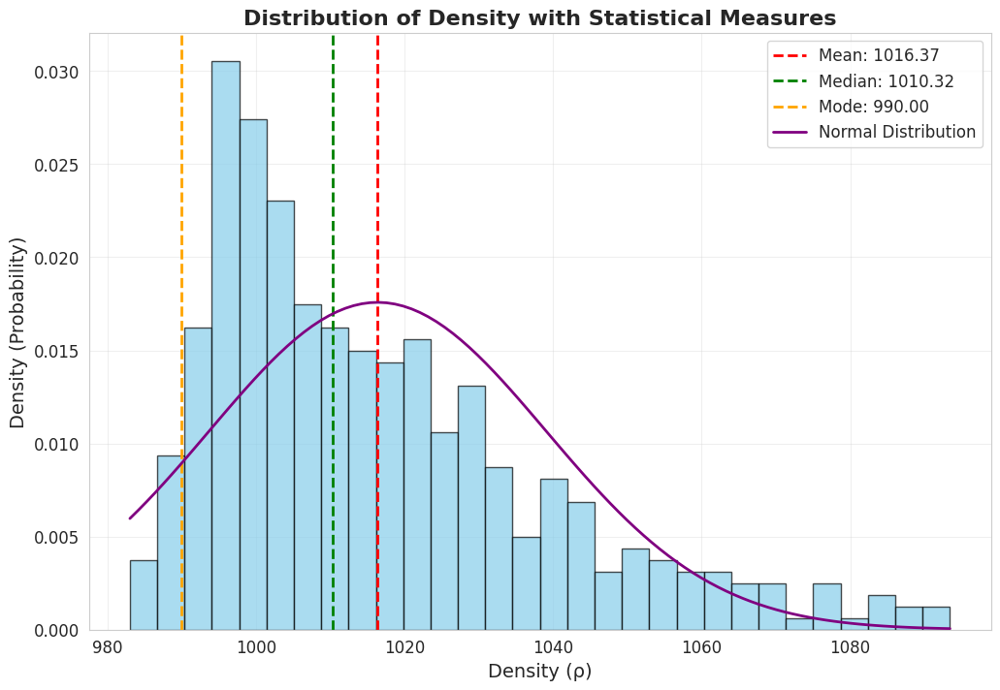

2. Advanced Box Plot with Outlier Analysis


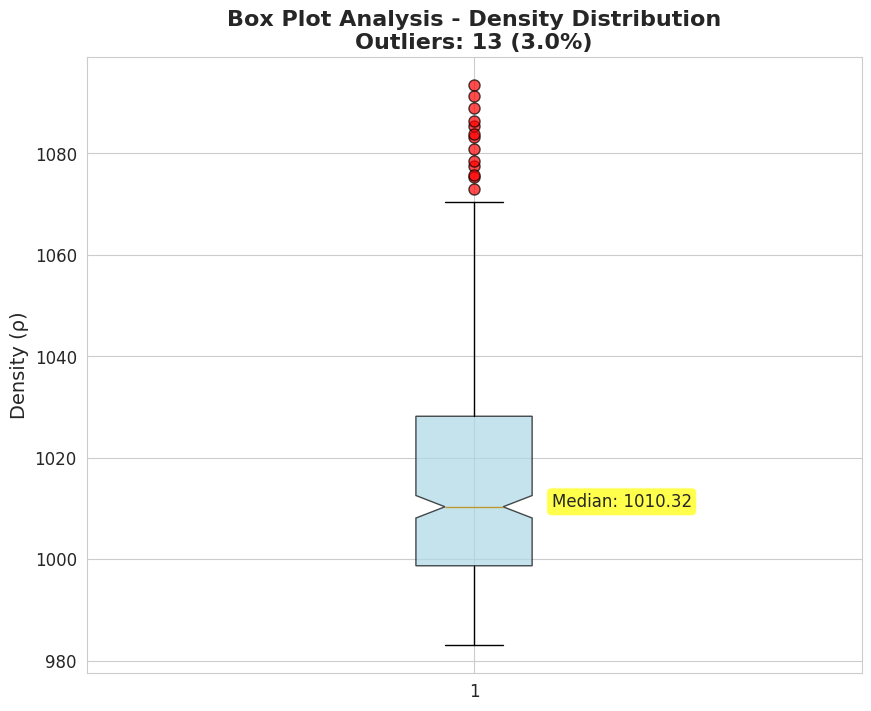

3. Enhanced Scatter Plot - Temperature vs Density


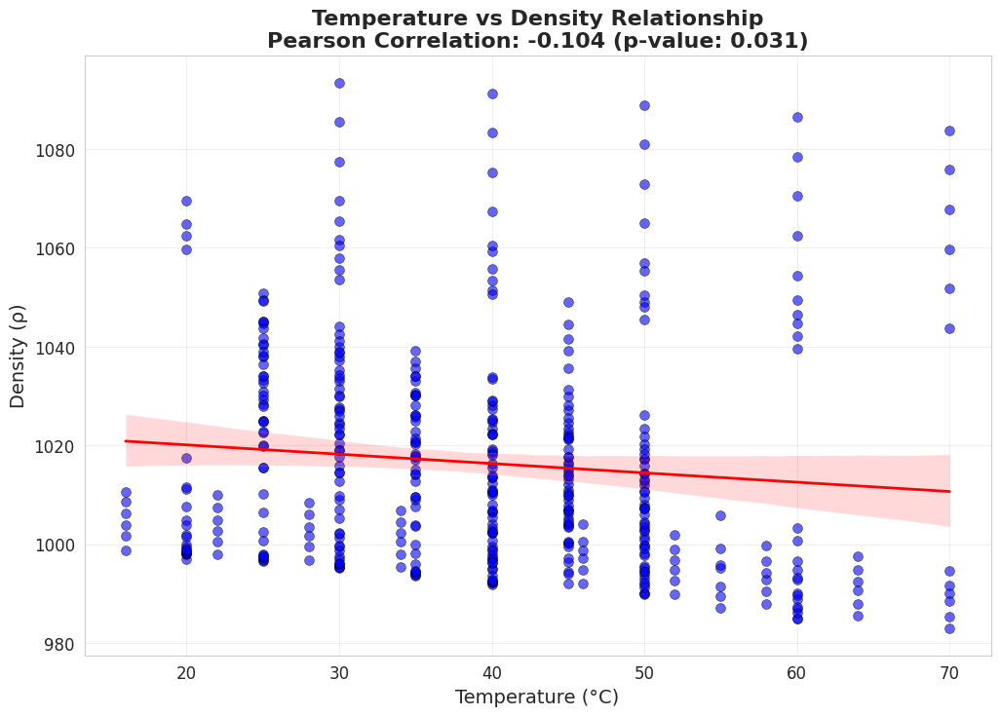

4. Categorical Analysis - Nano Particle Types


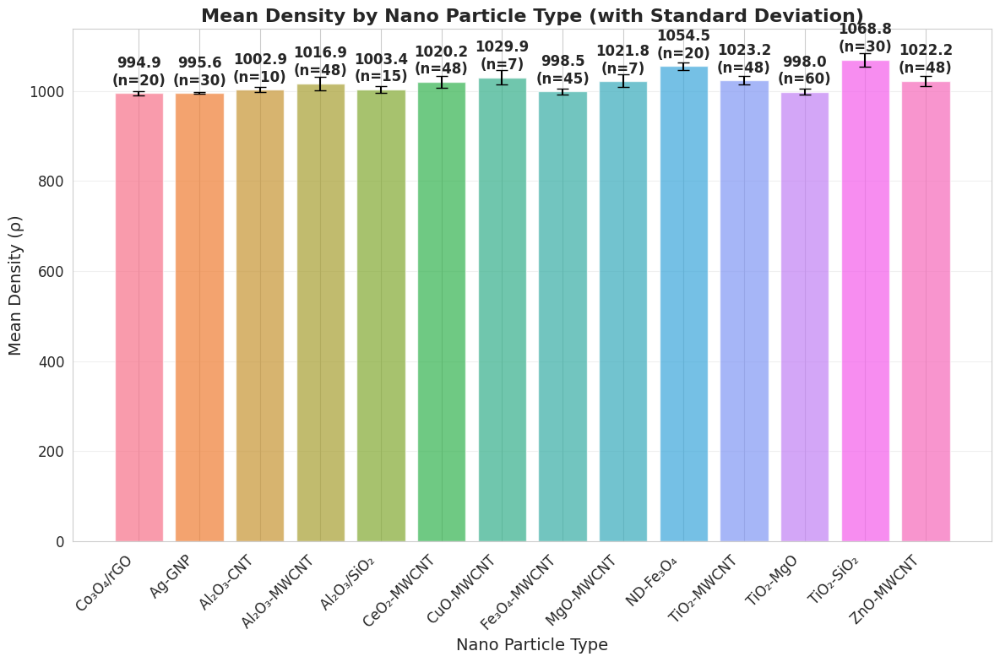

5. Advanced Correlation Heatmap


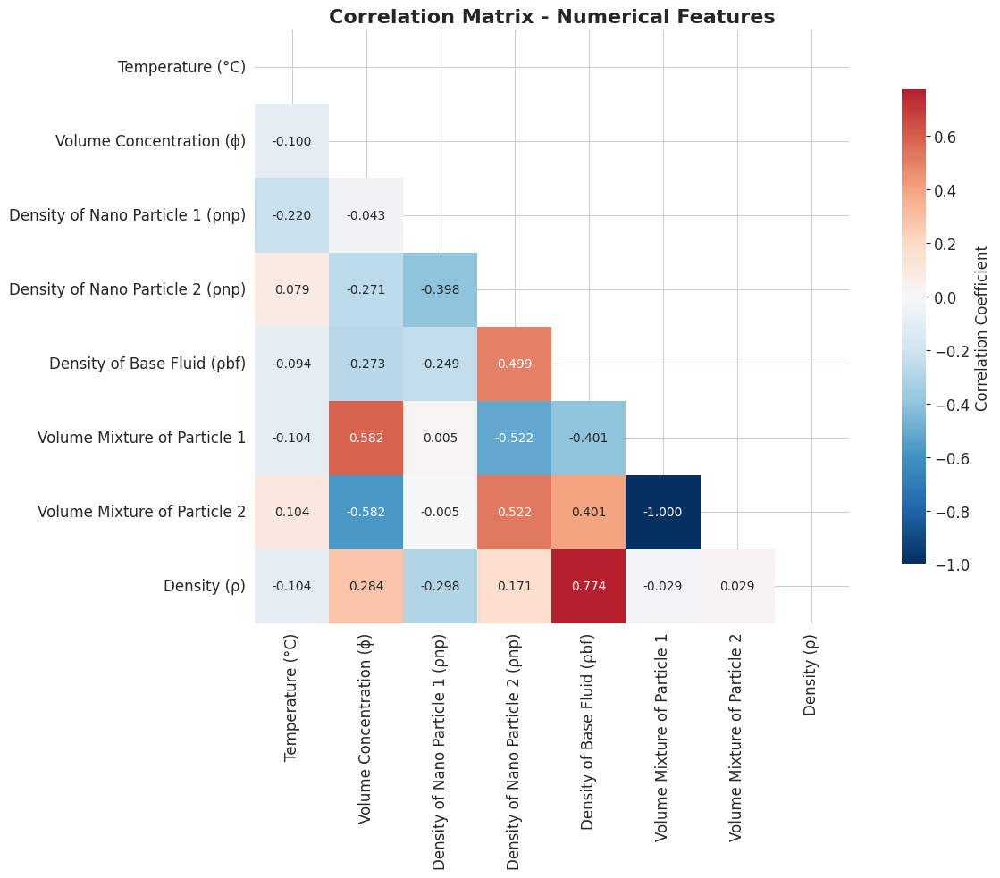


🟢 ADVANCED VISUALIZATION TECHNIQUES
--------------------------------------------------
6. Advanced Violin Plot with Statistical Overlays


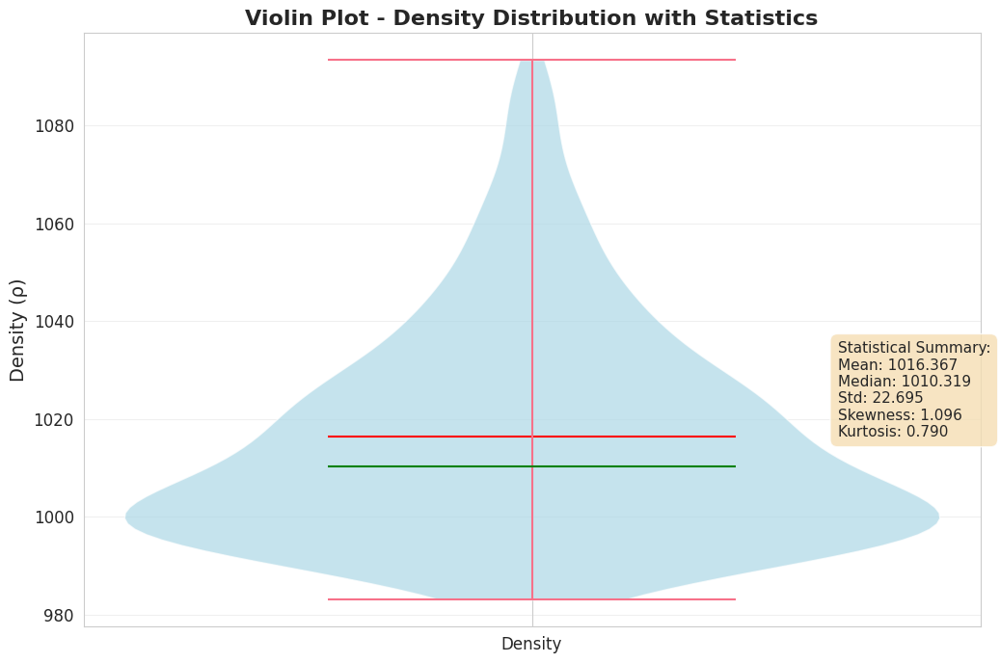

7. Ridge Plot - Density Distribution by Nano Particle Types


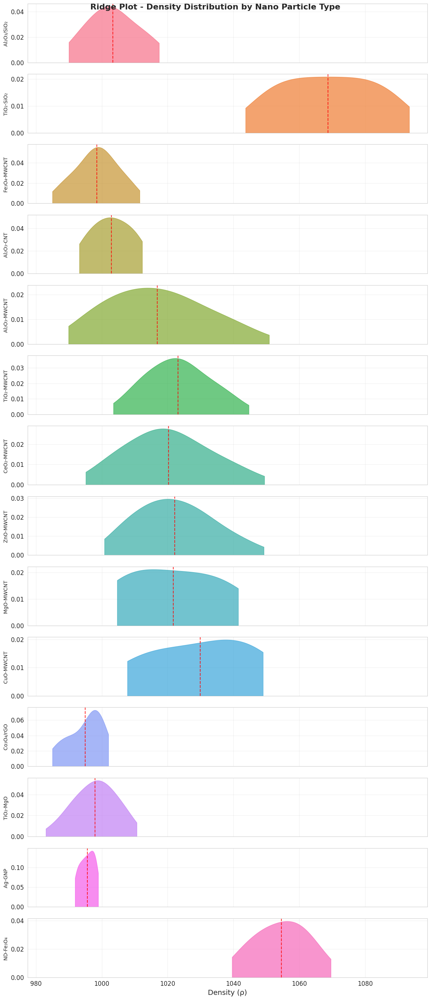

8. Hexbin Plot - Temperature vs Volume Concentration


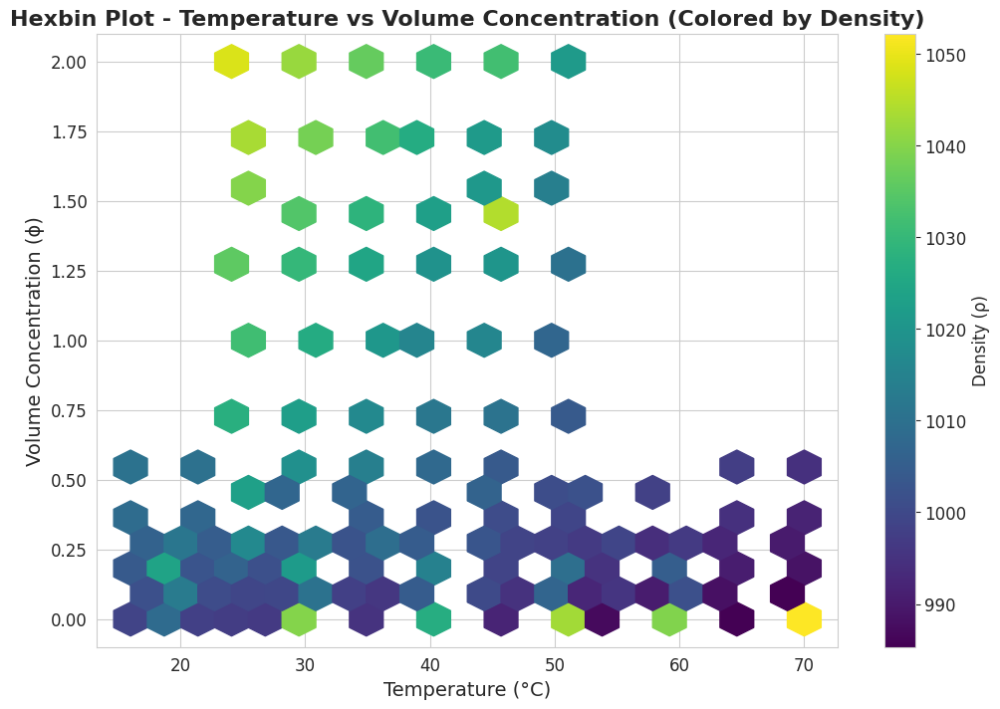

9. Andrews Curves - Multivariate Pattern Analysis


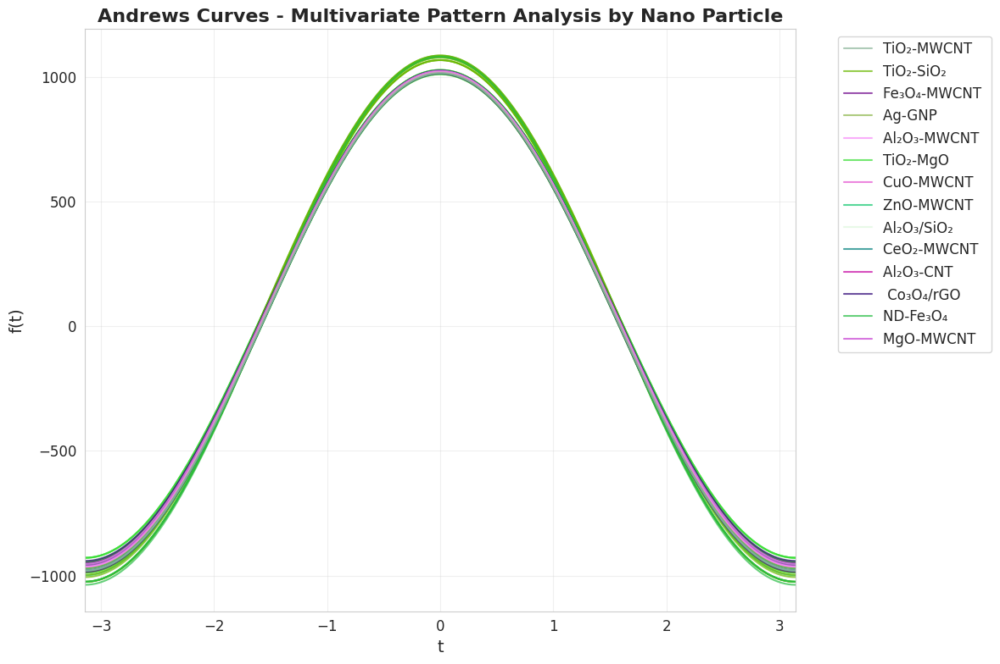

10. Parallel Coordinates Plot


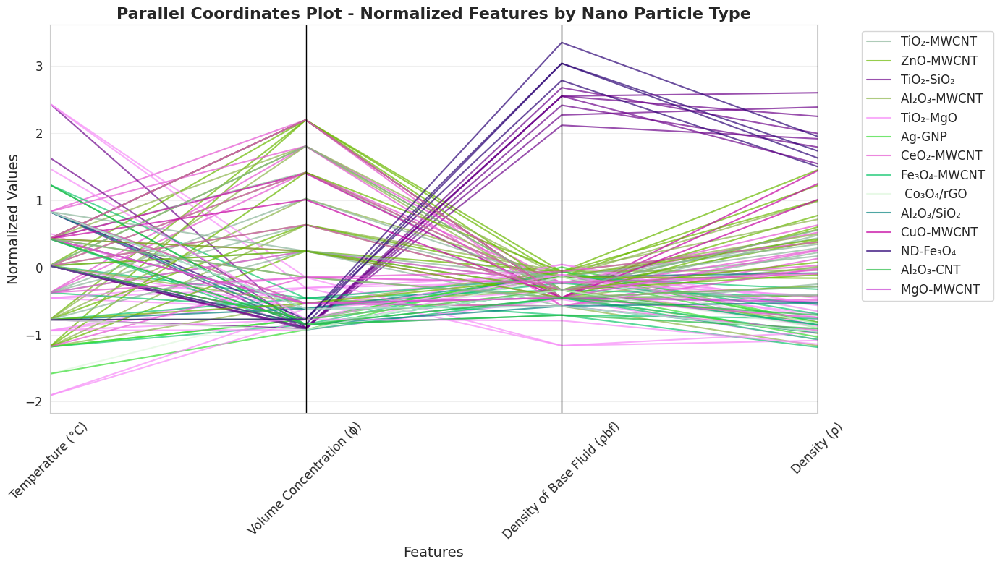

11. Raincloud Plot - Base Fluid Analysis


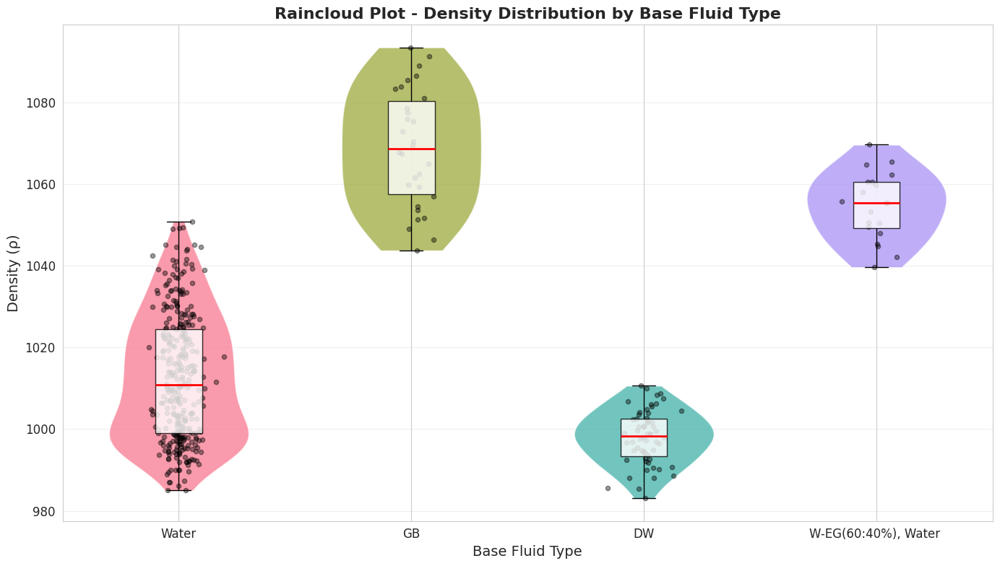

12. Contour Plot - Temperature vs Volume Concentration


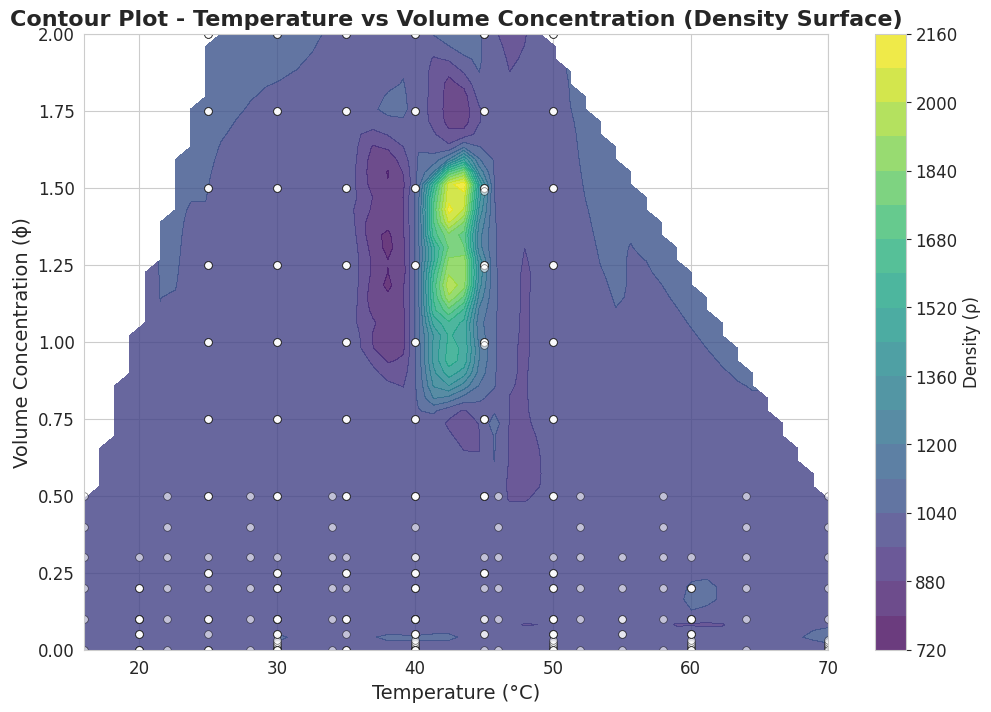

13. Q-Q Plot - Normality Assessment


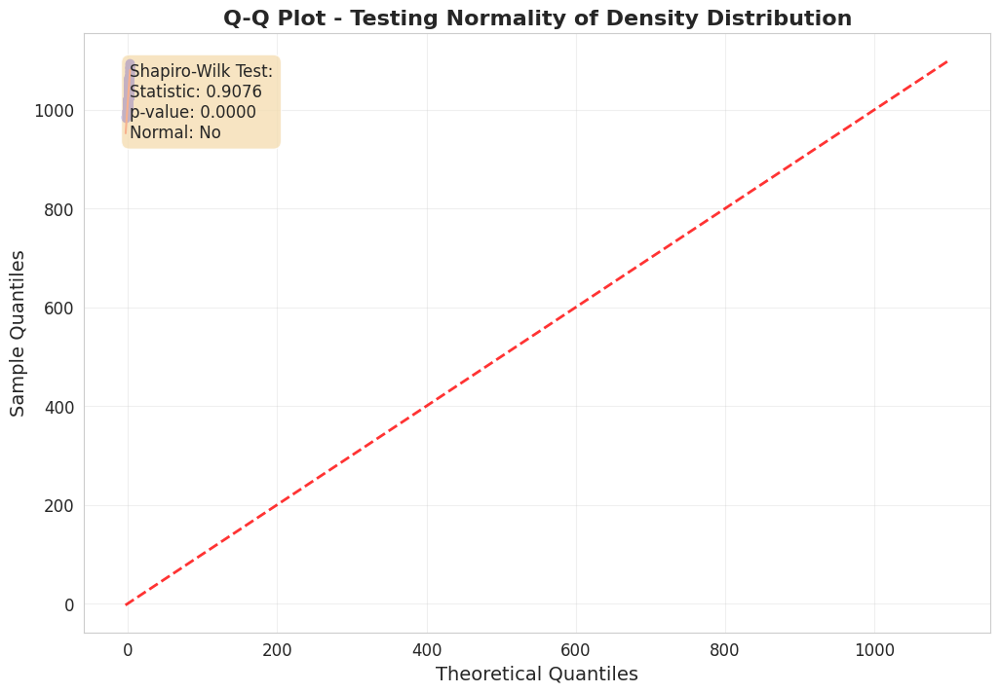

14. Cumulative Distribution Function Analysis


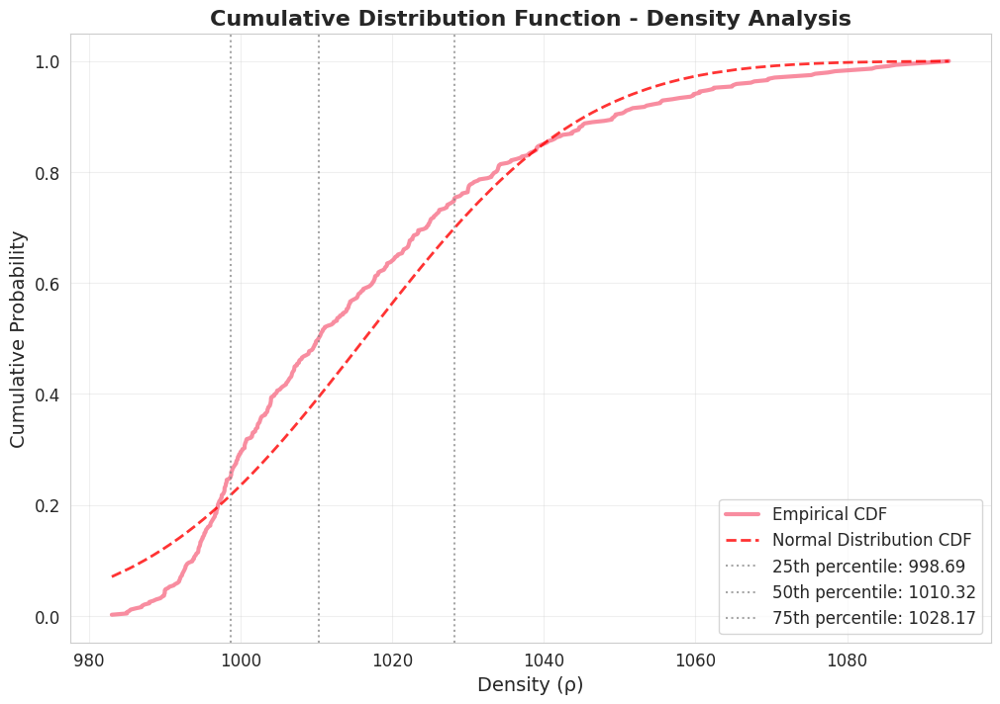

15. Residual Analysis - Linear Regression


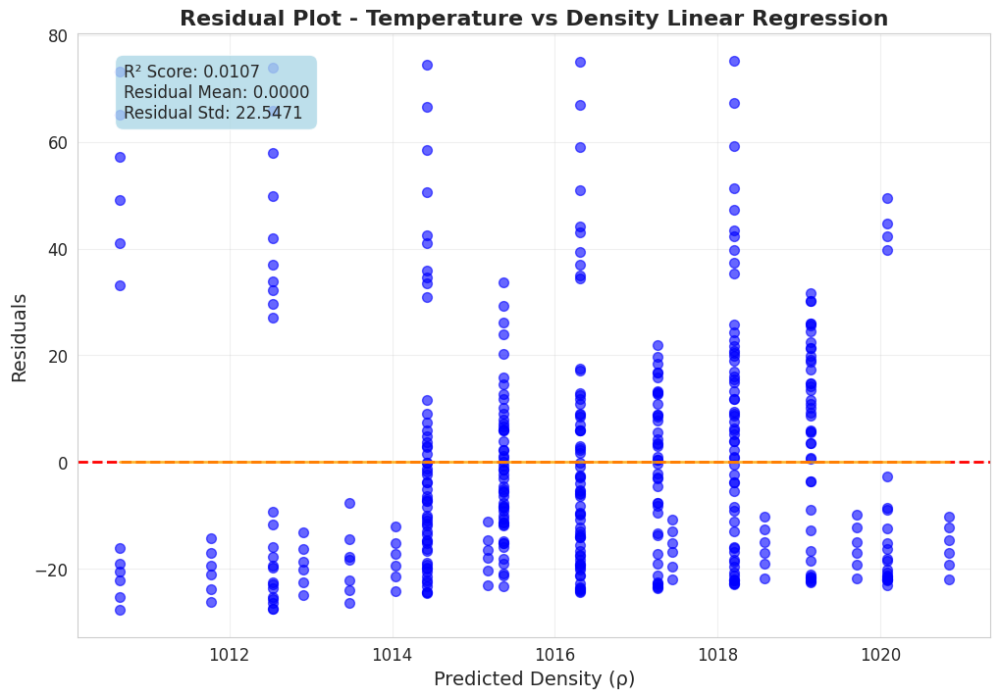


🎯 INDIVIDUAL VISUALIZATION ANALYSIS COMPLETE!
Each plot provides unique insights into your dataset.
Use these visualizations to understand patterns, relationships, and data quality.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import pearsonr, spearmanr, chi2_contingency
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12
sns.set_style("whitegrid")
sns.set_palette("husl")

print("="*80)
print("INDIVIDUAL EDA VISUALIZATIONS - BASIC AND ADVANCED TECHNIQUES")
print("="*80)

# ================================
# BASIC VISUALIZATION TECHNIQUES
# ================================

print("\n🔴 BASIC VISUALIZATION TECHNIQUES")
print("-"*50)

# 1. Basic Histogram with Statistics
print("1. Enhanced Histogram of Target Variable")
plt.figure(figsize=(12, 8))
plt.hist(df['Density (ρ)'], bins=30, alpha=0.7, color='skyblue', edgecolor='black', density=True)
plt.axvline(df['Density (ρ)'].mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {df["Density (ρ)"].mean():.2f}')
plt.axvline(df['Density (ρ)'].median(), color='green', linestyle='--', linewidth=2, label=f'Median: {df["Density (ρ)"].median():.2f}')
plt.axvline(df['Density (ρ)'].mode()[0], color='orange', linestyle='--', linewidth=2, label=f'Mode: {df["Density (ρ)"].mode()[0]:.2f}')

# Add normal distribution overlay
x = np.linspace(df['Density (ρ)'].min(), df['Density (ρ)'].max(), 100)
normal_dist = stats.norm.pdf(x, df['Density (ρ)'].mean(), df['Density (ρ)'].std())
plt.plot(x, normal_dist, 'purple', linewidth=2, label='Normal Distribution')

plt.title('Distribution of Density with Statistical Measures', fontsize=16, fontweight='bold')
plt.xlabel('Density (ρ)', fontsize=14)
plt.ylabel('Density (Probability)', fontsize=14)
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# 2. Advanced Box Plot with Outlier Information
print("2. Advanced Box Plot with Outlier Analysis")
plt.figure(figsize=(10, 8))
box_plot = plt.boxplot(df['Density (ρ)'], patch_artist=True, notch=True,
                       boxprops=dict(facecolor='lightblue', alpha=0.7),
                       flierprops=dict(marker='o', markerfacecolor='red', markersize=8, alpha=0.7))

# Calculate quartiles and IQR
Q1 = df['Density (ρ)'].quantile(0.25)
Q3 = df['Density (ρ)'].quantile(0.75)
IQR = Q3 - Q1
lower_whisker = Q1 - 1.5 * IQR
upper_whisker = Q3 + 1.5 * IQR
outliers = df[(df['Density (ρ)'] < lower_whisker) | (df['Density (ρ)'] > upper_whisker)]

plt.title(f'Box Plot Analysis - Density Distribution\nOutliers: {len(outliers)} ({len(outliers)/len(df)*100:.1f}%)',
          fontsize=16, fontweight='bold')
plt.ylabel('Density (ρ)', fontsize=14)
plt.text(1.1, df['Density (ρ)'].median(), f'Median: {df["Density (ρ)"].median():.2f}',
         fontsize=12, bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.7))
plt.show()

# 3. Scatter Plot with Regression Line and Confidence Interval
print("3. Enhanced Scatter Plot - Temperature vs Density")
plt.figure(figsize=(12, 8))
x = df['Temperature (°C)']
y = df['Density (ρ)']

plt.scatter(x, y, alpha=0.6, c='blue', s=50, edgecolors='black', linewidth=0.5)

# Add regression line with confidence interval
sns.regplot(x='Temperature (°C)', y='Density (ρ)', data=df, scatter=False,
            color='red', line_kws={'linewidth': 2})

# Calculate and display correlation
corr, p_value = pearsonr(x, y)
plt.title(f'Temperature vs Density Relationship\nPearson Correlation: {corr:.3f} (p-value: {p_value:.3f})',
          fontsize=16, fontweight='bold')
plt.xlabel('Temperature (°C)', fontsize=14)
plt.ylabel('Density (ρ)', fontsize=14)
plt.grid(True, alpha=0.3)
plt.show()

# 4. Categorical Bar Plot with Error Bars
print("4. Categorical Analysis - Nano Particle Types")
nano_stats = df.groupby('Nano Particle')['Density (ρ)'].agg(['mean', 'std', 'count']).reset_index()

plt.figure(figsize=(12, 8))
bars = plt.bar(nano_stats['Nano Particle'], nano_stats['mean'],
               yerr=nano_stats['std'], capsize=5, alpha=0.7,
               color=sns.color_palette("husl", len(nano_stats)))

# Add value labels on bars
for i, (bar, mean_val, count) in enumerate(zip(bars, nano_stats['mean'], nano_stats['count'])):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + bar.get_height()*0.01,
             f'{mean_val:.1f}\n(n={count})', ha='center', va='bottom', fontweight='bold')

plt.title('Mean Density by Nano Particle Type (with Standard Deviation)', fontsize=16, fontweight='bold')
plt.xlabel('Nano Particle Type', fontsize=14)
plt.ylabel('Mean Density (ρ)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# 5. Comprehensive Correlation Heatmap
print("5. Advanced Correlation Heatmap")
plt.figure(figsize=(14, 10))

# Calculate correlation matrix
corr_matrix = df.select_dtypes(include=[np.number]).corr()

# Create mask for upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Generate heatmap
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='RdBu_r', center=0,
            square=True, fmt='.3f', cbar_kws={"shrink": .8, "label": "Correlation Coefficient"},
            annot_kws={"size": 10})

plt.title('Correlation Matrix - Numerical Features', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# ================================
# ADVANCED VISUALIZATION TECHNIQUES
# ================================

print("\n🟢 ADVANCED VISUALIZATION TECHNIQUES")
print("-"*50)

# 6. Violin Plot with Box Plot Overlay
print("6. Advanced Violin Plot with Statistical Overlays")
plt.figure(figsize=(12, 8))

# Create violin plot
parts = plt.violinplot(df['Density (ρ)'], positions=[1], showmeans=True, showmedians=True,
                       showextrema=True, widths=0.8)

# Customize violin plot colors
parts['bodies'][0].set_facecolor('lightblue')
parts['bodies'][0].set_alpha(0.7)
parts['cmeans'].set_color('red')
parts['cmedians'].set_color('green')

# Add statistical information
stats_text = f"""Statistical Summary:
Mean: {df['Density (ρ)'].mean():.3f}
Median: {df['Density (ρ)'].median():.3f}
Std: {df['Density (ρ)'].std():.3f}
Skewness: {df['Density (ρ)'].skew():.3f}
Kurtosis: {df['Density (ρ)'].kurtosis():.3f}"""

plt.text(1.3, df['Density (ρ)'].mean(), stats_text, fontsize=11,
         bbox=dict(boxstyle="round,pad=0.5", facecolor="wheat", alpha=0.8))

plt.title('Violin Plot - Density Distribution with Statistics', fontsize=16, fontweight='bold')
plt.ylabel('Density (ρ)', fontsize=14)
plt.xticks([1], ['Density'])
plt.grid(axis='y', alpha=0.3)
plt.show()

# 7. Ridge Plot (Joy Plot) for Multiple Categories
print("7. Ridge Plot - Density Distribution by Nano Particle Types")
fig, axes = plt.subplots(len(df['Nano Particle'].unique()), 1,
                        figsize=(12, 2*len(df['Nano Particle'].unique())), sharex=True)

nano_types = df['Nano Particle'].unique()
colors = sns.color_palette("husl", len(nano_types))

for i, (nano_type, color) in enumerate(zip(nano_types, colors)):
    data = df[df['Nano Particle'] == nano_type]['Density (ρ)']

    axes[i].fill_between(np.linspace(data.min(), data.max(), 100),
                        0, stats.gaussian_kde(data)(np.linspace(data.min(), data.max(), 100)),
                        alpha=0.7, color=color)
    axes[i].set_ylabel(nano_type, fontsize=10)
    axes[i].set_ylim(0, None)
    axes[i].grid(True, alpha=0.3)

    # Add mean line
    axes[i].axvline(data.mean(), color='red', linestyle='--', alpha=0.8)

plt.suptitle('Ridge Plot - Density Distribution by Nano Particle Type', fontsize=16, fontweight='bold')
plt.xlabel('Density (ρ)', fontsize=14)
plt.tight_layout()
plt.show()

# 8. Hexbin Plot for Density Visualization
print("8. Hexbin Plot - Temperature vs Volume Concentration")
plt.figure(figsize=(12, 8))
hexbin = plt.hexbin(df['Temperature (°C)'], df['Volume Concentration (ϕ)'],
                   C=df['Density (ρ)'], gridsize=20, cmap='viridis', mincnt=1)
plt.colorbar(hexbin, label='Density (ρ)')
plt.title('Hexbin Plot - Temperature vs Volume Concentration (Colored by Density)',
          fontsize=16, fontweight='bold')
plt.xlabel('Temperature (°C)', fontsize=14)
plt.ylabel('Volume Concentration (ϕ)', fontsize=14)
plt.show()

# 9. Andrews Curves for Multivariate Visualization
print("9. Andrews Curves - Multivariate Pattern Analysis")
from pandas.plotting import andrews_curves

# Select key features for Andrews curves
andrews_data = df[['Temperature (°C)', 'Volume Concentration (ϕ)',
                  'Density of Base Fluid (ρbf)', 'Nano Particle']].sample(100)  # Sample for clarity

plt.figure(figsize=(12, 8))
andrews_curves(andrews_data, 'Nano Particle', alpha=0.7)
plt.title('Andrews Curves - Multivariate Pattern Analysis by Nano Particle',
          fontsize=16, fontweight='bold')
plt.xlabel('t', fontsize=14)
plt.ylabel('f(t)', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 10. Parallel Coordinates Plot
print("10. Parallel Coordinates Plot")
from pandas.plotting import parallel_coordinates

# Normalize data for better visualization
parallel_data = df[['Temperature (°C)', 'Volume Concentration (ϕ)',
                   'Density of Base Fluid (ρbf)', 'Density (ρ)', 'Nano Particle']].copy()

# Normalize numerical columns
numerical_cols = ['Temperature (°C)', 'Volume Concentration (ϕ)',
                 'Density of Base Fluid (ρbf)', 'Density (ρ)']
scaler = StandardScaler()
parallel_data[numerical_cols] = scaler.fit_transform(parallel_data[numerical_cols])

# Sample data for clarity
parallel_data_sample = parallel_data.sample(100)

plt.figure(figsize=(14, 8))
parallel_coordinates(parallel_data_sample, 'Nano Particle', alpha=0.7)
plt.title('Parallel Coordinates Plot - Normalized Features by Nano Particle Type',
          fontsize=16, fontweight='bold')
plt.xlabel('Features', fontsize=14)
plt.ylabel('Normalized Values', fontsize=14)
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 11. Raincloud Plot (Combination of violin, box, and strip plots)
print("11. Raincloud Plot - Base Fluid Analysis")
plt.figure(figsize=(14, 8))

base_fluids = df['Base Fluid'].unique()
positions = np.arange(len(base_fluids))

for i, fluid in enumerate(base_fluids):
    data = df[df['Base Fluid'] == fluid]['Density (ρ)']

    # Violin plot (half)
    parts = plt.violinplot(data, positions=[i], showmeans=False, showmedians=False,
                          showextrema=False, widths=0.6)
    for pc in parts['bodies']:
        pc.set_facecolor(sns.color_palette("husl", len(base_fluids))[i])
        pc.set_alpha(0.7)

    # Box plot overlay
    bp = plt.boxplot(data, positions=[i], widths=0.2, patch_artist=True,
                    boxprops=dict(facecolor='white', alpha=0.8),
                    medianprops=dict(color='red', linewidth=2))

    # Strip plot (jittered points)
    y_jitter = np.random.normal(i, 0.05, len(data))
    plt.scatter(y_jitter, data, alpha=0.4, s=20, color='black')

plt.title('Raincloud Plot - Density Distribution by Base Fluid Type',
          fontsize=16, fontweight='bold')
plt.xlabel('Base Fluid Type', fontsize=14)
plt.ylabel('Density (ρ)', fontsize=14)
plt.xticks(positions, base_fluids)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# 12. Contour Plot for 3D Relationship Visualization
print("12. Contour Plot - Temperature vs Volume Concentration")
plt.figure(figsize=(12, 8))

# Create a grid for contour plot
temp_range = np.linspace(df['Temperature (°C)'].min(), df['Temperature (°C)'].max(), 50)
vol_range = np.linspace(df['Volume Concentration (ϕ)'].min(), df['Volume Concentration (ϕ)'].max(), 50)
temp_grid, vol_grid = np.meshgrid(temp_range, vol_range)

# Interpolate density values
from scipy.interpolate import griddata
density_grid = griddata((df['Temperature (°C)'], df['Volume Concentration (ϕ)']),
                       df['Density (ρ)'], (temp_grid, vol_grid), method='cubic')

# Create contour plot
contour = plt.contourf(temp_grid, vol_grid, density_grid, levels=20, cmap='viridis', alpha=0.8)
plt.colorbar(contour, label='Density (ρ)')

# Overlay scatter points
plt.scatter(df['Temperature (°C)'], df['Volume Concentration (ϕ)'],
           c='white', s=30, alpha=0.6, edgecolors='black', linewidth=0.5)

plt.title('Contour Plot - Temperature vs Volume Concentration (Density Surface)',
          fontsize=16, fontweight='bold')
plt.xlabel('Temperature (°C)', fontsize=14)
plt.ylabel('Volume Concentration (ϕ)', fontsize=14)
plt.show()

# 13. Distribution Comparison with Q-Q Plot
print("13. Q-Q Plot - Normality Assessment")
plt.figure(figsize=(12, 8))

# Q-Q plot against normal distribution
stats.probplot(df['Density (ρ)'], dist="norm", plot=plt)

# Add reference line
x_vals = plt.gca().get_xlim()
y_vals = plt.gca().get_ylim()
min_val, max_val = min(x_vals[0], y_vals[0]), max(x_vals[1], y_vals[1])
plt.plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8, linewidth=2)

plt.title('Q-Q Plot - Testing Normality of Density Distribution', fontsize=16, fontweight='bold')
plt.xlabel('Theoretical Quantiles', fontsize=14)
plt.ylabel('Sample Quantiles', fontsize=14)
plt.grid(True, alpha=0.3)

# Add Shapiro-Wilk test result
shapiro_stat, shapiro_p = stats.shapiro(df['Density (ρ)'].sample(min(5000, len(df))))
plt.text(0.05, 0.95, f'Shapiro-Wilk Test:\nStatistic: {shapiro_stat:.4f}\np-value: {shapiro_p:.4f}\nNormal: {"Yes" if shapiro_p > 0.05 else "No"}',
         transform=plt.gca().transAxes, fontsize=12, verticalalignment='top',
         bbox=dict(boxstyle="round,pad=0.5", facecolor="wheat", alpha=0.8))
plt.show()

# 14. Cumulative Distribution Function (CDF) Plot
print("14. Cumulative Distribution Function Analysis")
plt.figure(figsize=(12, 8))

# Calculate empirical CDF
sorted_data = np.sort(df['Density (ρ)'])
y_vals = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

plt.plot(sorted_data, y_vals, linewidth=3, alpha=0.8, label='Empirical CDF')

# Add theoretical normal CDF
normal_cdf = stats.norm.cdf(sorted_data, df['Density (ρ)'].mean(), df['Density (ρ)'].std())
plt.plot(sorted_data, normal_cdf, 'r--', linewidth=2, alpha=0.8, label='Normal Distribution CDF')

# Add percentile lines
percentiles = [25, 50, 75]
for p in percentiles:
    val = np.percentile(df['Density (ρ)'], p)
    plt.axvline(val, color='gray', linestyle=':', alpha=0.7,
                label=f'{p}th percentile: {val:.2f}')

plt.title('Cumulative Distribution Function - Density Analysis', fontsize=16, fontweight='bold')
plt.xlabel('Density (ρ)', fontsize=14)
plt.ylabel('Cumulative Probability', fontsize=14)
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# 15. Residual Analysis Plot
print("15. Residual Analysis - Linear Regression")
from sklearn.linear_model import LinearRegression

# Fit a simple linear regression model
X_simple = df[['Temperature (°C)']].values
y_simple = df['Density (ρ)'].values

model = LinearRegression()
model.fit(X_simple, y_simple)
y_pred = model.predict(X_simple)
residuals = y_simple - y_pred

plt.figure(figsize=(12, 8))
plt.scatter(y_pred, residuals, alpha=0.6, color='blue', s=50)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)

# Add trend line for residuals
z = np.polyfit(y_pred, residuals, 1)
p = np.poly1d(z)
plt.plot(sorted(y_pred), p(sorted(y_pred)), "orange", linewidth=2, alpha=0.8)

plt.title('Residual Plot - Temperature vs Density Linear Regression', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Density (ρ)', fontsize=14)
plt.ylabel('Residuals', fontsize=14)
plt.grid(True, alpha=0.3)

# Add R-squared value
r2 = model.score(X_simple, y_simple)
plt.text(0.05, 0.95, f'R² Score: {r2:.4f}\nResidual Mean: {np.mean(residuals):.4f}\nResidual Std: {np.std(residuals):.4f}',
         transform=plt.gca().transAxes, fontsize=12, verticalalignment='top',
         bbox=dict(boxstyle="round,pad=0.5", facecolor="lightblue", alpha=0.8))
plt.show()

print("\n" + "="*80)
print("🎯 INDIVIDUAL VISUALIZATION ANALYSIS COMPLETE!")
print("Each plot provides unique insights into your dataset.")
print("Use these visualizations to understand patterns, relationships, and data quality.")
print("="*80)

In [ ]:
df.describe()

,Temperature (°C),Volume Concentration (ϕ),Density of Nano Particle 1 (ρnp),Density of Nano Particle 2 (ρnp),Density of Base Fluid (ρbf),Volume Mixture of Particle 1,Volume Mixture of Particle 2,Density (ρ)
count,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000
mean,39.701835,0.594828,5380.229358,2470.642202,998.243922,57.522936,42.477064,1016.367329
std,12.444935,0.641171,1858.166923,895.044108,17.723083,28.018663,28.018663,22.694970
min,16.000000,0.000000,3100.000000,1910.000000,977.600000,17.000000,20.000000,983.010000
25%,30.000000,0.100000,4320.000000,2100.000000,990.220000,20.000000,20.000000,998.687325
50%,40.000000,0.300000,4320.000000,2100.000000,994.080000,80.000000,20.000000,1010.319085
75%,50.000000,1.000000,5810.000000,2220.000000,997.130000,80.000000,80.000000,1028.173007
max,70.000000,2.000000,10490.000000,5810.000000,1063.000000,80.000000,83.000000,1093.432000


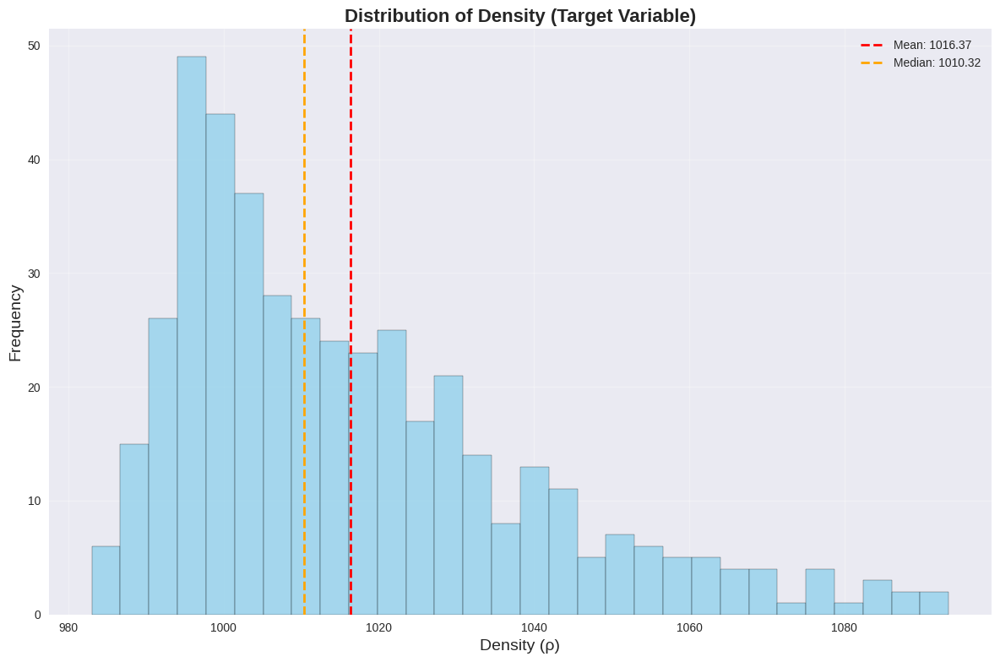

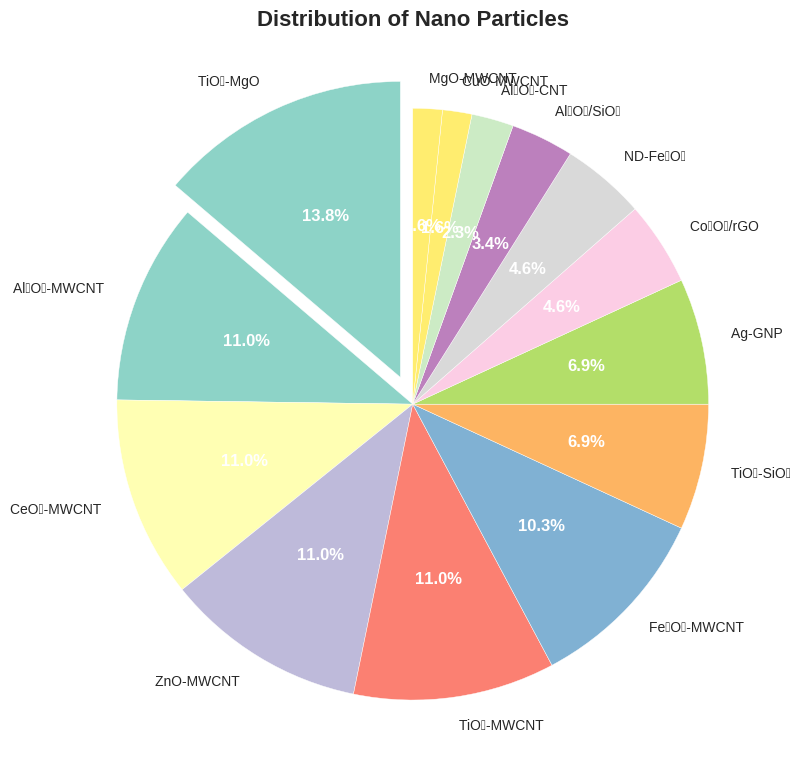

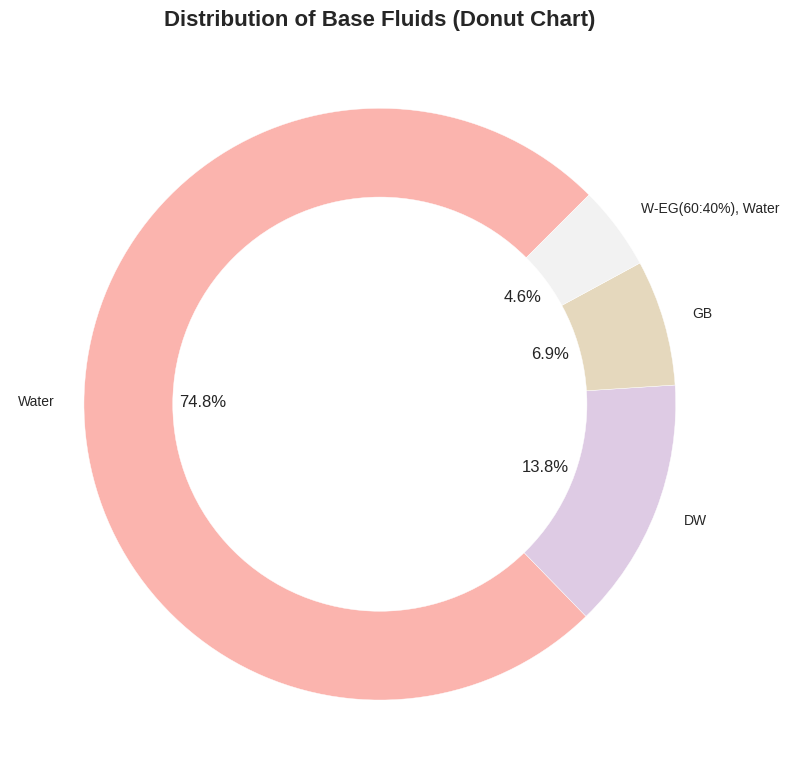

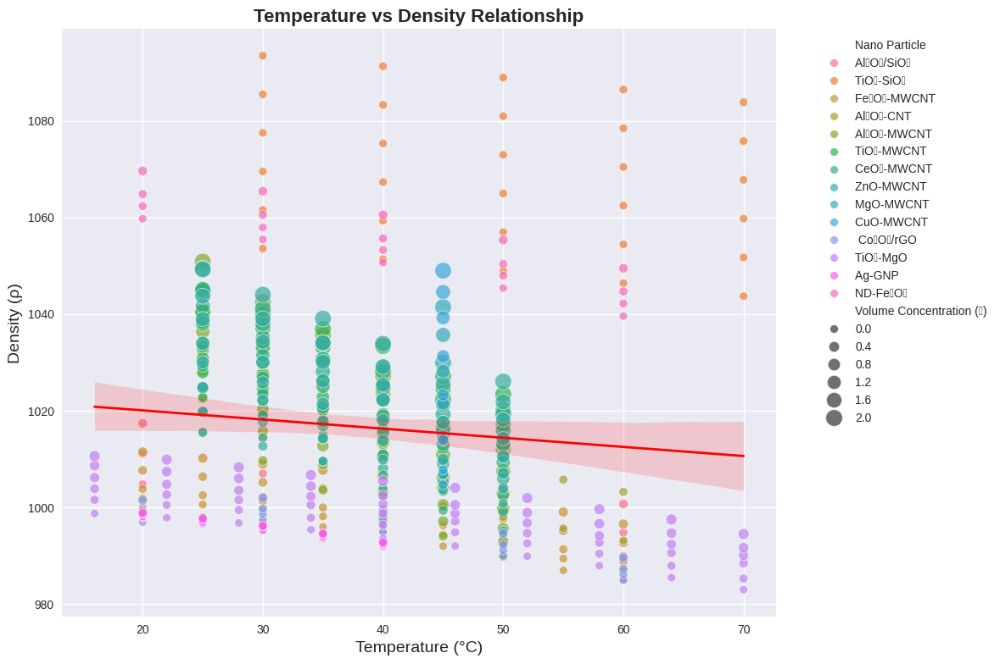

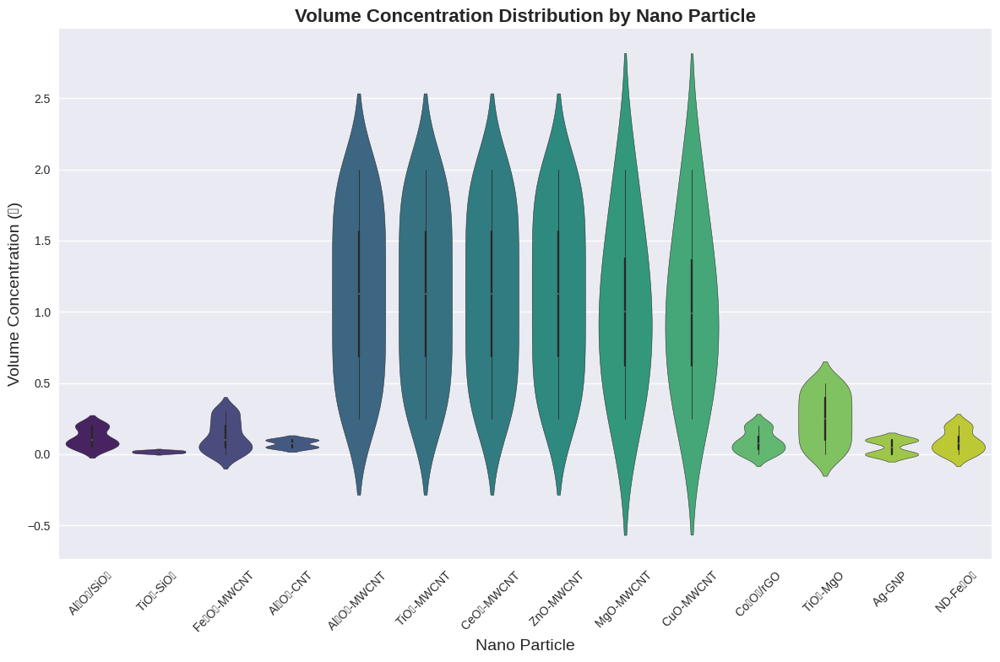

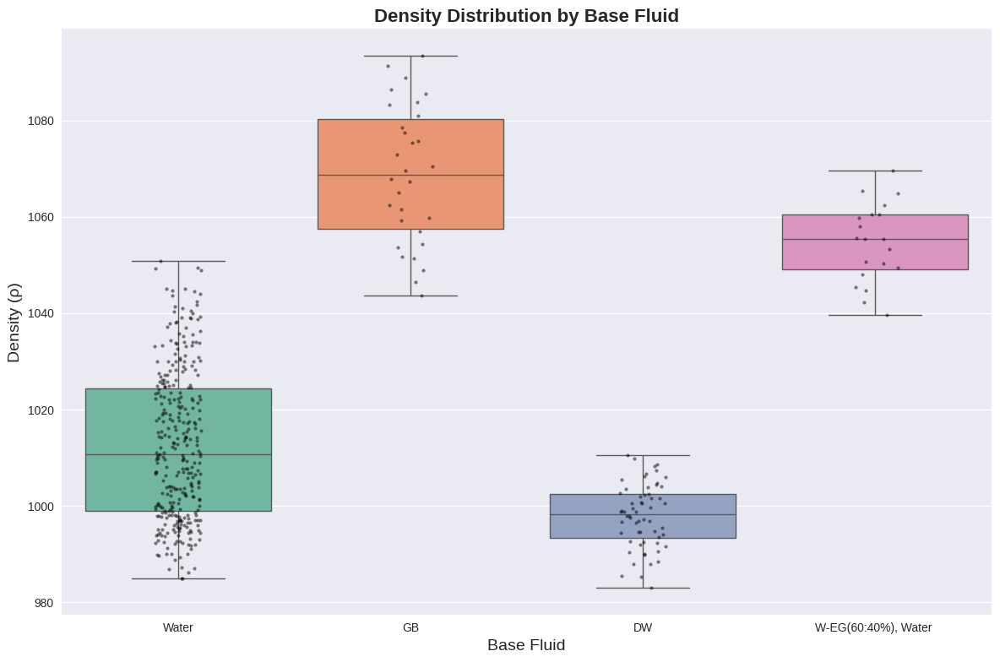

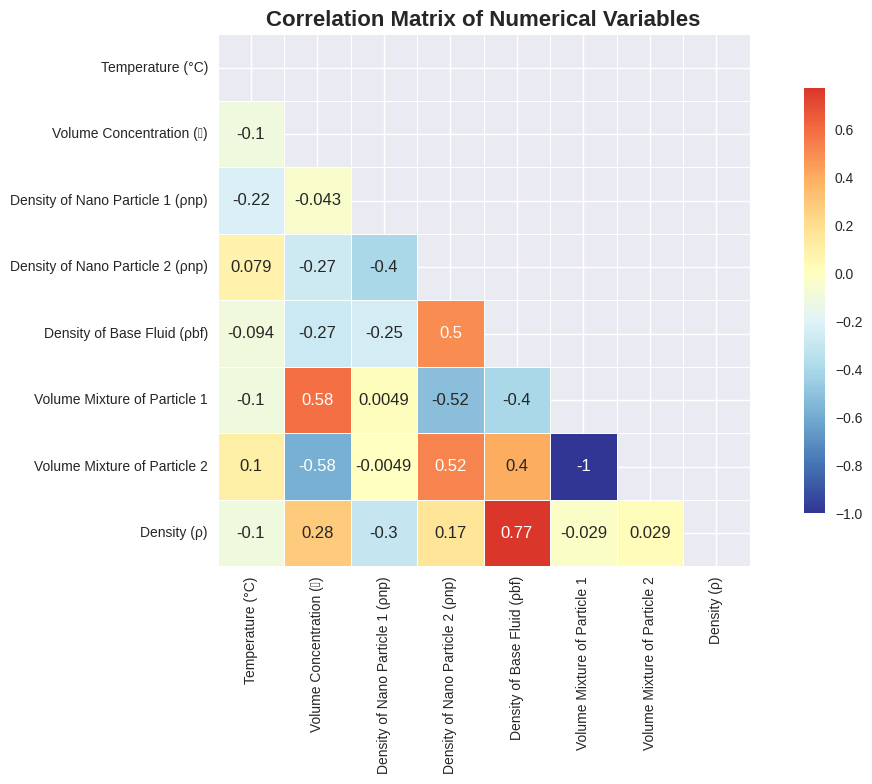

<Figure size 1200x800 with 0 Axes>

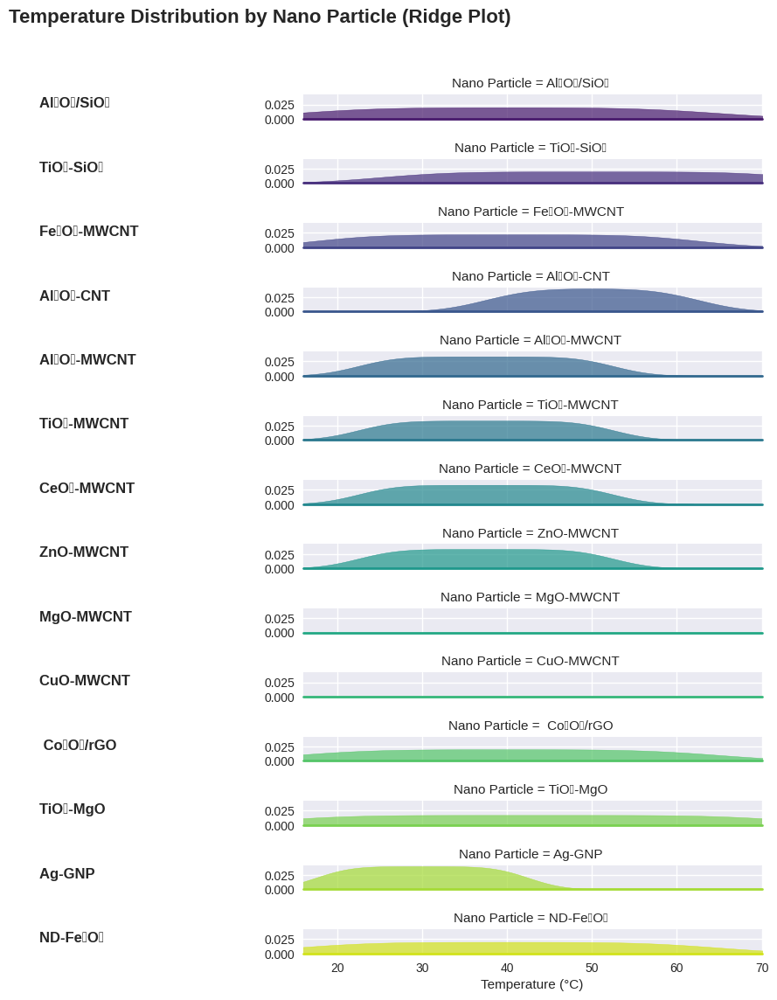

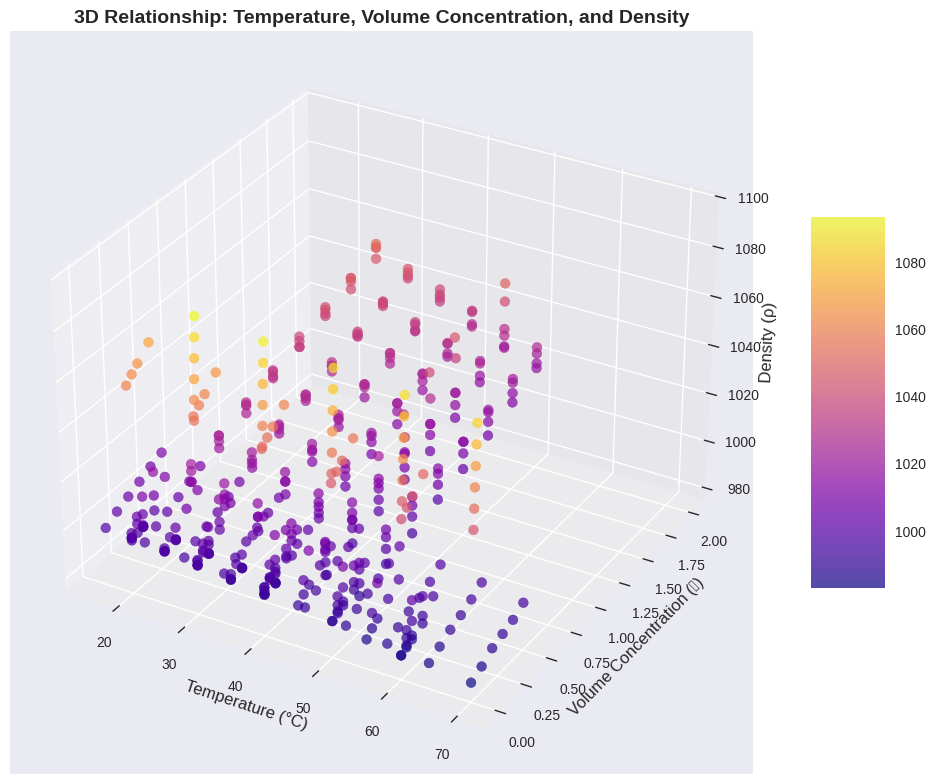

<Figure size 1200x800 with 0 Axes>

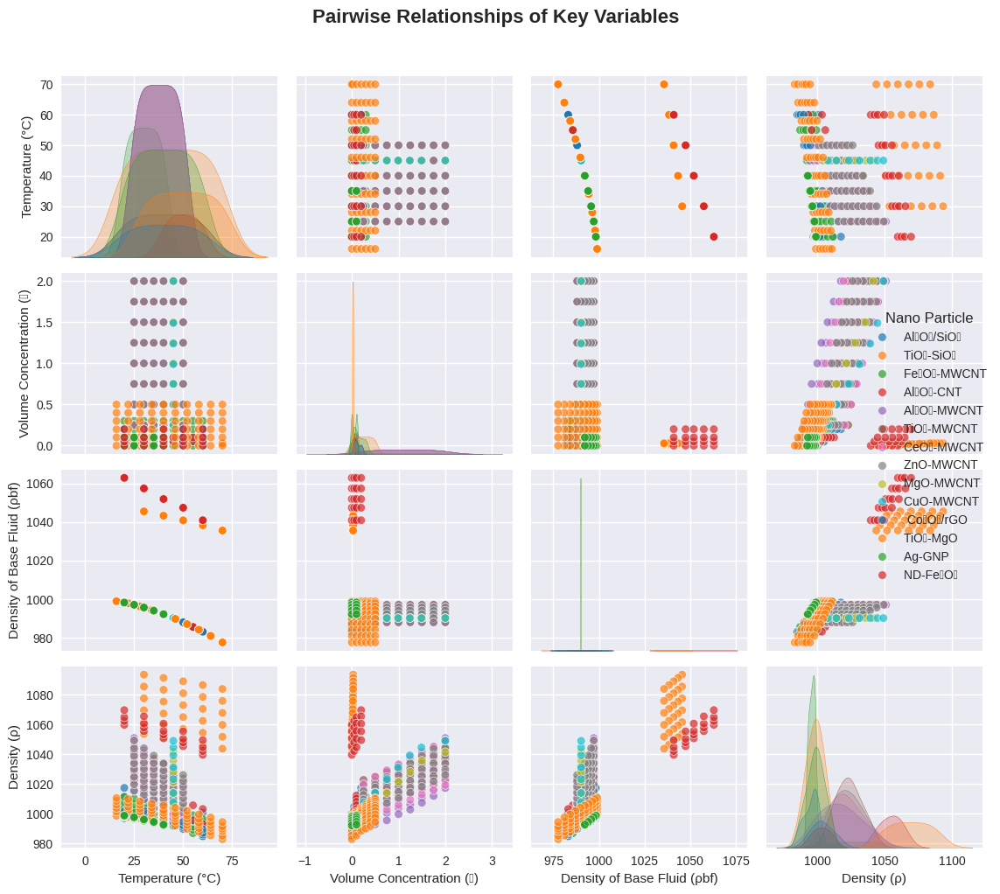

<Figure size 1200x800 with 0 Axes>

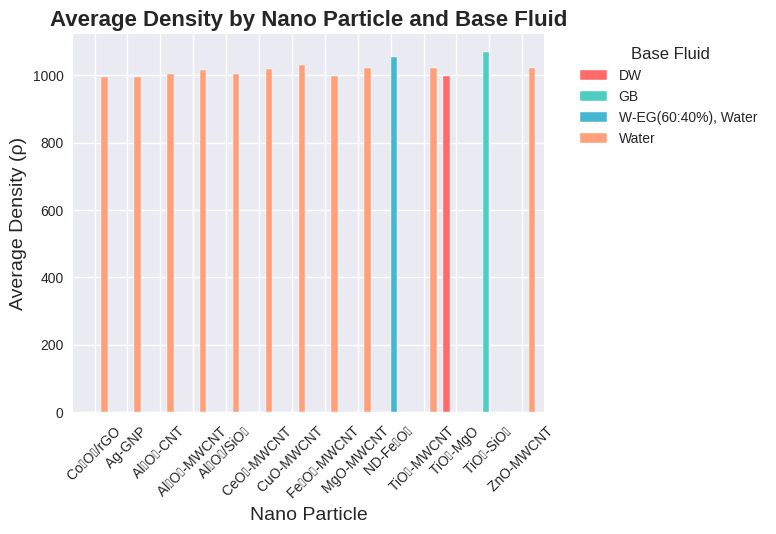

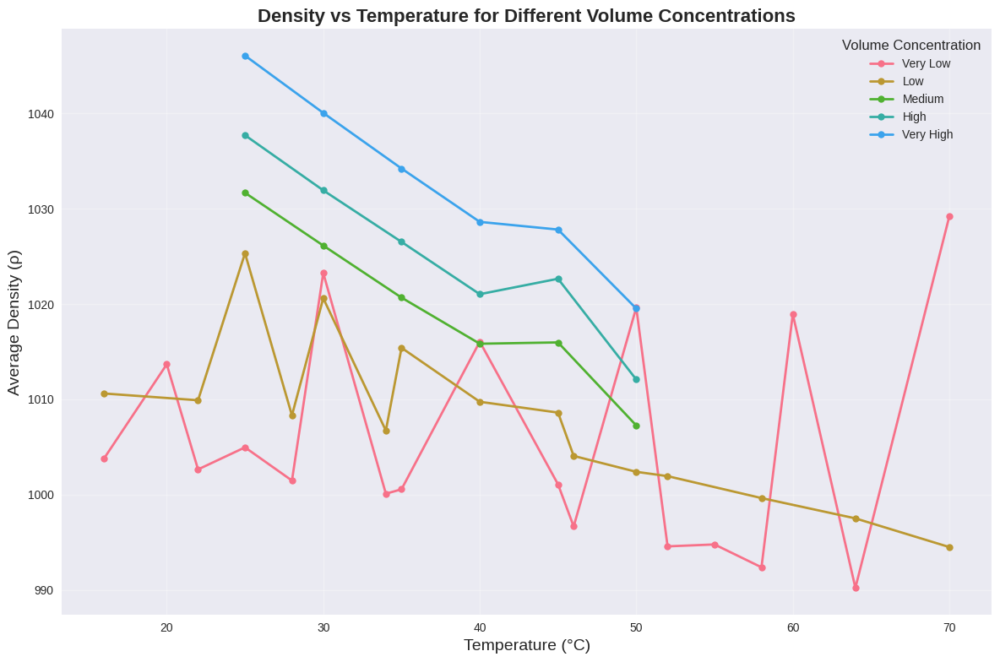

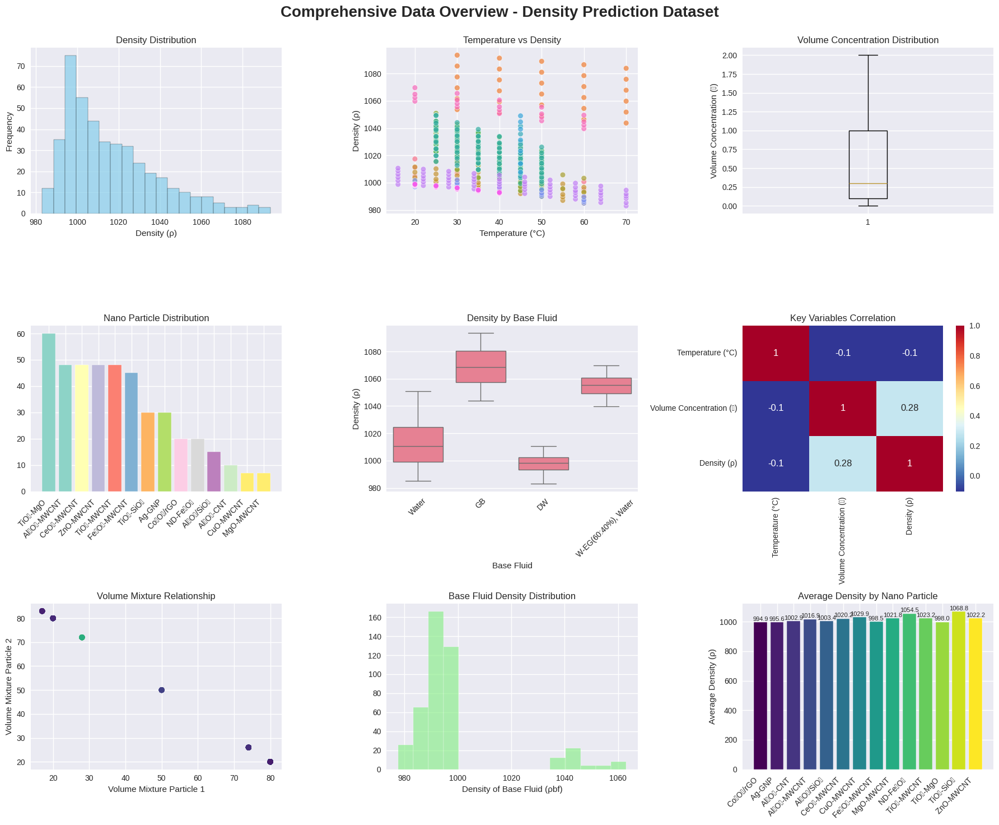

All visualizations completed!
Dataset shape: (436, 11)
Unique nano particles: 14
Unique base fluids: 4
Temperature range: 16°C - 70°C
Density range: 983.01 - 1093.43


In [ ]:
# Comprehensive Visualization for Density Prediction Dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set style and color palettes
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Assuming df is already loaded
# df = pd.read_csv('Density_Prediction_Dataset.csv')

# 1. Distribution of Target Variable (Density) - Histogram with KDE
plt.figure(figsize=(12, 8))
plt.hist(df['Density (ρ)'], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
plt.axvline(df['Density (ρ)'].mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {df["Density (ρ)"].mean():.2f}')
plt.axvline(df['Density (ρ)'].median(), color='orange', linestyle='--', linewidth=2, label=f'Median: {df["Density (ρ)"].median():.2f}')
plt.xlabel('Density (ρ)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Distribution of Density (Target Variable)', fontsize=16, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Nano Particle Distribution - Pie Chart
plt.figure(figsize=(12, 8))
particle_counts = df['Nano Particle'].value_counts()
colors = plt.cm.Set3(np.linspace(0, 1, len(particle_counts)))
wedges, texts, autotexts = plt.pie(particle_counts.values, labels=particle_counts.index,
                                  autopct='%1.1f%%', colors=colors, startangle=90,
                                  explode=[0.1 if i == 0 else 0 for i in range(len(particle_counts))])
plt.title('Distribution of Nano Particles', fontsize=16, fontweight='bold')
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')
plt.tight_layout()
plt.show()

# 3. Base Fluid Distribution - Donut Chart
plt.figure(figsize=(12, 8))
fluid_counts = df['Base Fluid'].value_counts()
colors = plt.cm.Pastel1(np.linspace(0, 1, len(fluid_counts)))
wedges, texts, autotexts = plt.pie(fluid_counts.values, labels=fluid_counts.index,
                                  autopct='%1.1f%%', colors=colors, startangle=45,
                                  wedgeprops=dict(width=0.5))
plt.title('Distribution of Base Fluids (Donut Chart)', fontsize=16, fontweight='bold')
centre_circle = plt.Circle((0,0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.tight_layout()
plt.show()

# 4. Temperature vs Density - Scatter Plot with Regression Line
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df, x='Temperature (°C)', y='Density (ρ)',
               hue='Nano Particle', size='Volume Concentration (ϕ)',
               sizes=(50, 200), alpha=0.7)
sns.regplot(data=df, x='Temperature (°C)', y='Density (ρ)',
           scatter=False, color='red', line_kws={'linewidth': 2})
plt.title('Temperature vs Density Relationship', fontsize=16, fontweight='bold')
plt.xlabel('Temperature (°C)', fontsize=14)
plt.ylabel('Density (ρ)', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 5. Volume Concentration Distribution - Violin Plot
plt.figure(figsize=(12, 8))
sns.violinplot(data=df, y='Volume Concentration (ϕ)', x='Nano Particle',
               palette='viridis', inner='box')
plt.title('Volume Concentration Distribution by Nano Particle', fontsize=16, fontweight='bold')
plt.xlabel('Nano Particle', fontsize=14)
plt.ylabel('Volume Concentration (ϕ)', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 6. Density by Base Fluid - Box Plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='Base Fluid', y='Density (ρ)', palette='Set2')
sns.stripplot(data=df, x='Base Fluid', y='Density (ρ)',
             color='black', alpha=0.5, size=3)
plt.title('Density Distribution by Base Fluid', fontsize=16, fontweight='bold')
plt.xlabel('Base Fluid', fontsize=14)
plt.ylabel('Density (ρ)', fontsize=14)
plt.tight_layout()
plt.show()

# 7. Correlation Heatmap
plt.figure(figsize=(12, 8))
numeric_cols = df.select_dtypes(include=[np.number]).columns
correlation_matrix = df[numeric_cols].corr()
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='RdYlBu_r',
           center=0, square=True, linewidths=0.5, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix of Numerical Variables', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# 8. Temperature Distribution by Nano Particle - Ridge Plot (using FacetGrid)
plt.figure(figsize=(12, 8))
g = sns.FacetGrid(df, row='Nano Particle', hue='Nano Particle',
                  aspect=15, height=0.8, palette='viridis')
g.map(sns.kdeplot, 'Temperature (°C)', fill=True, alpha=0.7)
g.map(plt.axhline, y=0, lw=2, clip_on=False)
g.set(xlim=(df['Temperature (°C)'].min(), df['Temperature (°C)'].max()))
for i, ax in enumerate(g.axes.flat):
    ax.text(-15, 0.02, df['Nano Particle'].unique()[i],
            fontweight='bold', fontsize=12)
g.set_axis_labels('Temperature (°C)', '')
plt.suptitle('Temperature Distribution by Nano Particle (Ridge Plot)',
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# 9. 3D Scatter Plot - Temperature, Volume Concentration, and Density
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df['Temperature (°C)'], df['Volume Concentration (ϕ)'],
                    df['Density (ρ)'], c=df['Density (ρ)'], cmap='plasma',
                    s=50, alpha=0.7)
ax.set_xlabel('Temperature (°C)', fontsize=12)
ax.set_ylabel('Volume Concentration (ϕ)', fontsize=12)
ax.set_zlabel('Density (ρ)', fontsize=12)
ax.set_title('3D Relationship: Temperature, Volume Concentration, and Density',
             fontsize=14, fontweight='bold')
plt.colorbar(scatter, shrink=0.5, aspect=5)
plt.tight_layout()
plt.show()

# 10. Pair Plot for Key Variables
plt.figure(figsize=(12, 8))
key_vars = ['Temperature (°C)', 'Volume Concentration (ϕ)',
           'Density of Base Fluid (ρbf)', 'Density (ρ)']
sns.pairplot(df[key_vars + ['Nano Particle']], hue='Nano Particle',
            palette='tab10', diag_kind='kde', plot_kws={'alpha': 0.7})
plt.suptitle('Pairwise Relationships of Key Variables', fontsize=16,
             fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# 11. Bar Chart - Average Density by Nano Particle and Base Fluid
plt.figure(figsize=(12, 8))
avg_density = df.groupby(['Nano Particle', 'Base Fluid'])['Density (ρ)'].mean().reset_index()
pivot_data = avg_density.pivot(index='Nano Particle', columns='Base Fluid', values='Density (ρ)')
ax = pivot_data.plot(kind='bar', width=0.8, color=['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A'])
plt.title('Average Density by Nano Particle and Base Fluid', fontsize=16, fontweight='bold')
plt.xlabel('Nano Particle', fontsize=14)
plt.ylabel('Average Density (ρ)', fontsize=14)
plt.legend(title='Base Fluid', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 12. Line Plot - Density vs Temperature for Different Volume Concentrations
plt.figure(figsize=(12, 8))
# Create concentration bins for better visualization
df['Conc_Bin'] = pd.cut(df['Volume Concentration (ϕ)'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
for conc in df['Conc_Bin'].unique():
    if pd.notna(conc):
        subset = df[df['Conc_Bin'] == conc]
        temp_density = subset.groupby('Temperature (°C)')['Density (ρ)'].mean().reset_index()
        plt.plot(temp_density['Temperature (°C)'], temp_density['Density (ρ)'],
                marker='o', linewidth=2, label=conc, markersize=6)
plt.title('Density vs Temperature for Different Volume Concentrations', fontsize=16, fontweight='bold')
plt.xlabel('Temperature (°C)', fontsize=14)
plt.ylabel('Average Density (ρ)', fontsize=14)
plt.legend(title='Volume Concentration')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# FINAL: Comprehensive Subplot Overview
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
fig.suptitle('Comprehensive Data Overview - Density Prediction Dataset',
             fontsize=20, fontweight='bold', y=0.98)

# Subplot 1: Density Distribution
axes[0,0].hist(df['Density (ρ)'], bins=20, alpha=0.7, color='skyblue', edgecolor='black')
axes[0,0].set_title('Density Distribution')
axes[0,0].set_xlabel('Density (ρ)')
axes[0,0].set_ylabel('Frequency')

# Subplot 2: Temperature vs Density
sns.scatterplot(data=df, x='Temperature (°C)', y='Density (ρ)',
               hue='Nano Particle', ax=axes[0,1], alpha=0.7)
axes[0,1].set_title('Temperature vs Density')
axes[0,1].legend().remove()

# Subplot 3: Volume Concentration Distribution
axes[0,2].boxplot(df['Volume Concentration (ϕ)'])
axes[0,2].set_title('Volume Concentration Distribution')
axes[0,2].set_ylabel('Volume Concentration (ϕ)')

# Subplot 4: Nano Particle Counts
particle_counts = df['Nano Particle'].value_counts()
axes[1,0].bar(range(len(particle_counts)), particle_counts.values,
             color=plt.cm.Set3(np.linspace(0, 1, len(particle_counts))))
axes[1,0].set_title('Nano Particle Distribution')
axes[1,0].set_xticks(range(len(particle_counts)))
axes[1,0].set_xticklabels(particle_counts.index, rotation=45, ha='right')

# Subplot 5: Base Fluid vs Density
sns.boxplot(data=df, x='Base Fluid', y='Density (ρ)', ax=axes[1,1])
axes[1,1].set_title('Density by Base Fluid')
axes[1,1].tick_params(axis='x', rotation=45)

# Subplot 6: Correlation heatmap (subset)
key_numeric = ['Temperature (°C)', 'Volume Concentration (ϕ)', 'Density (ρ)']
corr_subset = df[key_numeric].corr()
sns.heatmap(corr_subset, annot=True, cmap='RdYlBu_r', ax=axes[1,2])
axes[1,2].set_title('Key Variables Correlation')

# Subplot 7: Volume Mixture Distribution
axes[2,0].scatter(df['Volume Mixture of Particle 1'], df['Volume Mixture of Particle 2'],
                 c=df['Density (ρ)'], cmap='viridis', alpha=0.7)
axes[2,0].set_title('Volume Mixture Relationship')
axes[2,0].set_xlabel('Volume Mixture Particle 1')
axes[2,0].set_ylabel('Volume Mixture Particle 2')

# Subplot 8: Density of Base Fluid Distribution
axes[2,1].hist(df['Density of Base Fluid (ρbf)'], bins=15, alpha=0.7, color='lightgreen')
axes[2,1].set_title('Base Fluid Density Distribution')
axes[2,1].set_xlabel('Density of Base Fluid (ρbf)')

# Subplot 9: Average density by particle type
avg_by_particle = df.groupby('Nano Particle')['Density (ρ)'].mean()
bars = axes[2,2].bar(range(len(avg_by_particle)), avg_by_particle.values,
                    color=plt.cm.viridis(np.linspace(0, 1, len(avg_by_particle))))
axes[2,2].set_title('Average Density by Nano Particle')
axes[2,2].set_xticks(range(len(avg_by_particle)))
axes[2,2].set_xticklabels(avg_by_particle.index, rotation=45, ha='right')
axes[2,2].set_ylabel('Average Density (ρ)')

# Add value labels on bars
for i, bar in enumerate(bars):
    height = bar.get_height()
    axes[2,2].text(bar.get_x() + bar.get_width()/2., height + 1,
                  f'{height:.1f}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.show()

print("All visualizations completed!")
print(f"Dataset shape: {df.shape}")
print(f"Unique nano particles: {df['Nano Particle'].nunique()}")
print(f"Unique base fluids: {df['Base Fluid'].nunique()}")
print(f"Temperature range: {df['Temperature (°C)'].min()}°C - {df['Temperature (°C)'].max()}°C")
print(f"Density range: {df['Density (ρ)'].min():.2f} - {df['Density (ρ)'].max():.2f}")


5. CATEGORICAL VARIABLE ANALYSIS
-----------------------------------
Analysis by Nano Particle:
               count      mean     std       min       max
Nano Particle                                             
 Co₃O₄/rGO        20   994.904   5.167   985.000  1002.000
Ag-GNP            30   995.564   2.198   991.880   998.910
Al₂O₃-CNT         10  1002.908   6.276   993.189  1012.278
Al₂O₃-MWCNT       48  1016.905  14.999   989.905  1050.857
Al₂O₃/SiO₂        15  1003.383   7.749   990.000  1017.407
CeO₂-MWCNT        48  1020.242  12.869   995.143  1049.410
CuO-MWCNT          7  1029.873  15.568  1007.785  1048.987
Fe₃O₄-MWCNT       45   998.545   6.516   985.000  1011.500
MgO-MWCNT          7  1021.772  14.119  1004.684  1041.456
ND-Fe₃O₄          20  1054.547   8.220  1039.601  1069.601
TiO₂-MWCNT        48  1023.178   9.711  1003.540  1044.659
TiO₂-MgO          60   997.985   6.548   983.010  1010.620
TiO₂-SiO₂         30  1068.786  14.325  1043.702  1093.432
ZnO-MWCNT         

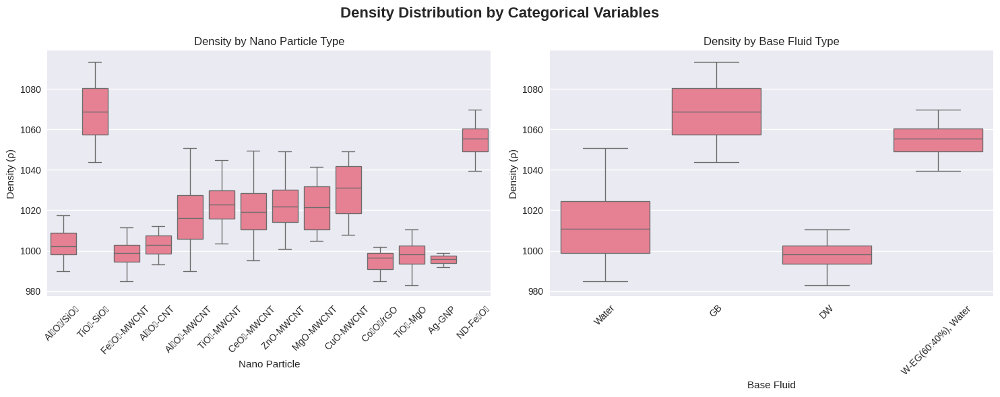

In [ ]:
print(f"\n5. CATEGORICAL VARIABLE ANALYSIS")
print("-" * 35)

# Analysis by Nano Particle type
print("Analysis by Nano Particle:")
nano_particle_stats = df.groupby('Nano Particle')['Density (ρ)'].agg([
    'count', 'mean', 'std', 'min', 'max'
]).round(3)
print(nano_particle_stats)

# Analysis by Base Fluid
print("\nAnalysis by Base Fluid:")
base_fluid_stats = df.groupby('Base Fluid')['Density (ρ)'].agg([
    'count', 'mean', 'std', 'min', 'max'
]).round(3)
print(base_fluid_stats)

# Box plots for categorical variables
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Density Distribution by Categorical Variables', fontsize=16, fontweight='bold')

# Box plot by Nano Particle
sns.boxplot(data=df, x='Nano Particle', y='Density (ρ)', ax=axes[0])
axes[0].set_title('Density by Nano Particle Type')
axes[0].tick_params(axis='x', rotation=45)

# Box plot by Base Fluid
sns.boxplot(data=df, x='Base Fluid', y='Density (ρ)', ax=axes[1])
axes[1].set_title('Density by Base Fluid Type')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Analysis by Nano Particle:
               count      mean     std       min       max
Nano Particle                                             
 Co₃O₄/rGO        20   994.904   5.167   985.000  1002.000
Ag-GNP            30   995.564   2.198   991.880   998.910
Al₂O₃-CNT         10  1002.908   6.276   993.189  1012.278
Al₂O₃-MWCNT       48  1016.905  14.999   989.905  1050.857
Al₂O₃/SiO₂        15  1003.383   7.749   990.000  1017.407
CeO₂-MWCNT        48  1020.242  12.869   995.143  1049.410
CuO-MWCNT          7  1029.873  15.568  1007.785  1048.987
Fe₃O₄-MWCNT       45   998.545   6.516   985.000  1011.500
MgO-MWCNT          7  1021.772  14.119  1004.684  1041.456
ND-Fe₃O₄          20  1054.547   8.220  1039.601  1069.601
TiO₂-MWCNT        48  1023.178   9.711  1003.540  1044.659
TiO₂-MgO          60   997.985   6.548   983.010  1010.620
TiO₂-SiO₂         30  1068.786  14.325  1043.702  1093.432
ZnO-MWCNT         48  1022.211  11.638  1000.812  1049.236

Analysis by Base Fluid:
    

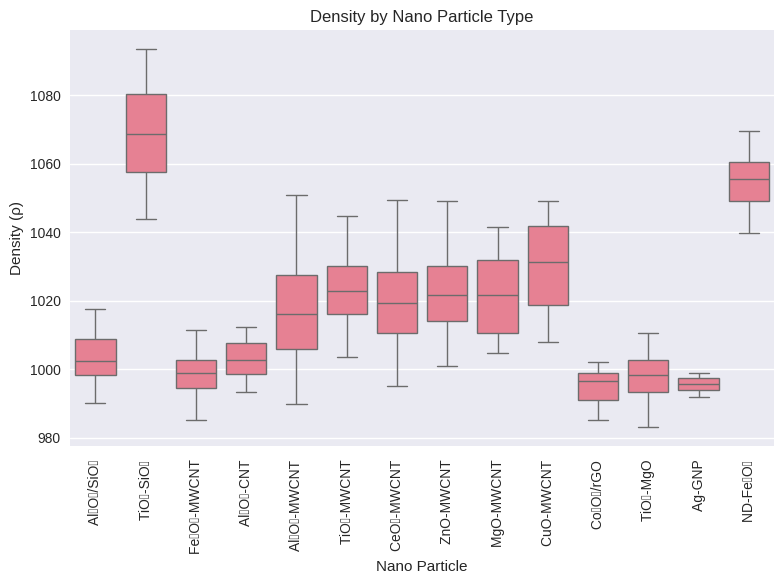

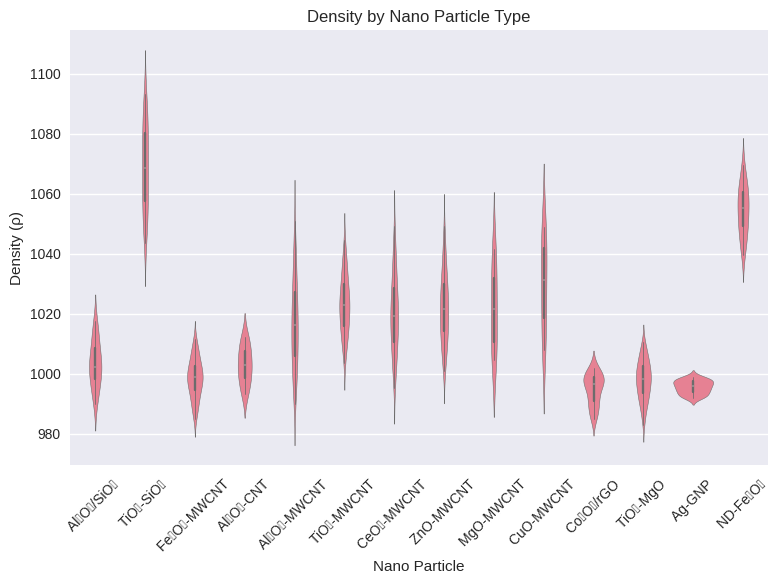

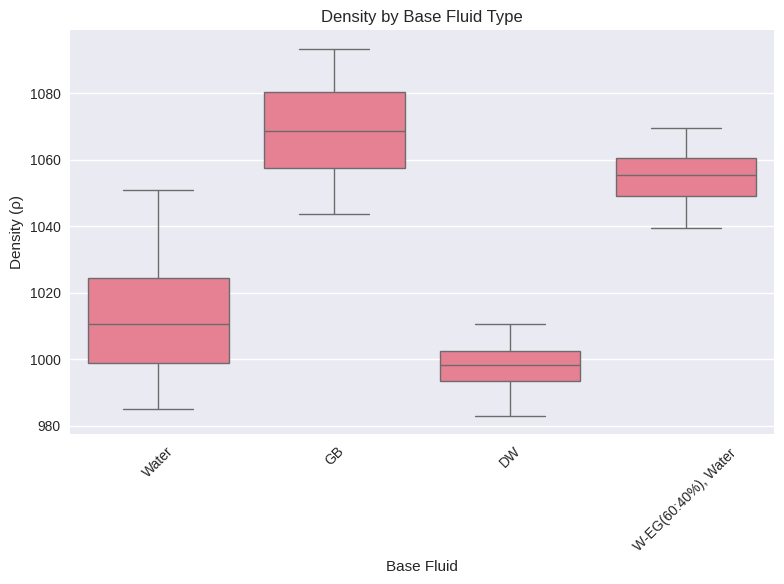

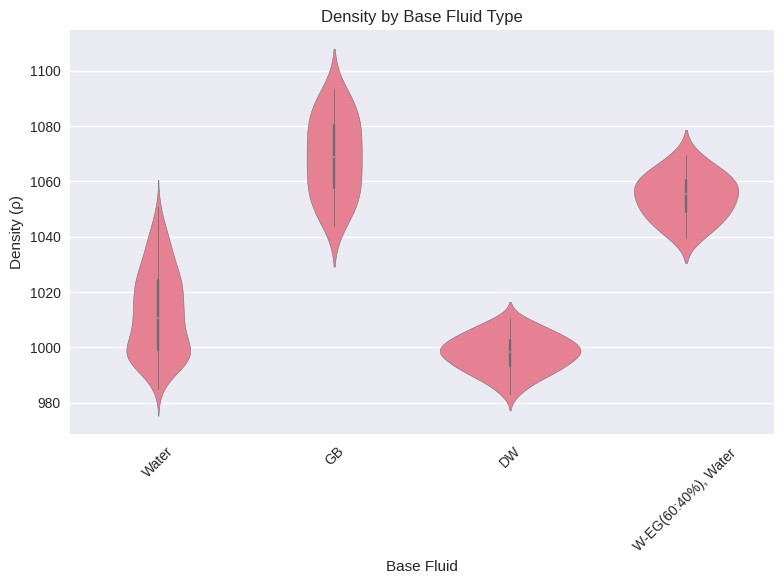

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Analysis by Nano Particle
print("Analysis by Nano Particle:")
nano_particle_stats = df.groupby('Nano Particle')['Density (ρ)'].agg(['count', 'mean', 'std', 'min', 'max']).round(3)
print(nano_particle_stats)

# Analysis by Base Fluid
print("\nAnalysis by Base Fluid:")
base_fluid_stats = df.groupby('Base Fluid')['Density (ρ)'].agg(['count', 'mean', 'std', 'min', 'max']).round(3)
print(base_fluid_stats)

# Plotting Density by Nano Particle - Boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='Nano Particle', y='Density (ρ)')
plt.title('Density by Nano Particle Type')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Plotting Density by Nano Particle - Violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(data=df, x='Nano Particle', y='Density (ρ)')
plt.title('Density by Nano Particle Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plotting Density by Base Fluid - Boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='Base Fluid', y='Density (ρ)')
plt.title('Density by Base Fluid Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plotting Density by Base Fluid - Violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(data=df, x='Base Fluid', y='Density (ρ)')
plt.title('Density by Base Fluid Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


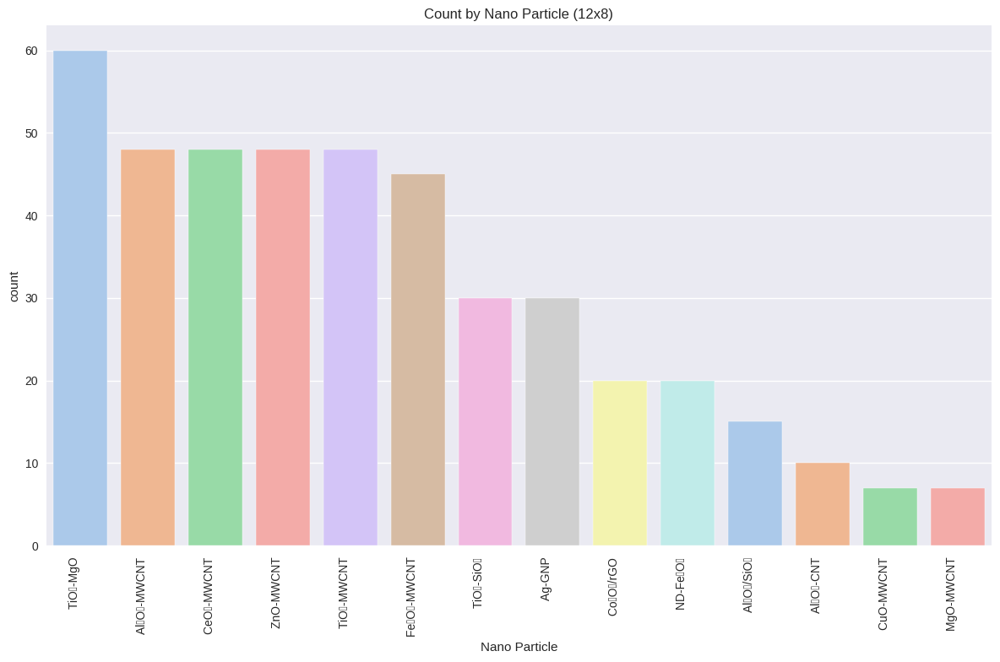

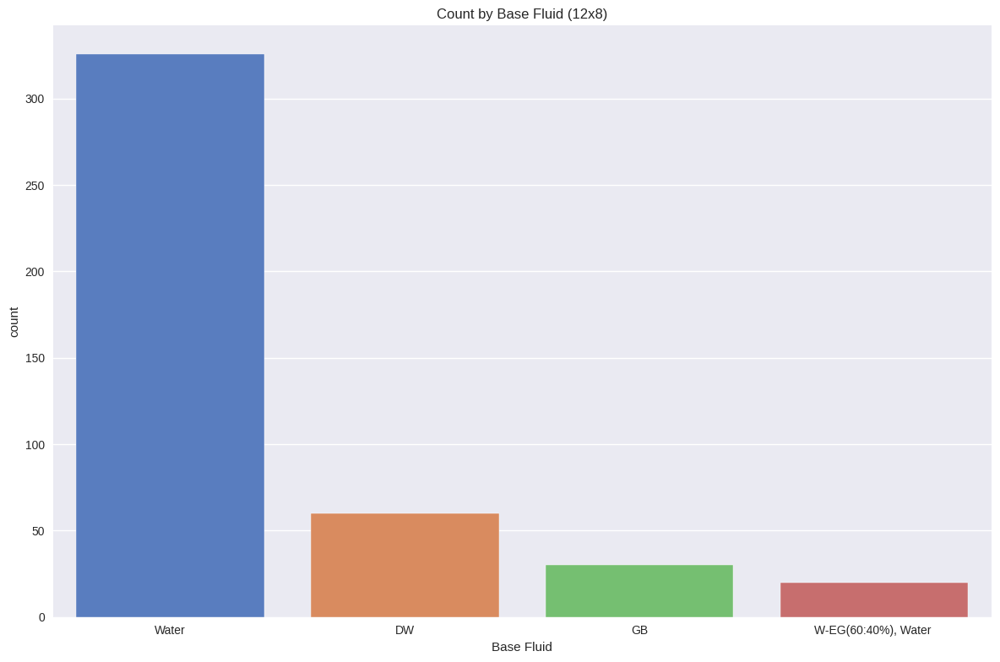

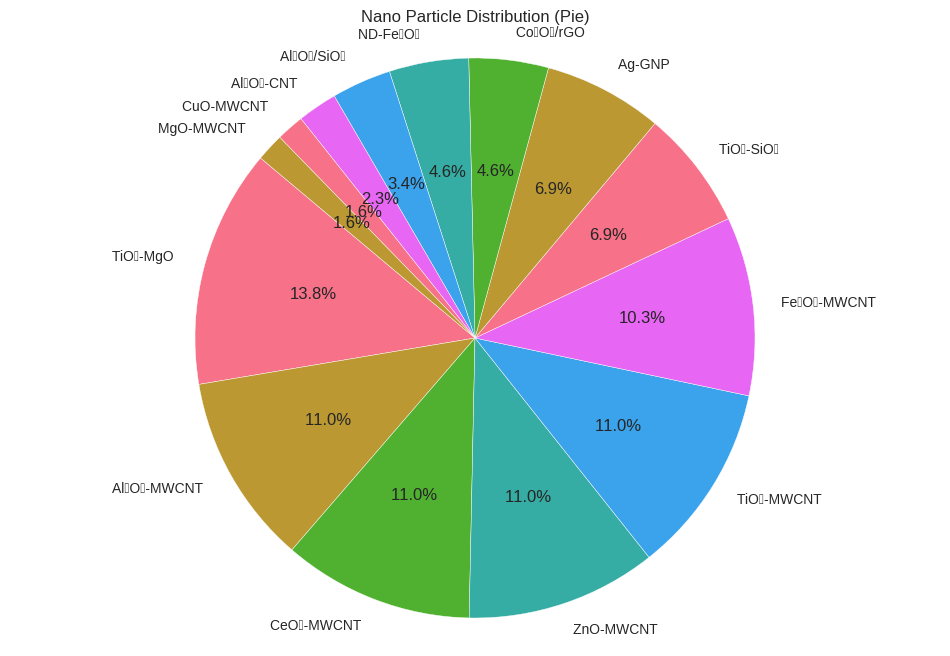

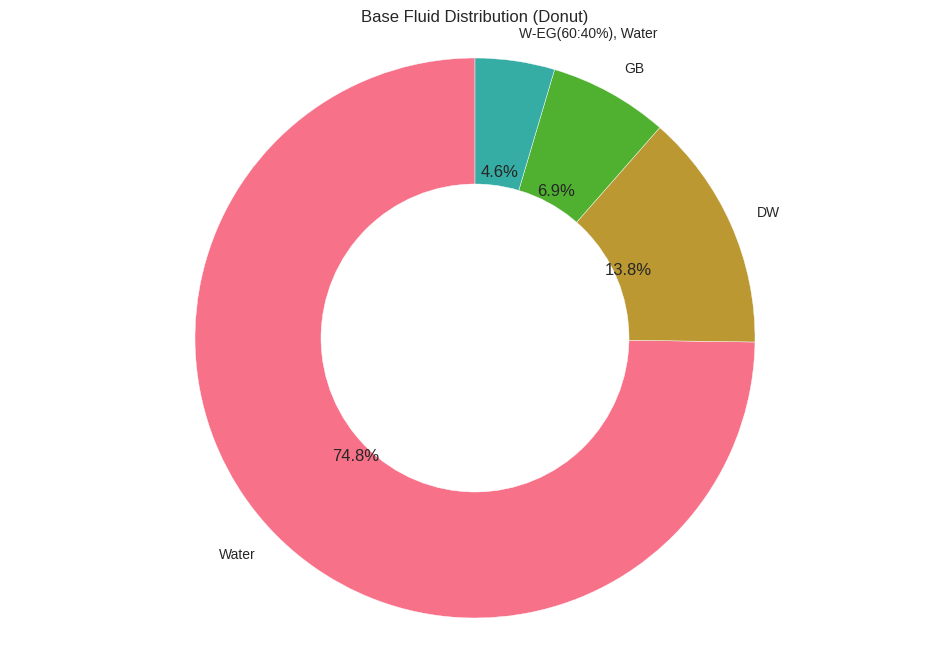

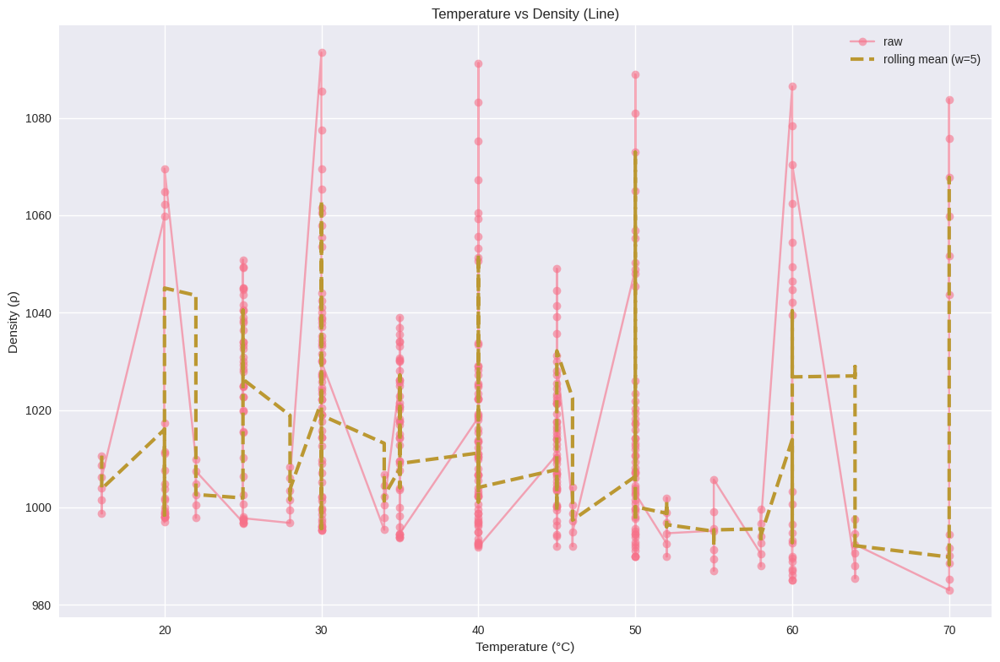

...

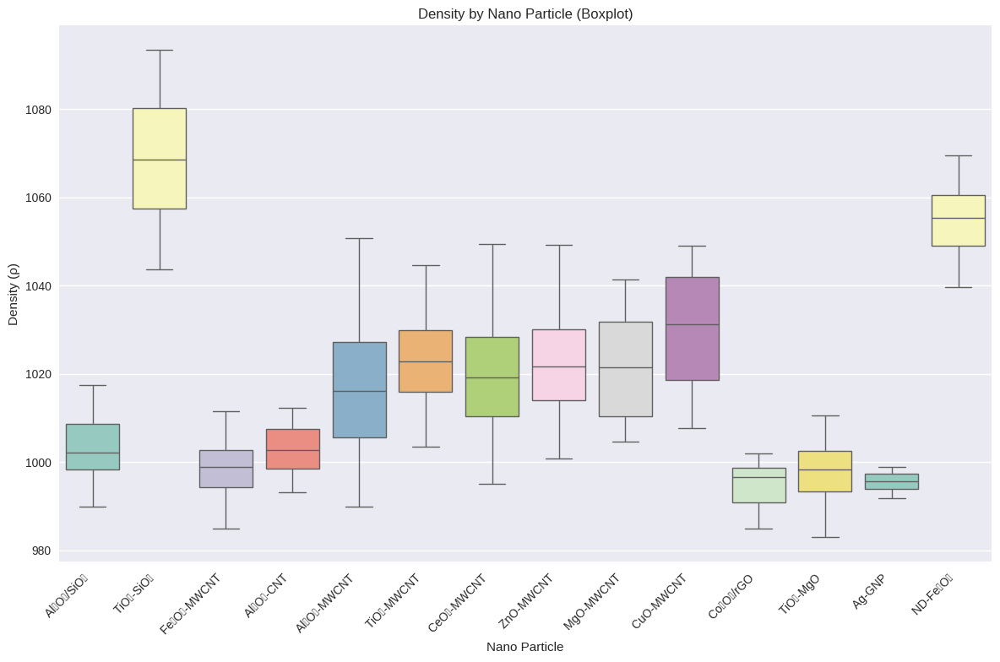

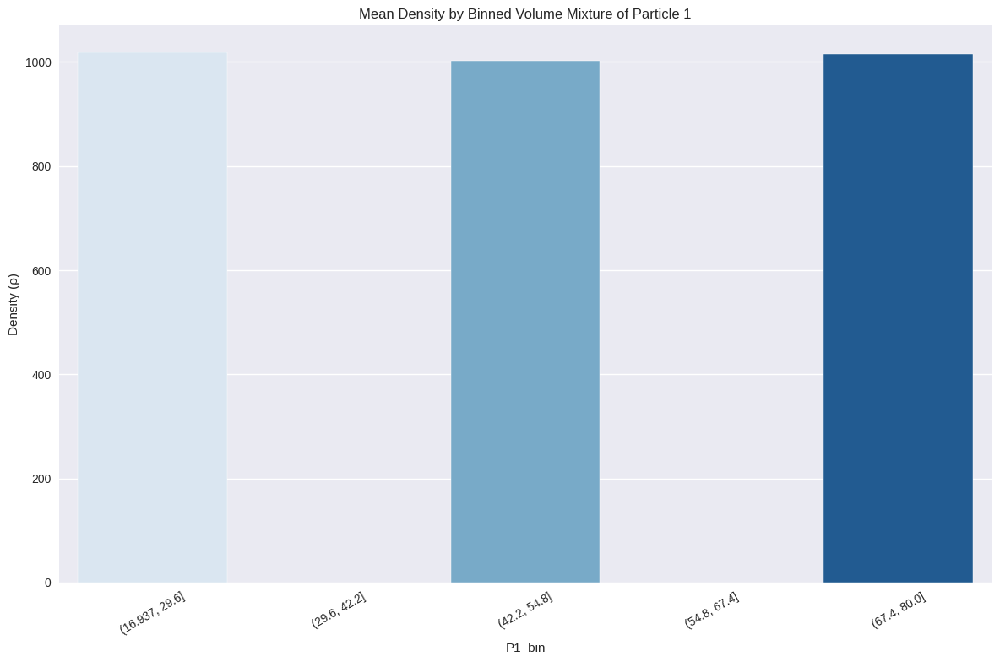

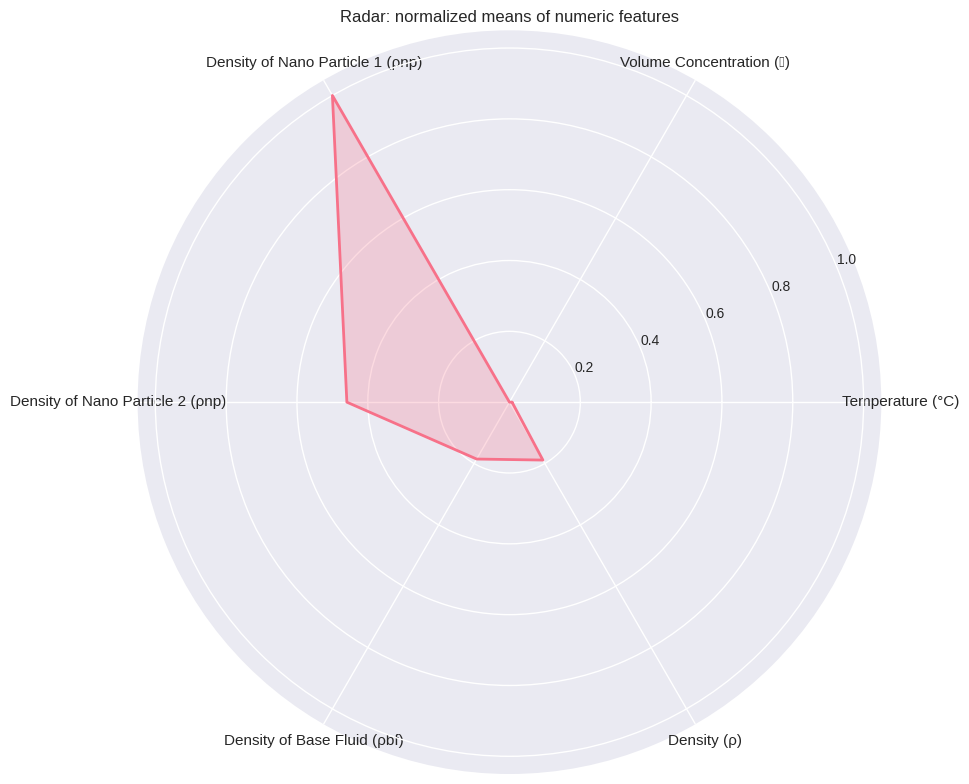

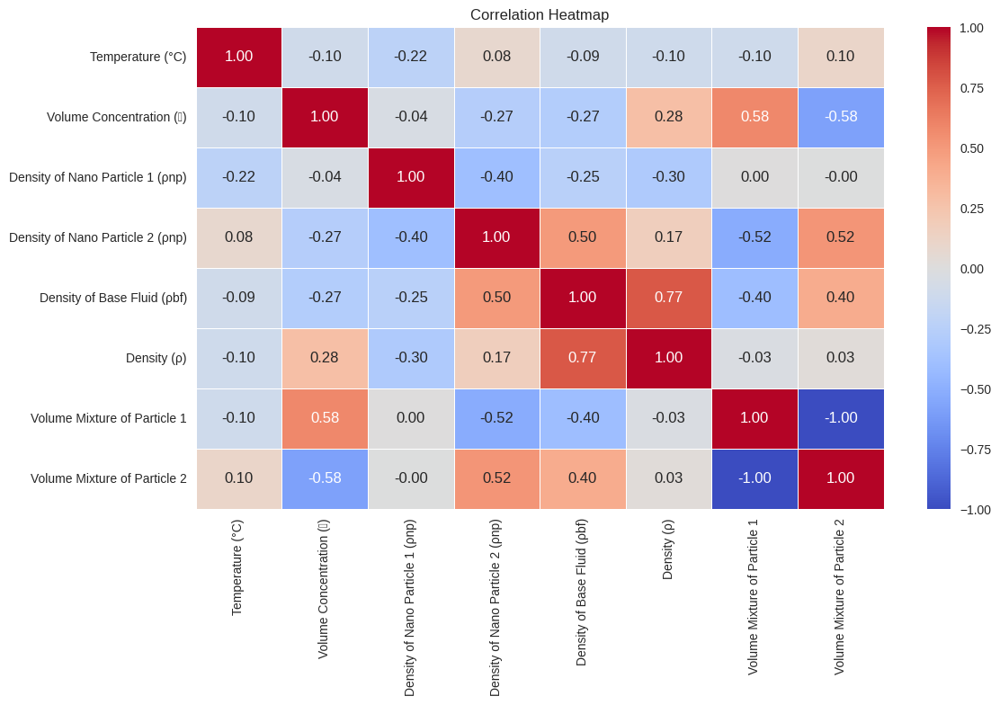

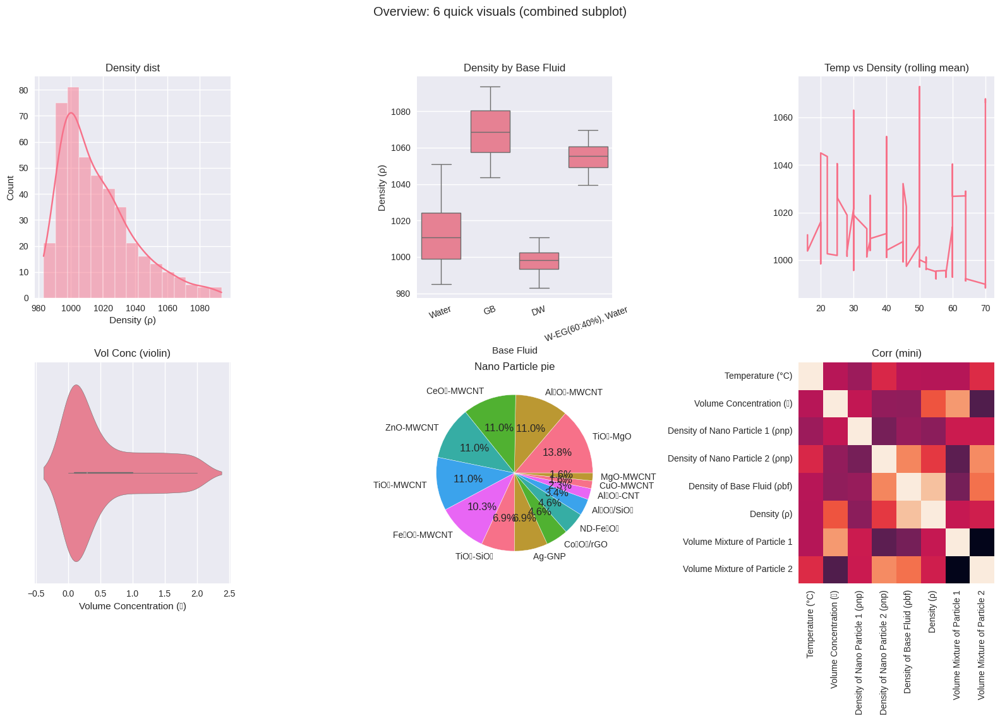

All plots generated. Tweak SAVE variable to save figures to disk.


In [ ]:
# density_visualizations.py
# A collection of standalone matplotlib / seaborn plots for the provided
# Density Prediction dataset. Each plot is drawn on its own figure (no subplots)
# with figsize=(12, 8). At the end a combined subplot overview is produced.
#
# Usage:
#  - Place this file in the same folder as 'Density_Prediction_Dataset.csv'
#  - Run (e.g. `python density_visualizations.py`) or open in a notebook and run
#
# Requirements: pandas, numpy, matplotlib, seaborn

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# --- Load dataset ---
file_path = 'Density_Prediction_Dataset.csv'
df = pd.read_csv(file_path)

# A small helper to set figure size consistently
FIGSIZE = (12, 8)

# Create an output helper to save figures if wanted
SAVE = False  # set True to save each figure to disk
OUTDIR = 'plots'

import os
if SAVE and not os.path.exists(OUTDIR):
    os.makedirs(OUTDIR)

# --- Plot 1: Count bar for 'Nano Particle' (categorical) ---
plt.figure(figsize=FIGSIZE)
sns.countplot(data=df, x='Nano Particle', order=df['Nano Particle'].value_counts().index, palette='pastel')
plt.xticks(rotation=90, ha='right')
plt.title('Count by Nano Particle (12x8)')
plt.tight_layout()
if SAVE: plt.savefig(os.path.join(OUTDIR, 'count_nano_particle.png'))
plt.show()

# --- Plot 2: Count bar for 'Base Fluid' (categorical) with another palette ---
plt.figure(figsize=FIGSIZE)
sns.countplot(data=df, x='Base Fluid', order=df['Base Fluid'].value_counts().index, palette='muted')
plt.xticks(rotation=0)
plt.title('Count by Base Fluid (12x8)')
plt.tight_layout()
if SAVE: plt.savefig(os.path.join(OUTDIR, 'count_base_fluid.png'))
plt.show()

# --- Plot 3: Pie chart for 'Nano Particle' distribution ---
plt.figure(figsize=FIGSIZE)
counts = df['Nano Particle'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Nano Particle Distribution (Pie)')
plt.axis('equal')
if SAVE: plt.savefig(os.path.join(OUTDIR, 'pie_nano_particle.png'))
plt.show()

# --- Plot 4: Donut chart for 'Base Fluid' ---
plt.figure(figsize=FIGSIZE)
counts = df['Base Fluid'].value_counts()
wedges, texts, autotexts = plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90)
# draw circle for donut
centre_circle = plt.Circle((0,0),0.55,fc='white')
plt.gca().add_artist(centre_circle)
plt.title('Base Fluid Distribution (Donut)')
plt.axis('equal')
if SAVE: plt.savefig(os.path.join(OUTDIR, 'donut_base_fluid.png'))
plt.show()

# --- Plot 5: Line plot Temperature vs Density (use moving average to show trend) ---
plt.figure(figsize=FIGSIZE)
# sort by Temperature for a clearer line
tmp = df.sort_values('Temperature (°C)')
plt.plot(tmp['Temperature (°C)'], tmp['Density (ρ)'], marker='o', linestyle='-', alpha=0.6, label='raw')
# moving average
ma = tmp['Density (ρ)'].rolling(window=5, min_periods=1).mean()
plt.plot(tmp['Temperature (°C)'], ma, linestyle='--', linewidth=3, label='rolling mean (w=5)')
plt.xlabel('Temperature (°C)')
plt.ylabel('Density (ρ)')
plt.title('Temperature vs Density (Line)')
plt.legend()
plt.tight_layout()
if SAVE: plt.savefig(os.path.join(OUTDIR, 'line_temp_density.png'))
plt.show()

# --- Plot 6: Scatter plot Temperature vs Density with hue as Base Fluid ---
plt.figure(figsize=FIGSIZE)
sns.scatterplot(data=df, x='Temperature (°C)', y='Density (ρ)', hue='Base Fluid', palette='deep', s=80)
plt.title('Temperature vs Density by Base Fluid (Scatter)')
plt.tight_layout()
if SAVE: plt.savefig(os.path.join(OUTDIR, 'scatter_temp_density_basefluid.png'))
plt.show()

# --- Plot 7: Violin plots for continuous features (single column per figure) ---
cont_cols = [
    'Temperature (°C)', 'Volume Concentration (ϕ)', 'Density of Nano Particle 1 (ρnp)',
    'Density of Nano Particle 2 (ρnp)', 'Density of Base Fluid (ρbf)', 'Volume Mixture of Particle 1',
    'Volume Mixture of Particle 2', 'Density (ρ)'
]

for col, pal in zip(cont_cols, ['viridis', 'rocket', 'mako', 'flare', 'crest', 'coolwarm', 'icefire', 'Spectral']):
    plt.figure(figsize=FIGSIZE)
    sns.violinplot(data=df, x=col, inner='quartile', palette=pal)
    plt.title(f'Violin plot of {col}')
    plt.tight_layout()
    if SAVE: plt.savefig(os.path.join(OUTDIR, f'violin_{col.replace(" ","_")}.png'))
    plt.show()

# --- Plot 8: KDE + Rug + Swarm to mimic a 'raincloud' style (Temperature) ---
plt.figure(figsize=FIGSIZE)
# KDE
sns.kdeplot(data=df, x='Temperature (°C)', fill=True, alpha=0.5)
# swarm / strip
sns.stripplot(data=df, x='Temperature (°C)', jitter=0.25, alpha=0.5)
plt.title('Temperature distribution (KDE + strip) — raincloud-like')
plt.tight_layout()
if SAVE: plt.savefig(os.path.join(OUTDIR, 'raincloud_temperature.png'))
plt.show()

# --- Plot 9: Boxplot of Density grouped by Nano Particle ---
plt.figure(figsize=FIGSIZE)
sns.boxplot(data=df, x='Nano Particle', y='Density (ρ)', palette='Set3')
plt.title('Density by Nano Particle (Boxplot)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
if SAVE: plt.savefig(os.path.join(OUTDIR, 'box_density_by_nanoparticle.png'))
plt.show()

# --- Plot 10: Bar plot of mean Density by Volume Mixture of Particle 1 (binned) ---
plt.figure(figsize=FIGSIZE)
# create bins for Volume Mixture of Particle 1
df['P1_bin'] = pd.cut(df['Volume Mixture of Particle 1'], bins=5)
agg = df.groupby('P1_bin')['Density (ρ)'].mean().reset_index()
sns.barplot(data=agg, x='P1_bin', y='Density (ρ)', palette='Blues')
plt.xticks(rotation=30)
plt.title('Mean Density by Binned Volume Mixture of Particle 1')
plt.tight_layout()
if SAVE: plt.savefig(os.path.join(OUTDIR, 'bar_density_by_p1bin.png'))
plt.show()

# --- Plot 11: Radar chart (spider) of normalized means of numeric features ---
# We'll compute mean of selected numeric columns, normalize 0-1 and plot as radar
num_cols = ['Temperature (°C)', 'Volume Concentration (ϕ)', 'Density of Nano Particle 1 (ρnp)',
            'Density of Nano Particle 2 (ρnp)', 'Density of Base Fluid (ρbf)', 'Density (ρ)']
means = df[num_cols].mean()
# normalization
norm = (means - means.min()) / (means.max() - means.min())
labels = num_cols
values = norm.values.tolist()
# close the loop
values += values[:1]
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
angles += angles[:1]

plt.figure(figsize=FIGSIZE)
ax = plt.subplot(111, polar=True)
plt.xticks(angles[:-1], labels, fontsize=11)
ax.plot(angles, values, linewidth=2, linestyle='solid')
ax.fill(angles, values, alpha=0.25)
plt.title('Radar: normalized means of numeric features')
if SAVE: plt.savefig(os.path.join(OUTDIR, 'radar_normalized_means.png'))
plt.tight_layout()
plt.show()

# --- Plot 12: Heatmap of correlations (continuous features) ---
plt.figure(figsize=FIGSIZE)
corr = df[num_cols + ['Volume Mixture of Particle 1', 'Volume Mixture of Particle 2']].corr()
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.tight_layout()
if SAVE: plt.savefig(os.path.join(OUTDIR, 'heatmap_correlations.png'))
plt.show()

# --- Final: Combined subplot overview (2x3) to give at-a-glance view ---
plt.figure(figsize=(16, 12))  # larger overall for subplot overview

plt.subplot(2, 3, 1)
sns.histplot(df['Density (ρ)'], kde=True)
plt.title('Density dist')

plt.subplot(2, 3, 2)
sns.boxplot(data=df, x='Base Fluid', y='Density (ρ)')
plt.title('Density by Base Fluid')
plt.xticks(rotation=20)

plt.subplot(2, 3, 3)
plt.plot(tmp['Temperature (°C)'], ma)
plt.title('Temp vs Density (rolling mean)')

plt.subplot(2, 3, 4)
sns.violinplot(data=df, x='Volume Concentration (ϕ)')
plt.title('Vol Conc (violin)')

plt.subplot(2, 3, 5)
counts = df['Nano Particle'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%')
plt.title('Nano Particle pie')

plt.subplot(2, 3, 6)
sns.heatmap(corr, cbar=False)
plt.title('Corr (mini)')

plt.suptitle('Overview: 6 quick visuals (combined subplot)')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
if SAVE: plt.savefig(os.path.join(OUTDIR, 'overview_subplot.png'))
plt.show()

# --- End ---
print('All plots generated. Tweak SAVE variable to save figures to disk.')


/tmp/ipython-input-170552295.py:100: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


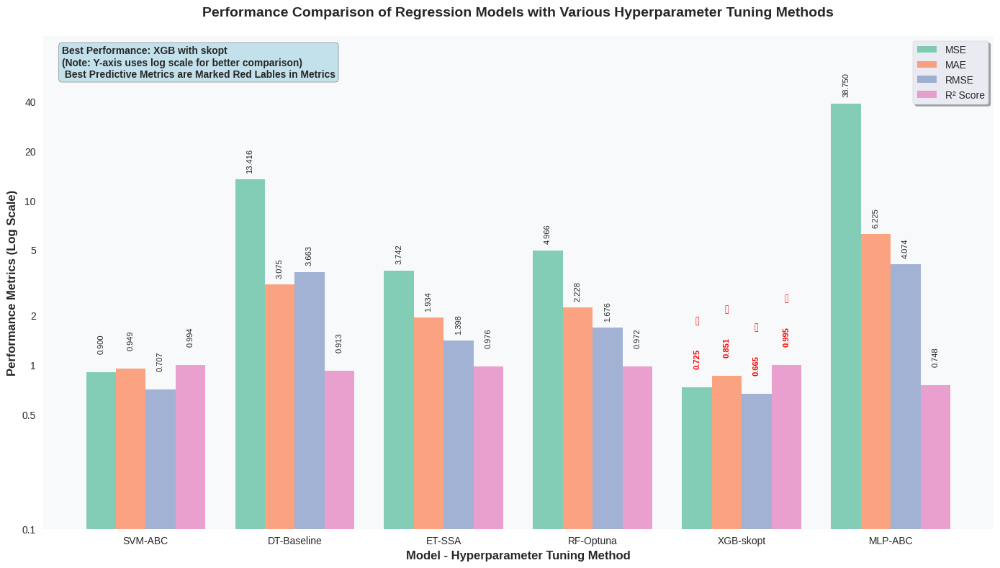

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Set the style for better aesthetics
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Create the data from the table
data = {
    'Model_HPT': ['SVM-ABC', 'DT-Baseline', 'ET-SSA', 'RF-Optuna', 'XGB-skopt', 'MLP-ABC'],
    'MSE': [0.899891, 13.41579, 3.741631, 4.965561, 0.724816, 38.74982],
    'MAE': [0.948626, 3.07455, 1.934330, 2.228354, 0.851362, 6.224935],
    'RMSE': [0.707181, 3.662758, 1.398252, 1.676344, 0.665175, 4.074074],
    'R²_Score': [0.99415, 0.912784, 0.975676, 0.971604, 0.995288, 0.748088]
}

# Convert to DataFrame
df = pd.DataFrame(data)

# Set up the matplotlib figure with better size
fig, ax = plt.subplots(figsize=(14, 8))

# Define the width of bars and positions
bar_width = 0.2
x = np.arange(len(df['Model_HPT']))

# Create beautiful color palette
colors = sns.color_palette("Set2", 4)

# Create the grouped bars
bars1 = ax.bar(x - 1.5*bar_width, df['MSE'], bar_width, label='MSE', color=colors[0], alpha=0.8)
bars2 = ax.bar(x - 0.5*bar_width, df['MAE'], bar_width, label='MAE', color=colors[1], alpha=0.8)
bars3 = ax.bar(x + 0.5*bar_width, df['RMSE'], bar_width, label='RMSE', color=colors[2], alpha=0.8)
bars4 = ax.bar(x + 1.5*bar_width, df['R²_Score'], bar_width, label='R² Score', color=colors[3], alpha=0.8)

# Set logarithmic scale for y-axis to better show the range of values
ax.set_yscale('log')

# Set custom y-axis limits and ticks for better visualization
ax.set_ylim(0.1, 100)
ax.set_yticks([0.1, 0.5, 1, 2, 5, 10, 20, 40])
ax.set_yticklabels(['0.1', '0.5', '1', '2', '5', '10', '20', '40'])

# Function to add value labels on bars with 90-degree rotation
def add_value_labels(bars, values, best_indices=None):
    for i, (bar, value) in enumerate(zip(bars, values)):
        height = bar.get_height()
        # Adjust text position for log scale
        if height < 1:
            text_height = height * 1.3
        else:
            text_height = height * 1.1

        # Add text with 90-degree rotation
        text = ax.text(bar.get_x() + bar.get_width()/2., text_height,
                      f'{value:.3f}', ha='center', va='bottom',
                      rotation=90, fontsize=8, fontweight='normal')

        # Highlight the best values (XGB with skopt - index 4)
        if best_indices and i in best_indices:
            text.set_fontweight('bold')
            text.set_color('red')
            # Add a star marker for best performance
            star_height = text_height * 1.8 if height < 1 else text_height * 1.3
            ax.text(bar.get_x() + bar.get_width()/2., star_height,
                   '★', ha='center', va='bottom', fontsize=12, color='red')

# Add value labels for each metric (XGB-skopt is the best - index 4)
add_value_labels(bars1, df['MSE'], [4])  # XGB has best MSE
add_value_labels(bars2, df['MAE'], [4])  # XGB has best MAE
add_value_labels(bars3, df['RMSE'], [4])  # XGB has best RMSE
add_value_labels(bars4, df['R²_Score'], [4])  # XGB has best R² Score

# Customize the plot
ax.set_xlabel('Model - Hyperparameter Tuning Method', fontsize=12, fontweight='bold')
ax.set_ylabel('Performance Metrics (Log Scale)', fontsize=12, fontweight='bold')
ax.set_title('Performance Comparison of Regression Models with Various Hyperparameter Tuning Methods',
             fontsize=14, fontweight='bold', pad=20)

# Set x-axis labels
ax.set_xticks(x)
ax.set_xticklabels(df['Model_HPT'],  ha='center')

# Add legend with better positioning
ax.legend(loc='upper right', frameon=True, fancybox=True, shadow=True)

# Add grid for better readability
ax.grid(True, alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

# Add a text box highlighting the best performer
textstr = 'Best Performance: XGB with skopt \n(Note: Y-axis uses log scale for better comparison)\n Best Predictive Metrics are Marked Red Lables in Metrics'
props = dict(boxstyle='round', facecolor='lightblue', alpha=0.7)
ax.text(0.02, 0.98, textstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', bbox=props, fontweight='bold')

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Add a subtle background color
fig.patch.set_facecolor('white')
ax.set_facecolor('#f8f9fa')

# Show the plot
plt.show()

# Optional: Save the figure
# plt.savefig('model_performance_comparison.png', dpi=300, bbox_inches='tight',
#             facecolor='white', edgecolor='none')